In [1]:
import pandas as pd
import numpy as np
# import graphviz
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
import scipy.stats as stats
import warnings

from statsmodels.formula.api import ols
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler
from sklearn.tree import export_graphviz
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.api import qqplot, add_constant
from sklearn.metrics import r2_score

warnings.filterwarnings('ignore')
import platform
# if platform.system() == 'Windows':
#     plt.rcParams['font.family'] = 'Malgun Gothic'  # 윈도우 환경에서는 'Malgun Gothic' 폰트를 사용
# elif platform.system() == 'Darwin' or 'macOS': # Mac
#     plt.rc('font', family='AppleGothic') # 맥: 애플고딕
# else:
#     plt.rcParams['font.family'] = 'AppleGothic'  # macOS나 Linux 등 다른 환경에서는 'AppleGothic' 폰트를 사용

# matplotlib.rcParams['axes.unicode_minus'] = False
# Mac에서 AppleGothic 설정
plt.rcParams['font.family'] = 'AppleGothic'

# 마이너스 깨짐 방지
plt.rcParams['axes.unicode_minus'] = False

In [2]:
#데이터 불러오기
df_1= pd.read_csv("/Users/yenqkr/Downloads/bda_project/sts_1sm_cc_1.csv", encoding = 'euc-kr')
df_2= pd.read_csv("/Users/yenqkr/Downloads/bda_project/sts_2fur_hr_2.csv", encoding = 'euc-kr')
df_3= pd.read_csv("/Users/yenqkr/Downloads/bda_project/sts_3ap_3.csv", encoding = 'euc-kr')

In [3]:
df_3[df_3.isnull().any(axis=1)]

,judge,hr_coil_id,ap_plant,ap_prod_id,ap_date,ap_shift,ap_thick,ap_width,ap_line_speed
72,불량,A699675,2공장,Y87955,2025-09-14,D,4.88,1257.0,NaN
199,불량,B717855,2공장,Y90298,2025-09-26,B,3.32,1258.0,NaN
666,양품,A677985,2공장,Y87368,2025-09-02,D,2.97,NaN,NaN
1023,양품,A685224,2공장,NaN,2025-09-08,C,2.94,1039.0,50.0
1024,양품,A685234,2공장,NaN,2025-09-08,C,2.93,1038.0,50.0


In [4]:
print(df_1.shape)
print(df_2.shape)
print(df_3.shape)

(23649, 15)
(23652, 26)
(23641, 9)


In [5]:
(pd.to_datetime(df_1['cast_date']).dt.to_period('M')).value_counts()

cast_date
2025-08    9116
2025-07    7381
2025-09    5362
2025-06    1737
2025-05      45
2025-04       7
2025-02       1
Freq: M, Name: count, dtype: int64

In [6]:
df_3[df_3.isnull().any(axis=1)]

,judge,hr_coil_id,ap_plant,ap_prod_id,ap_date,ap_shift,ap_thick,ap_width,ap_line_speed
72,불량,A699675,2공장,Y87955,2025-09-14,D,4.88,1257.0,NaN
199,불량,B717855,2공장,Y90298,2025-09-26,B,3.32,1258.0,NaN
666,양품,A677985,2공장,Y87368,2025-09-02,D,2.97,NaN,NaN
1023,양품,A685224,2공장,NaN,2025-09-08,C,2.94,1039.0,50.0
1024,양품,A685234,2공장,NaN,2025-09-08,C,2.93,1038.0,50.0


<Axes: ylabel='f_bfg'>

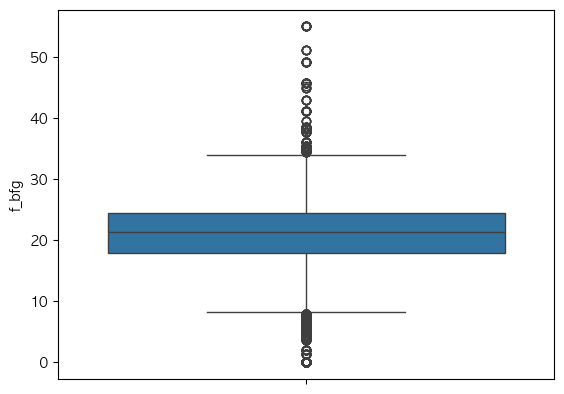

In [7]:
sns.boxplot(df_2['f_bfg'])

In [8]:
print(df_1.isnull().sum())
print(df_2.isnull().sum())
print(df_3.isnull().sum())

sm_plant         0
charge_id        0
steel_grade      0
steel_usage      0
delta_ferrite    0
ingre_cr         0
ingre_ni         0
ingre_s          0
cast_date        0
cc_gubun         0
tundish_temp     2
mlac_ratio       3
slab_no          0
slab_gubun       0
slab_grind       9
dtype: int64
charge_id          0
slab_no            0
furnace_no         0
f_jangip_gubun     0
f_jangip_temp      0
f_bfg              1
f_cog              2
f_ldg              0
f_bfg_per          1
f_cog_per          1
f_ldg_per          0
f_pre_temp         3
f_heat_temp        0
f_sock_temp        2
f_pre_interval     0
f_heat_interval    0
f_sock_interval    3
f_ext_date         0
f_ext_time         0
hr_coil_id         0
hr_date            0
hr_thick           0
hr_width           0
rm4_temp           0
rm_pitch           0
slab_width         0
dtype: int64
judge            0
hr_coil_id       0
ap_plant         0
ap_prod_id       2
ap_date          0
ap_shift         0
ap_thick         0
ap_width  

In [9]:
df_1.dropna(inplace=True)
df_2.dropna(inplace=True)
df_3.dropna(inplace=True)

In [10]:
print(df_1.isnull().sum())
print(df_2.isnull().sum())
print(df_3.isnull().sum())

sm_plant         0
charge_id        0
steel_grade      0
steel_usage      0
delta_ferrite    0
ingre_cr         0
ingre_ni         0
ingre_s          0
cast_date        0
cc_gubun         0
tundish_temp     0
mlac_ratio       0
slab_no          0
slab_gubun       0
slab_grind       0
dtype: int64
charge_id          0
slab_no            0
furnace_no         0
f_jangip_gubun     0
f_jangip_temp      0
f_bfg              0
f_cog              0
f_ldg              0
f_bfg_per          0
f_cog_per          0
f_ldg_per          0
f_pre_temp         0
f_heat_temp        0
f_sock_temp        0
f_pre_interval     0
f_heat_interval    0
f_sock_interval    0
f_ext_date         0
f_ext_time         0
hr_coil_id         0
hr_date            0
hr_thick           0
hr_width           0
rm4_temp           0
rm_pitch           0
slab_width         0
dtype: int64
judge            0
hr_coil_id       0
ap_plant         0
ap_prod_id       0
ap_date          0
ap_shift         0
ap_thick         0
ap_width  

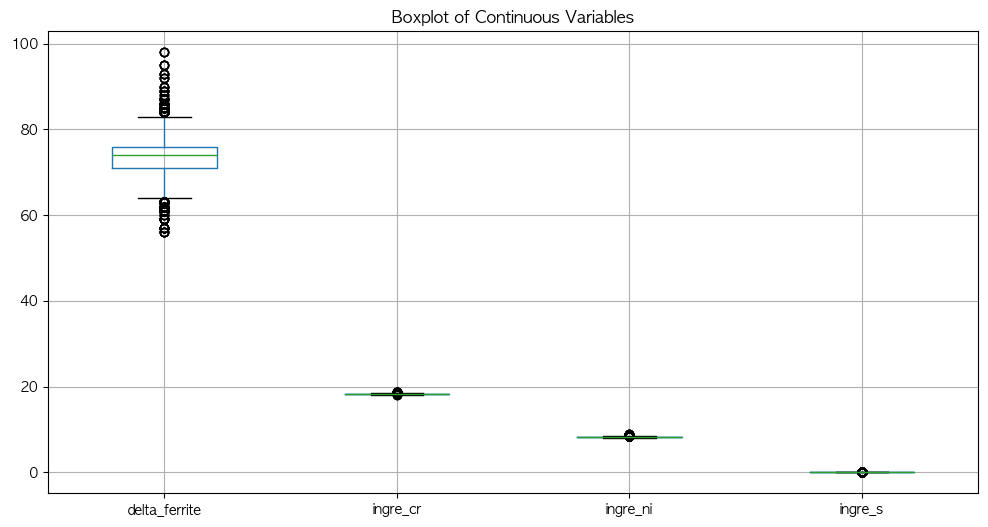

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# 연속형 변수만 선택
cols = ['delta_ferrite', 'ingre_cr', 'ingre_ni', 'ingre_s']

plt.figure(figsize=(12,6))
df_1[cols].boxplot()
plt.title('Boxplot of Continuous Variables')
plt.show()

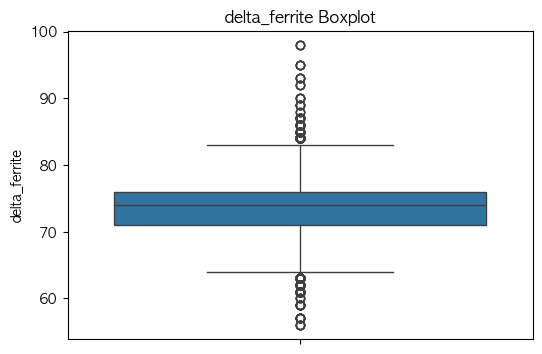

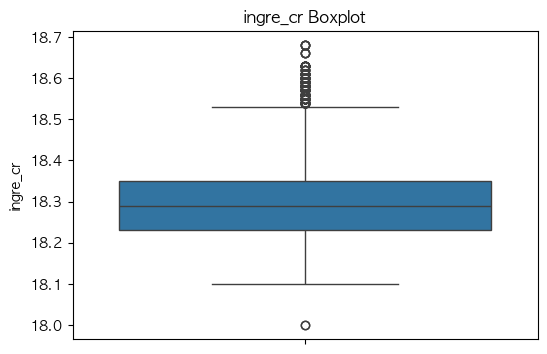

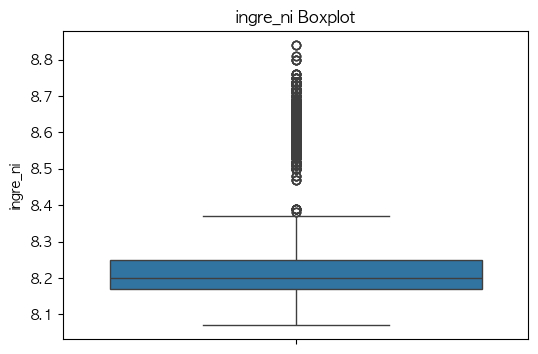

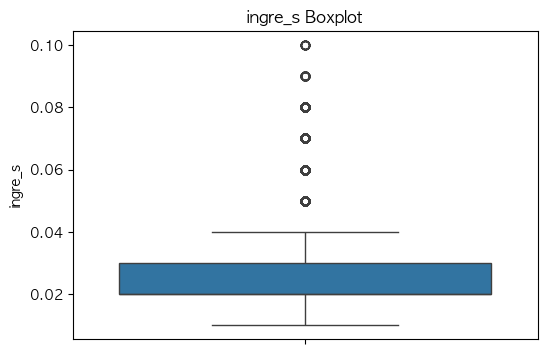

In [12]:
cols = ['delta_ferrite', 'ingre_cr', 'ingre_ni', 'ingre_s']

for col in cols:
    plt.figure(figsize=(6,4))
    sns.boxplot(y=df_1[col])
    plt.title(f'{col} Boxplot')
    plt.show()

In [13]:
from scipy import stats
import numpy as np

cols = ['delta_ferrite','ingre_cr','ingre_ni','ingre_s']

z_scores = np.abs(stats.zscore(df_1[cols]))

# threshold = 3 (보통 기준)
outliers = (z_scores > 3)

df_1[outliers.any(axis=1)]

,sm_plant,charge_id,steel_grade,steel_usage,delta_ferrite,ingre_cr,ingre_ni,ingre_s,cast_date,cc_gubun,tundish_temp,mlac_ratio,slab_no,slab_gubun,slab_grind
5,1공장,CH80154,C13,RZ1,68,18.40,8.22,0.08,2025-07-13,4연주,1478.0,95.9,411,C,MISS
6,1공장,CH80154,C13,RZ1,68,18.40,8.22,0.08,2025-07-13,4연주,1478.0,95.9,511,C,MISS
41,1공장,CH80168,C13,RJ1,74,18.29,8.23,0.07,2025-07-14,1연주,1486.0,94.8,511,C,HSHS
67,1공장,CH80278,C12,Other,61,18.29,8.64,0.04,2025-05-18,2연주,1492.0,93.5,211,C,MISS
68,1공장,CH80278,C12,RJ1,61,18.29,8.64,0.04,2025-06-18,1연주,1492.0,93.5,311,C,MISS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23505,2공장,CH49113,C13,Other,75,18.23,8.22,0.07,2025-07-12,2연주,1481.0,96.1,611,C,HSHS
23506,2공장,CH49113,C13,RJ1,75,18.23,8.22,0.07,2025-07-12,2연주,1481.0,96.1,111,C,HSHS
23514,2공장,CH49142,C13,RJ1,84,18.53,8.28,0.07,2025-07-13,4연주,1475.0,95.0,411,C,HSHS
23515,2공장,CH49142,C13,RJ1,84,18.53,8.28,0.07,2025-07-13,4연주,1475.0,95.0,511,C,HSHS


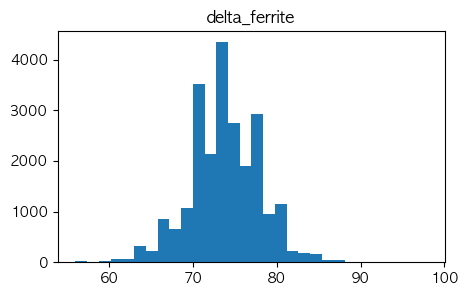

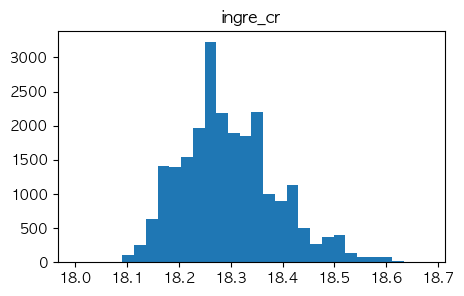

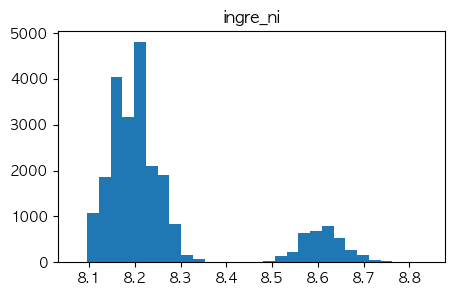

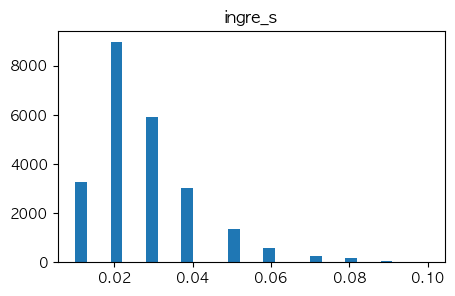

In [14]:
import matplotlib.pyplot as plt

for col in cols:
    plt.figure(figsize=(5,3))
    plt.hist(df_1[col], bins=30)
    plt.title(col)
    plt.show()

## 이상치 제거

In [15]:
print(df_1.columns)
print(df_2.columns)
print(df_3.columns)

print(len(df_2))


Index(['sm_plant', 'charge_id', 'steel_grade', 'steel_usage', 'delta_ferrite',
       'ingre_cr', 'ingre_ni', 'ingre_s', 'cast_date', 'cc_gubun',
       'tundish_temp', 'mlac_ratio', 'slab_no', 'slab_gubun', 'slab_grind'],
      dtype='object')
Index(['charge_id', 'slab_no', 'furnace_no', 'f_jangip_gubun', 'f_jangip_temp',
       'f_bfg', 'f_cog', 'f_ldg', 'f_bfg_per', 'f_cog_per', 'f_ldg_per',
       'f_pre_temp', 'f_heat_temp', 'f_sock_temp', 'f_pre_interval',
       'f_heat_interval', 'f_sock_interval', 'f_ext_date', 'f_ext_time',
       'hr_coil_id', 'hr_date', 'hr_thick', 'hr_width', 'rm4_temp', 'rm_pitch',
       'slab_width'],
      dtype='object')
Index(['judge', 'hr_coil_id', 'ap_plant', 'ap_prod_id', 'ap_date', 'ap_shift',
       'ap_thick', 'ap_width', 'ap_line_speed'],
      dtype='object')
23643


In [16]:
df_2= df_2[df_2['f_sock_temp']<1400]
df_2= df_2[df_2['f_sock_temp']>200]

<Axes: ylabel='f_sock_temp'>

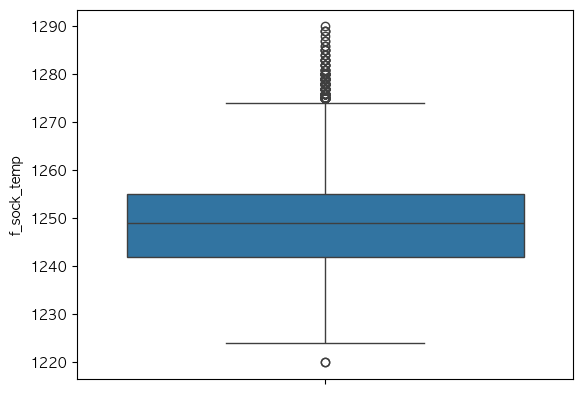

In [17]:
sns.boxplot(y=df_2['f_sock_temp'])

<Axes: ylabel='f_sock_interval'>

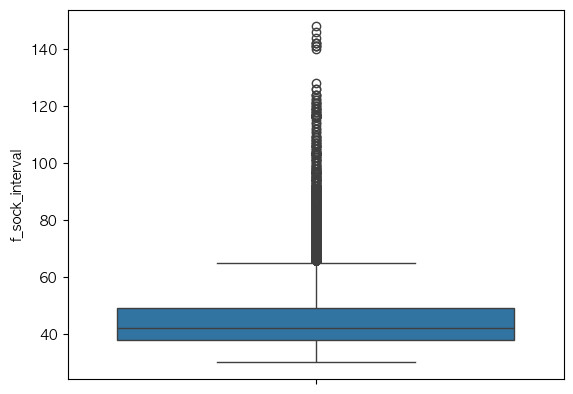

In [18]:
df_2= df_2[df_2['f_sock_interval']!=168]
sns.boxplot(y=df_2['f_sock_interval'])

In [19]:
df_2['hr_thick_group'] = np.select(
[
df_2['hr_thick'] <= 3.46,
(df_2['hr_thick'] >= 3.46) & (df_2['hr_thick'] <= 4.48),
df_2['hr_thick'] > 4.48
],
[
'얇음',
'중간',
'두꺼움'
],
default='기타'
)

In [20]:
print(len(df_2[df_2['hr_thick'] <= 3.05]))
print(len(df_2[(df_2['hr_thick'] >= 3.16) & (df_2['hr_thick'] <= 3.55)]))
print(len(df_2[(df_2['hr_thick'] >= 3.95) & (df_2['hr_thick'] <= 4.08)]))
print(len(df_2[df_2['hr_thick'] >= 4.94]))

12997
5442
2769
2428


In [21]:
len(df_2)

23640

In [22]:
# cast_date: 2월 데이터 제거
display(df_1.head())
print(df_1.info())


,sm_plant,charge_id,steel_grade,steel_usage,delta_ferrite,ingre_cr,ingre_ni,ingre_s,cast_date,cc_gubun,tundish_temp,mlac_ratio,slab_no,slab_gubun,slab_grind
0,1공장,CH80081,C12,RZ1,69,18.24,8.63,0.02,2025-05-09,2연주,1485.0,95.1,611,C,MISS
1,1공장,CH80092,C13,RZ1,70,18.45,8.34,0.03,2025-07-10,2연주,1496.0,100.0,511,M,MISS
2,1공장,CH80126,C13,RJ1,65,18.12,8.17,0.04,2025-07-12,1연주,1483.0,96.7,411,C,MISS
3,1공장,CH80126,C13,RZ1,65,18.12,8.17,0.04,2025-07-12,2연주,1483.0,96.7,311,C,MISS
4,1공장,CH80141,C13,RJ1,70,18.23,8.27,0.03,2025-07-12,2연주,1478.0,91.9,611,C,MISS


<class 'pandas.core.frame.DataFrame'>
Index: 23638 entries, 0 to 23648
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   sm_plant       23638 non-null  object 
 1   charge_id      23638 non-null  object 
 2   steel_grade    23638 non-null  object 
 3   steel_usage    23638 non-null  object 
 4   delta_ferrite  23638 non-null  int64  
 5   ingre_cr       23638 non-null  float64
 6   ingre_ni       23638 non-null  float64
 7   ingre_s        23638 non-null  float64
 8   cast_date      23638 non-null  object 
 9   cc_gubun       23638 non-null  object 
 10  tundish_temp   23638 non-null  float64
 11  mlac_ratio     23638 non-null  float64
 12  slab_no        23638 non-null  int64  
 13  slab_gubun     23638 non-null  object 
 14  slab_grind     23638 non-null  object 
dtypes: float64(5), int64(2), object(8)
memory usage: 2.9+ MB
None


In [23]:
df_1['cast_date']= pd.to_datetime(df_1['cast_date'], format= '%Y-%m-%d')
df_1= df_1[df_1['cast_date'].dt.month != 2]

In [24]:
cond = (
((df_2['f_bfg'] > 0) & (df_2['f_bfg_per'] == 0)) |
((df_2['f_cog'] > 0) & (df_2['f_cog_per'] == 0))
)

df_2 = df_2[~cond].copy()

## 데이터 병합

In [25]:
#df_1 에서 charge_id 랑 slab_no 를 묶어 중복값 확인
duplicates_df_sts1 = df_1[df_1.duplicated(subset=['charge_id', 'slab_no'], keep=False)]
# 결과 확인
print("--- df1의 중복 키 행 ---")
print(duplicates_df_sts1.sort_values(by=['charge_id', 'slab_no']))

--- df1의 중복 키 행 ---
Empty DataFrame
Columns: [sm_plant, charge_id, steel_grade, steel_usage, delta_ferrite, ingre_cr, ingre_ni, ingre_s, cast_date, cc_gubun, tundish_temp, mlac_ratio, slab_no, slab_gubun, slab_grind]
Index: []


In [26]:
duplicates_df_sts2 = df_2[df_2.duplicated(subset=['charge_id', 'slab_no'], keep=False)]
# 결과 확인
print("--- df2의 중복 키 행 ---")
print(duplicates_df_sts2.sort_values(by=['charge_id', 'slab_no']))

--- df2의 중복 키 행 ---
  charge_id  slab_no furnace_no f_jangip_gubun  f_jangip_temp  f_bfg   f_cog  \
3   CH42171      511        1호기            CCR             30  24.37  35.202   
4   CH42171      511        4호기            CCR             30  24.37  35.202   

   f_ldg  f_bfg_per  f_cog_per  ...  f_ext_date  f_ext_time  hr_coil_id  \
3    0.0   40.90848   59.09152  ...  2025-08-07          17     U700364   
4    0.0   40.90848   59.09152  ...  2025-08-07          17     U700364   

      hr_date  hr_thick  hr_width  rm4_temp rm_pitch  slab_width  \
3  2025-08-07      3.04      1248      1116       91        1240   
4  2025-08-07      3.04      1248      1116       91        1240   

  hr_thick_group  
3             얇음  
4             얇음  

[2 rows x 27 columns]


In [27]:
index_to_remove = [3,4] # 3,4 번은 furnace_no 이외의 모든값이 동일 하므로 판단불가 및 2개 제품 모두 양품
df2_cleaned = df_2.drop(index_to_remove)
df_2 = df2_cleaned.reset_index(drop=True)

In [28]:
print("--- df2의 중복 키 행 ---")

print(df_2.sort_values(by=['charge_id', 'slab_no']))

--- df2의 중복 키 행 ---
      charge_id  slab_no furnace_no f_jangip_gubun  f_jangip_temp   f_bfg  \
0       CH42126      511        4호기            CCR             30  23.750   
1       CH42126      611        1호기            CCR             30  23.750   
2       CH42157      511        3호기            CCR             30  24.370   
3       CH42193      411        3호기            CCR             30  26.308   
4       CH42207      611        4호기            CCR             30  23.666   
...         ...      ...        ...            ...            ...     ...   
23631   CH87509      511        3호기            HCR            420  18.985   
23632   CH87510      111        2호기            HCR            412  18.985   
23633   CH87510      211        1호기            HCR            398  18.985   
23634   CH87510      311        1호기            CCR            140  22.517   
23635   CH87516      511        1호기            HCR            499  23.257   

        f_cog  f_ldg  f_bfg_per  f_cog_per  ...  f_ext_

In [29]:
merged_df = pd.merge(df_1, df_2, on=['charge_id', 'slab_no'], how='inner')

# 3. 2단계 병합: 열연(HR)과 소둔산세(AP) 연결
# hr_coil_id를 기준으로 최종 결과 매칭
final_df = pd.merge(merged_df, df_3, on='hr_coil_id', how='inner')

# 4. 결과 확인
print(f"최종 병합 데이터 형태: {final_df.shape}")
final_df.head()

최종 병합 데이터 형태: (23632, 48)


,sm_plant,charge_id,steel_grade,steel_usage,delta_ferrite,ingre_cr,ingre_ni,ingre_s,cast_date,cc_gubun,...,slab_width,hr_thick_group,judge,ap_plant,ap_prod_id,ap_date,ap_shift,ap_thick,ap_width,ap_line_speed
0,1공장,CH80081,C12,RZ1,69,18.24,8.63,0.02,2025-05-09,2연주,...,1020,얇음,양품,2공장,X91819,2025-08-10,A,2.93,1003.0,47.00
1,1공장,CH80092,C13,RZ1,70,18.45,8.34,0.03,2025-07-10,2연주,...,1240,얇음,불량,1공장,A16946,2025-08-30,B,2.89,1257.0,43.30
2,1공장,CH80126,C13,RJ1,65,18.12,8.17,0.04,2025-07-12,1연주,...,1030,중간,불량,2공장,Y77190,2025-08-11,B,3.41,1035.0,42.57
3,1공장,CH80126,C13,RZ1,65,18.12,8.17,0.04,2025-07-12,2연주,...,1030,두꺼움,양품,2공장,Y77493,2025-08-17,A,4.97,1036.0,29.70
4,1공장,CH80141,C13,RJ1,70,18.23,8.27,0.03,2025-07-12,2연주,...,1020,두꺼움,양품,1공장,A15211,2025-08-07,D,4.88,1037.0,31.00


In [30]:
#데이터값 오류에 대한 정정 코드 (교수님 문의 완료)
final_df["delta_ferrite"] = final_df["delta_ferrite"].astype(float) * 0.1

In [31]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23632 entries, 0 to 23631
Data columns (total 48 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   sm_plant         23632 non-null  object        
 1   charge_id        23632 non-null  object        
 2   steel_grade      23632 non-null  object        
 3   steel_usage      23632 non-null  object        
 4   delta_ferrite    23632 non-null  float64       
 5   ingre_cr         23632 non-null  float64       
 6   ingre_ni         23632 non-null  float64       
 7   ingre_s          23632 non-null  float64       
 8   cast_date        23632 non-null  datetime64[ns]
 9   cc_gubun         23632 non-null  object        
 10  tundish_temp     23632 non-null  float64       
 11  mlac_ratio       23632 non-null  float64       
 12  slab_no          23632 non-null  int64         
 13  slab_gubun       23632 non-null  object        
 14  slab_grind       23632 non-null  objec

In [32]:
final_df.to_csv('final_bda.csv')

In [33]:
final_df.shape

(23632, 48)

## 파생변수

In [34]:
# 파생변수
cols = [
    'f_pre_temp', 'f_heat_temp', 'f_sock_temp',
    'f_pre_interval', 'f_heat_interval', 'f_sock_interval',
    'hr_width', 'hr_thick'
]

final_df[cols] = final_df[cols].apply(pd.to_numeric, errors='coerce')



# 1. 총 재로시간
final_df['f_total_time'] = (
    final_df['f_pre_interval'] +
    final_df['f_heat_interval'] +
    final_df['f_sock_interval']
)


#2. 열간 압연 날짜 - 연주 날짜 
final_df['hr_date'] = pd.to_datetime(final_df['hr_date'], errors='coerce')
final_df['cast_date'] = pd.to_datetime(final_df['cast_date'], errors='coerce')

final_df['process_delay_time1'] = (
    final_df['hr_date'] - final_df['cast_date']
).dt.days


#3. 가열온도 - 예열온도
final_df['heat_pre_diff'] = final_df['f_heat_temp'] - final_df['f_pre_temp']

#4. 균열온도 - 압연온도
final_df['sock_rm4_diff'] = final_df['f_sock_temp'] - final_df['rm4_temp']




# 확인
final_df[
    [
        'f_total_time',
        'process_delay_time1',
        'heat_pre_diff',
        'sock_rm4_diff'
        
    ]

].head()

,f_total_time,process_delay_time1,heat_pre_diff,sock_rm4_diff
0,242.0,54,138.0,161.0
1,183.0,48,118.0,120.0
2,183.0,27,125.0,148.0
3,179.0,27,119.0,131.0
4,177.0,23,128.0,146.0


In [35]:
final_df.to_csv('final_project.csv')

## 검정

### 2 sample t-test

In [36]:
from scipy.stats import ttest_ind
import pandas as pd

# 1️⃣ 변수 리스트
features = [
    'delta_ferrite', 'ingre_cr', 'ingre_ni', 'ingre_s', 'tundish_temp',
    'mlac_ratio', 'f_jangip_temp', 'f_bfg', 'f_cog', 'f_ldg',
    'f_bfg_per', 'f_cog_per', 'f_ldg_per', 'f_pre_temp', 'f_heat_temp',
    'f_sock_temp', 'f_pre_interval', 'f_heat_interval', 'f_sock_interval',
    'f_ext_time', 'hr_thick', 'hr_width', 'rm4_temp', 'rm_pitch',
    'slab_width', 'ap_thick', 'ap_width', 'ap_line_speed',
    'f_total_time', 'process_delay_time1', 'heat_pre_diff', 'sock_rm4_diff'
]

# 2️⃣ 결과 저장
result = []

for col in features:
    
    # 결측 제거
    g0 = final_df[final_df['judge'] == '양품'][col].dropna()
    g1 = final_df[final_df['judge'] == '불량'][col].dropna()
    
    # t-test (Welch 추천)
    t_stat, p_val = ttest_ind(g0, g1, equal_var=False)
    
    result.append({
        '변수': col,
        '양품_mean': g0.mean(),
        '불량_mean': g1.mean(),
        't_stat': t_stat,
        'p_value': p_val,
        '유의여부(p<0.05)': 'O' if p_val < 0.05 else 'X'
    })

# 3️⃣ DataFrame 정리
result_df = pd.DataFrame(result)

# 4️⃣ p-value 기준 정렬
result_df = result_df.sort_values(by='p_value')

print(result_df.round(3))

                     변수   양품_mean   불량_mean  t_stat  p_value 유의여부(p<0.05)
6         f_jangip_temp   267.925   135.884  23.329    0.000            O
29  process_delay_time1     3.281     7.073  -8.398    0.000            O
18      f_sock_interval    45.314    49.499  -7.466    0.000            O
28         f_total_time   192.947   206.362  -7.108    0.000            O
13           f_pre_temp  1100.553  1105.397  -6.860    0.000            O
30        heat_pre_diff   148.654   144.320   5.872    0.000            O
27        ap_line_speed    42.232    40.591   5.721    0.000            O
20             hr_thick     3.435     3.574  -4.583    0.000            O
25             ap_thick     3.301     3.435  -4.504    0.000            O
15          f_sock_temp  1249.245  1250.998  -4.176    0.000            O
16       f_pre_interval    89.670    93.906  -3.571    0.000            O
17      f_heat_interval    57.962    62.957  -3.263    0.001            O
22             rm4_temp  1116.912  111

In [37]:
g0

0        161.0
3        131.0
4        146.0
5        127.0
6        146.0
         ...  
23627    129.0
23628    126.0
23629    137.0
23630    136.0
23631    117.0
Name: sock_rm4_diff, Length: 23003, dtype: float64

### 카이제곱검정

In [38]:
from scipy.stats import chi2_contingency
import pandas as pd

# 1️⃣ 범주형 변수 리스트
cat_features = [
    'slab_no', 'sm_plant', 'steel_grade', 'steel_usage', 'cc_gubun',
    'slab_gubun', 'slab_grind', 'furnace_no', 'f_jangip_gubun',
    'hr_thick_group', 'ap_plant', 'ap_shift','cast_date','f_ext_date','hr_date','ap_date'
    
]

# 2️⃣ 결과 저장
results = []

for col in cat_features:
    
    # 교차표 생성
    table = pd.crosstab(final_df[col], final_df['judge'])
    
    # 카이제곱 검정
    chi2, p, dof, expected = chi2_contingency(table)
    
    results.append({
        '변수': col,
        'chi2_stat': chi2,
        'p_value': p,
        '유의여부(p<0.05)': 'O' if p < 0.05 else 'X'
    })

# 3️⃣ 결과 정리
result_df = pd.DataFrame(results).sort_values(by='p_value')

print(result_df.round(4))

                변수  chi2_stat  p_value 유의여부(p<0.05)
13      f_ext_date   552.2103   0.0000            O
14         hr_date   552.2103   0.0000            O
12       cast_date   588.5442   0.0000            O
8   f_jangip_gubun   242.6173   0.0000            O
15         ap_date   434.3967   0.0000            O
3      steel_usage   131.4020   0.0000            O
6       slab_grind    59.5187   0.0000            O
1         sm_plant    41.5651   0.0000            O
11        ap_shift    43.9906   0.0000            O
0          slab_no    40.3471   0.0000            O
9   hr_thick_group    17.6028   0.0002            O
10        ap_plant     9.6620   0.0019            O
7       furnace_no    14.4354   0.0024            O
2      steel_grade     1.6538   0.1984            X
5       slab_gubun     1.7632   0.4141            X
4         cc_gubun     1.4781   0.6873            X


In [39]:
len(features)

32

In [40]:
len(cat_features)

16

In [41]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23632 entries, 0 to 23631
Data columns (total 52 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   sm_plant             23632 non-null  object        
 1   charge_id            23632 non-null  object        
 2   steel_grade          23632 non-null  object        
 3   steel_usage          23632 non-null  object        
 4   delta_ferrite        23632 non-null  float64       
 5   ingre_cr             23632 non-null  float64       
 6   ingre_ni             23632 non-null  float64       
 7   ingre_s              23632 non-null  float64       
 8   cast_date            23632 non-null  datetime64[ns]
 9   cc_gubun             23632 non-null  object        
 10  tundish_temp         23632 non-null  float64       
 11  mlac_ratio           23632 non-null  float64       
 12  slab_no              23632 non-null  int64         
 13  slab_gubun           23632 non-

## EDA - 소둔/산세

ex. 1호기일때 더 좋다?

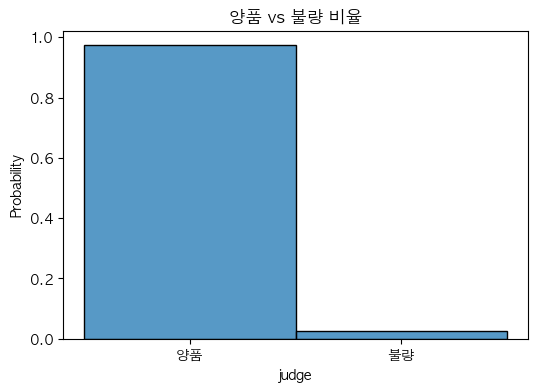

In [42]:
# 3. 목표변수 분포 확인 (불균형 데이터 확인)
plt.figure(figsize=(6, 4))
sns.histplot(data=final_df, x='judge', stat='probability')
plt.title('양품 vs 불량 비율')
plt.show()

In [43]:
final_df['hr_coil_id'].value_counts(ascending=False)

hr_coil_id
V694664    1
X718634    1
X716434    1
X716444    1
X716414    1
          ..
B716944    1
B716934    1
B717004    1
B716994    1
F731854    1
Name: count, Length: 23632, dtype: int64

In [44]:
final_df['ap_prod_id'].value_counts(ascending=False)

ap_prod_id
X91819    1
A22720    1
Y82905    1
Y82906    1
Y82903    1
         ..
A30793    1
A30792    1
A30799    1
A30798    1
A39283    1
Name: count, Length: 23632, dtype: int64

hr_coil_id, ap_prod_id 전부 unique 값

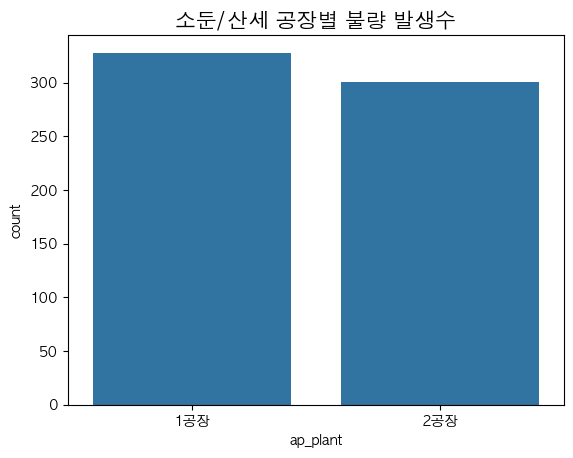

In [45]:
sns.countplot(
    x='ap_plant',
    data=df_3[df_3['judge'] == '불량']
)
plt.title('소둔/산세 공장별 불량 발생수', fontsize=15)
plt.xticks(rotation=0) # 글자가 겹치면 회전
plt.show()

1공장이 불량 더 많이 일어남

In [46]:
order = sorted(df_3['ap_shift'].unique())
order

['A', 'B', 'C', 'D']

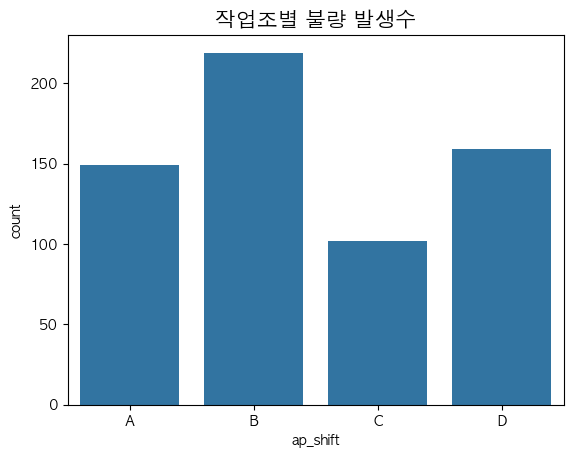

In [47]:
order = sorted(df_3['ap_shift'].unique())

sns.countplot(
    x='ap_shift',
    data=df_3[df_3['judge'] == '불량'],
    order=order
)

plt.title('작업조별 불량 발생수', fontsize=15)
plt.xticks(rotation=0)
plt.show()

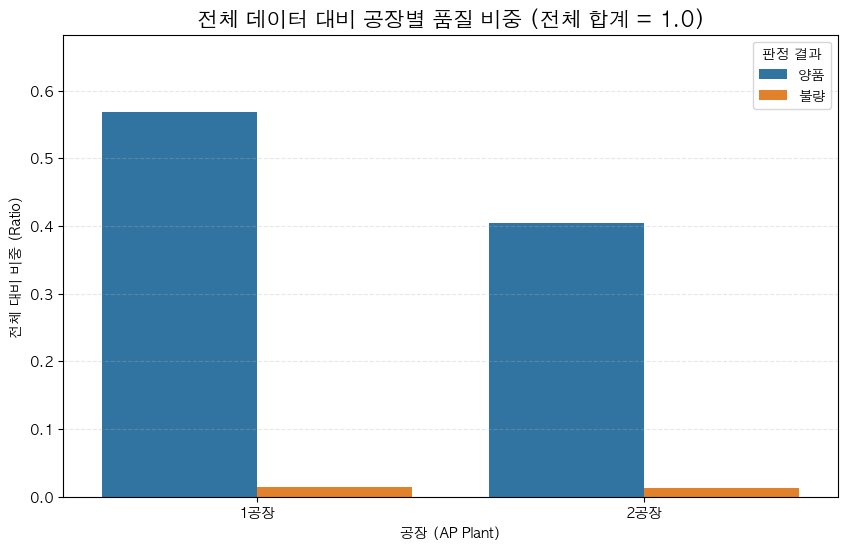

전체 비율 합계: 1.0


In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 2. 전체 대비 비율 계산 (1공장+2공장 전체 합이 1이 됨)
# value_counts(normalize=True)를 그룹화 없이 전체 시리즈에 적용
df_total_ratio = (
    df_3[['ap_plant', 'judge']]
    .value_counts(normalize=True) # 전체 행 수 대비 각 조합의 비율 계산
    .rename('ratio')
    .reset_index()
)

# 3. 그래프 그리기
plt.figure(figsize=(10, 6))
# x축을 공장으로, hue를 판정으로 설정하여 전체에서의 비중 시각화
ax = sns.barplot(x='ap_plant', y='ratio', hue='judge', data=df_total_ratio)

plt.title('전체 데이터 대비 공장별 품질 비중 (전체 합계 = 1.0)', fontsize=15)
plt.ylabel('전체 대비 비중 (Ratio)')
plt.xlabel('공장 (AP Plant)')
plt.ylim(0, df_total_ratio['ratio'].max() * 1.2) # 라벨 표시 여유 공간
plt.legend(title='판정 결과')
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.show()

# 검증: 모든 ratio의 합이 1인지 확인
print(f"전체 비율 합계: {df_total_ratio['ratio'].sum():.1f}")

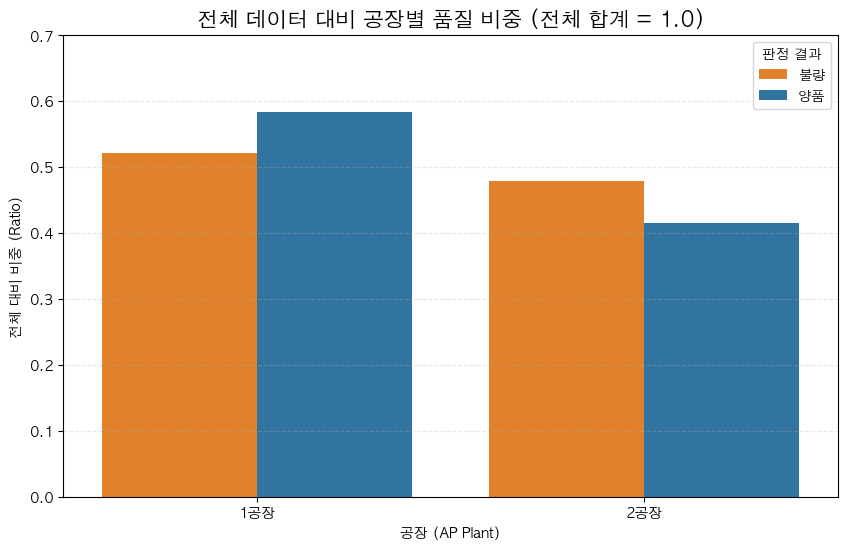

전체 비율 합계: 2.0


In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 2. 전체 대비 비율 계산 (1공장+2공장 전체 합이 1이 됨)
# value_counts(normalize=True)를 그룹화 없이 전체 시리즈에 적용
df_total_ratio = (
    df_3.groupby('judge')['ap_plant']
    .value_counts(normalize=True)
    .rename('ratio')
    .reset_index()
)

# 3. 그래프 그리기
plt.figure(figsize=(10, 6))
# x축을 공장으로, hue를 판정으로 설정하여 전체에서의 비중 시각화
ax = sns.barplot(x='ap_plant', y='ratio', hue='judge', data=df_total_ratio,palette={'양품': '#1f77b4', '불량': '#ff7f0e'})

plt.title('전체 데이터 대비 공장별 품질 비중 (전체 합계 = 1.0)', fontsize=15)
plt.ylabel('전체 대비 비중 (Ratio)')
plt.xlabel('공장 (AP Plant)')
plt.ylim(0, df_total_ratio['ratio'].max() * 1.2) # 라벨 표시 여유 공간
plt.legend(title='판정 결과')
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.show()

# 검증: 모든 ratio의 합이 1인지 확인
print(f"전체 비율 합계: {df_total_ratio['ratio'].sum():.1f}")

In [50]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns


# # 2. 판정 결과(judge)별로 공장의 비중 계산
# # judge로 먼저 묶고, 그 안에서 ap_plant의 비율을 구합니다.
# df_split_ratio = (
#     df_3.groupby('judge')['ap_plant']
#     .value_counts(normalize=True) # 여기서 양품끼리 합 1, 불량끼리 합 1이 됨
#     .rename('ratio')
#     .reset_index()
# )

# # 3. 그래프 그리기
# plt.figure(figsize=(10, 6))
# # x축을 판정(judge)으로 두어 '양품 그룹'과 '불량 그룹'을 나눕니다.
# ax = sns.barplot(x='judge', y='ratio', hue='ap_plant', data=df_split_ratio,palette={'양품': '#1f77b4', '불량': '#ff7f0e'})

# plt.title('양품/불량별 공장 지분 비교 (그룹별 합계 = 1.0)', fontsize=15)
# plt.ylabel('그룹 내 비중 (Ratio)')
# plt.xlabel('판정 결과 (Judge)')
# plt.ylim(0, 1.1)
# plt.legend(title='공장 (Plant)')
# plt.grid(axis='y', linestyle='--', alpha=0.3)
# plt.show()

# # 검증용 출력
# print("--- 그룹별 비율 합계 체크 ---")
# print(df_split_ratio.groupby('judge')['ratio'].sum())

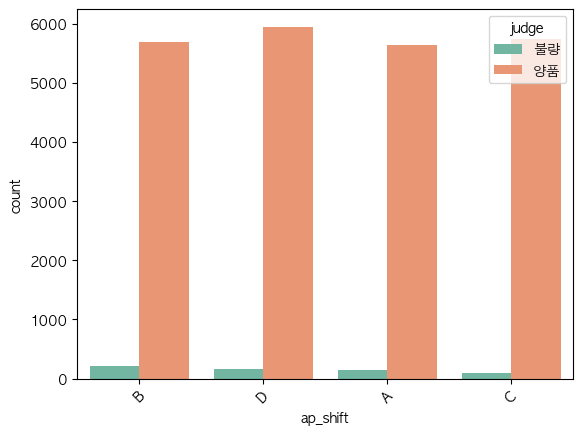

In [51]:
sns.countplot(x='ap_shift', data=df_3, hue='judge',palette='Set2')
plt.xticks(rotation=45) # 글자가 겹치면 회전
plt.show()

비슷

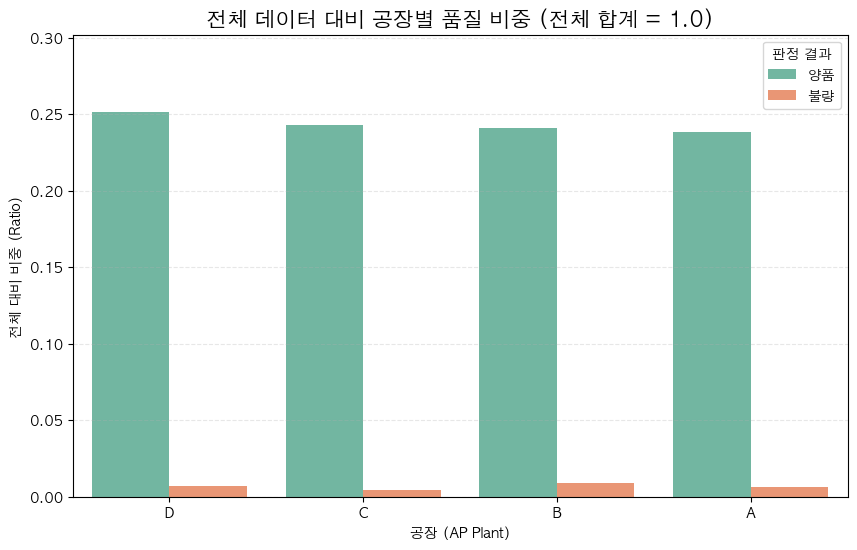

전체 비율 합계: 1.0


In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 2. 전체 대비 비율 계산 (1공장+2공장 전체 합이 1이 됨)
# value_counts(normalize=True)를 그룹화 없이 전체 시리즈에 적용
df_total_ratio = (
    df_3[['ap_shift', 'judge']]
    .value_counts(normalize=True) # 전체 행 수 대비 각 조합의 비율 계산
    .rename('ratio')
    .reset_index()
)

# 3. 그래프 그리기
plt.figure(figsize=(10, 6))
# x축을 공장으로, hue를 판정으로 설정하여 전체에서의 비중 시각화
ax = sns.barplot(x='ap_shift', y='ratio', hue='judge', data=df_total_ratio, palette='Set2')

plt.title('전체 데이터 대비 공장별 품질 비중 (전체 합계 = 1.0)', fontsize=15)
plt.ylabel('전체 대비 비중 (Ratio)')
plt.xlabel('공장 (AP Plant)')
plt.ylim(0, df_total_ratio['ratio'].max() * 1.2) # 라벨 표시 여유 공간
plt.legend(title='판정 결과')
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.show()

# 검증: 모든 ratio의 합이 1인지 확인
print(f"전체 비율 합계: {df_total_ratio['ratio'].sum():.1f}")

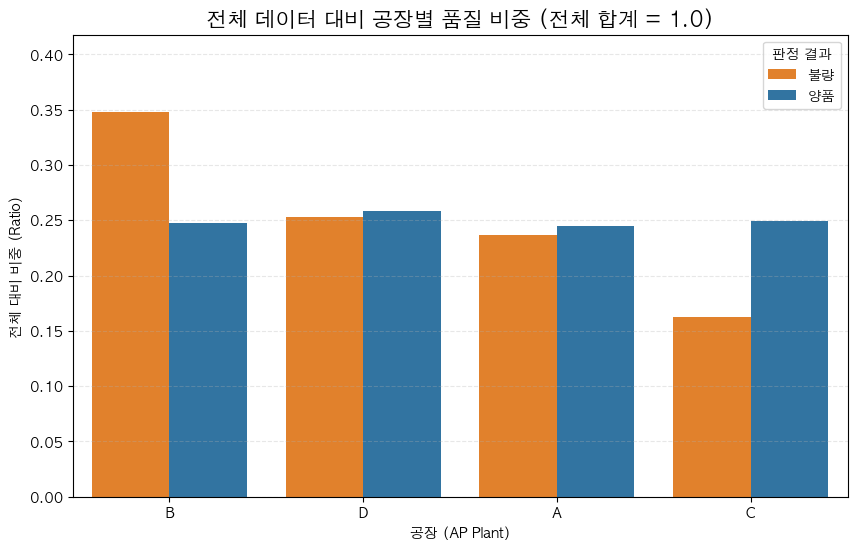

전체 비율 합계: 2.0


In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 2. 전체 대비 비율 계산 (1공장+2공장 전체 합이 1이 됨)
# value_counts(normalize=True)를 그룹화 없이 전체 시리즈에 적용
df_total_ratio = (
    df_3.groupby('judge')['ap_shift']
    .value_counts(normalize=True)
    .rename('ratio')
    .reset_index()
)

# 3. 그래프 그리기
plt.figure(figsize=(10, 6))
# x축을 공장으로, hue를 판정으로 설정하여 전체에서의 비중 시각화
ax = sns.barplot(x='ap_shift', y='ratio', hue='judge', data=df_total_ratio,palette={'양품': '#1f77b4', '불량': '#ff7f0e'})

plt.title('전체 데이터 대비 공장별 품질 비중 (전체 합계 = 1.0)', fontsize=15)
plt.ylabel('전체 대비 비중 (Ratio)')
plt.xlabel('공장 (AP Plant)')
plt.ylim(0, df_total_ratio['ratio'].max() * 1.2) # 라벨 표시 여유 공간
plt.legend(title='판정 결과')
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.show()

# 검증: 모든 ratio의 합이 1인지 확인
print(f"전체 비율 합계: {df_total_ratio['ratio'].sum():.1f}")

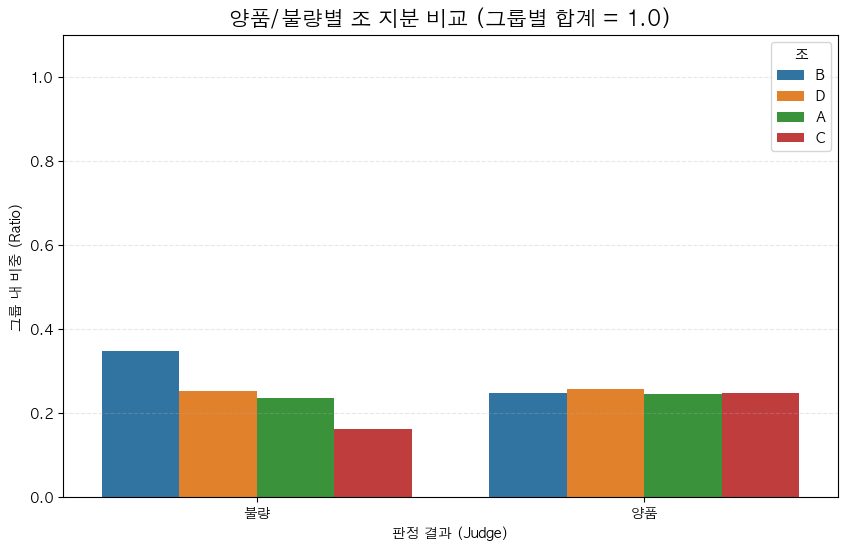

--- 그룹별 비율 합계 체크 ---
judge
불량    1.0
양품    1.0
Name: ratio, dtype: float64


In [54]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# 2. 판정 결과(judge)별로 공장의 비중 계산
# judge로 먼저 묶고, 그 안에서 ap_plant의 비율을 구합니다.
df_split_ratio = (
    df_3.groupby('judge')['ap_shift']
    .value_counts(normalize=True) # 여기서 양품끼리 합 1, 불량끼리 합 1이 됨
    .rename('ratio')
    .reset_index()
)

# 3. 그래프 그리기
plt.figure(figsize=(10, 6))
# x축을 판정(judge)으로 두어 '양품 그룹'과 '불량 그룹'을 나눕니다.
ax = sns.barplot(x='judge', y='ratio', hue='ap_shift', data=df_split_ratio)

plt.title('양품/불량별 조 지분 비교 (그룹별 합계 = 1.0)', fontsize=15)
plt.ylabel('그룹 내 비중 (Ratio)')
plt.xlabel('판정 결과 (Judge)')
plt.ylim(0, 1.1)
plt.legend(title='조')
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.show()

# 검증용 출력
print("--- 그룹별 비율 합계 체크 ---")
print(df_split_ratio.groupby('judge')['ratio'].sum())

양품은 비슷한데 불량은 B가 제일 비율이 높다

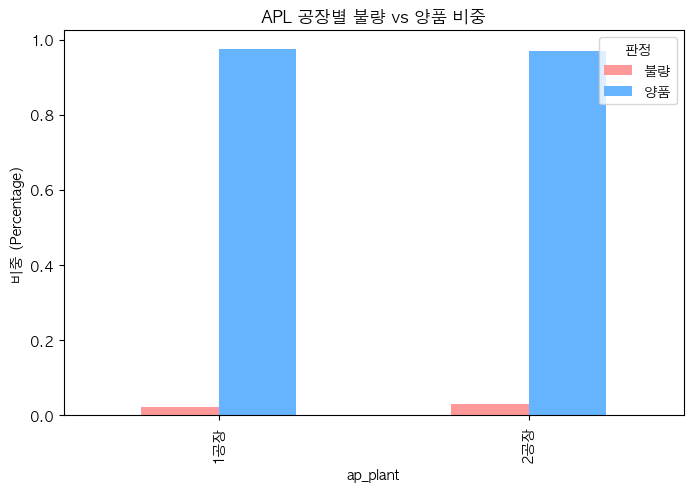

In [55]:
ct_norm = pd.crosstab(final_df['ap_plant'], final_df['judge'], normalize='index')
ct_norm.plot(
    kind='bar',
    stacked=False, 
    figsize=(8, 5),
    color=['#ff9999', '#66b3ff']
)

plt.title('APL 공장별 불량 vs 양품 비중')
plt.ylabel('비중 (Percentage)')
plt.legend(title='판정', loc='upper right')
plt.show()

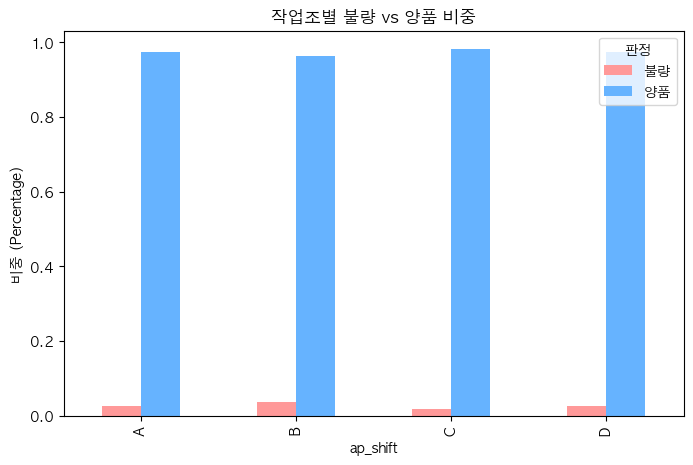

In [56]:
ct_norm = pd.crosstab(final_df['ap_shift'], final_df['judge'], normalize='index')
ct_norm.plot(
    kind='bar',
    stacked=False, 
    figsize=(8, 5),
    color=['#ff9999', '#66b3ff']
)

plt.title('작업조별 불량 vs 양품 비중')
plt.ylabel('비중 (Percentage)')
plt.legend(title='판정', loc='upper right')
plt.show()

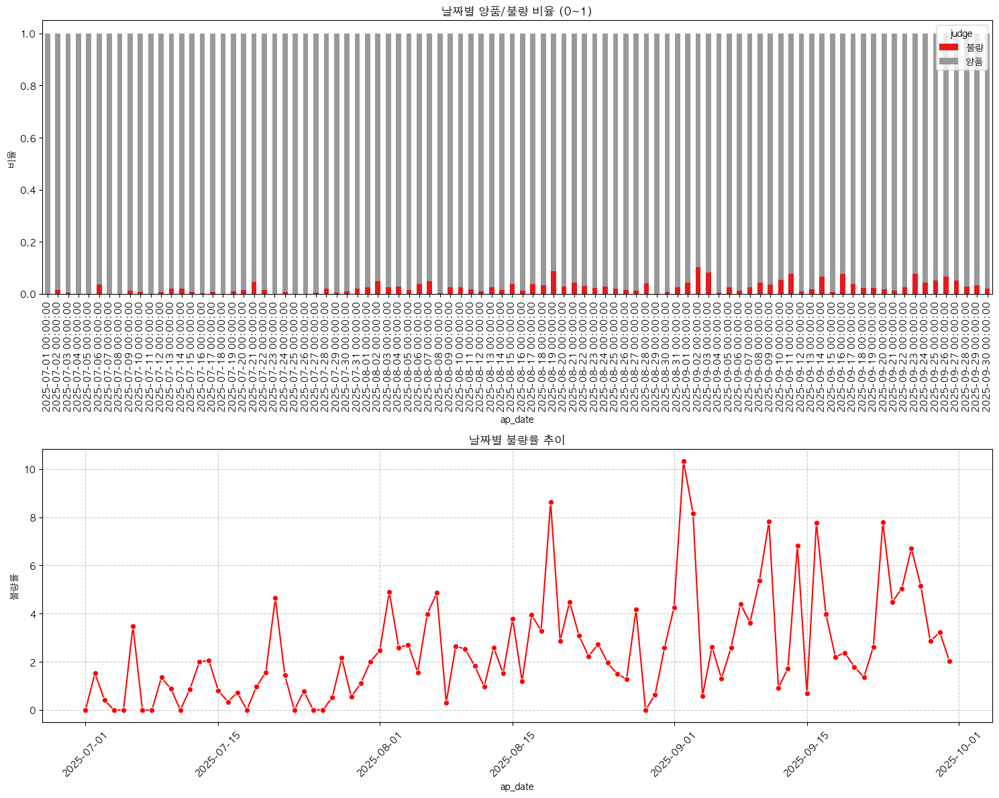

In [57]:
final_df['ap_date'] = pd.to_datetime(final_df['ap_date'])

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))

# --- 그래프 1: 날짜별 비율 (양품 vs 불량) ---
daily_ratio = (
    final_df.groupby('ap_date')['judge']
    .value_counts(normalize=True)
    .unstack()
    .fillna(0)
)

daily_ratio.plot(kind='bar', stacked=True, ax=ax1, colormap='Set1')

ax1.set_title('날짜별 양품/불량 비율 (0~1)')
ax1.set_ylabel('비율')
ax1.tick_params(axis='x', labelsize=10, rotation=90)

# --- 그래프 2: 날짜별 불량률 (0~1) ---
if '불량' in daily_ratio.columns:
    sns.lineplot(
        x=daily_ratio.index,
        y=daily_ratio['불량']*100,
        marker='o',
        color='red',
        ax=ax2
    )

    ax2.set_title('날짜별 불량률 추이')
    ax2.set_ylabel('불량률')
    # ax2.set_ylim(0, 10)  # 🔥 핵심: 0~1 범위 고정
    ax2.grid(True, linestyle='--', alpha=0.7)
    ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

불량률 9월 초가 제일 높음

규칙적인건 없는듯

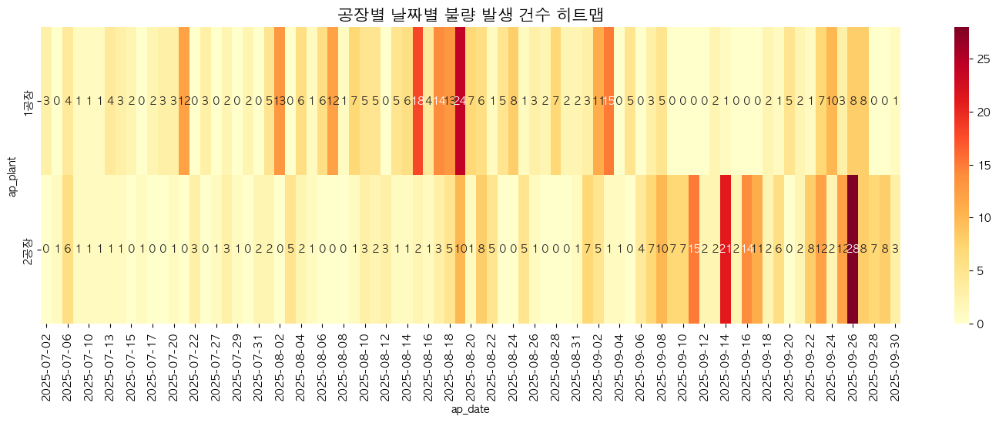

In [58]:
# 공장별 날짜별 불량 건수 피벗
df_defective = df_3[df_3['judge'] == '불량']
pivot_defect = df_defective.pivot_table(index='ap_plant', columns='ap_date', 
                                        values='judge', aggfunc='count').fillna(0)

plt.figure(figsize=(18, 5))
sns.heatmap(pivot_defect, annot=True, fmt='g', cmap='YlOrRd')
plt.title('공장별 날짜별 불량 발생 건수 히트맵', fontsize=15)
plt.show()

1공장은 8월 중순이 불량 많음

2공장은 9월달이 불량 많음

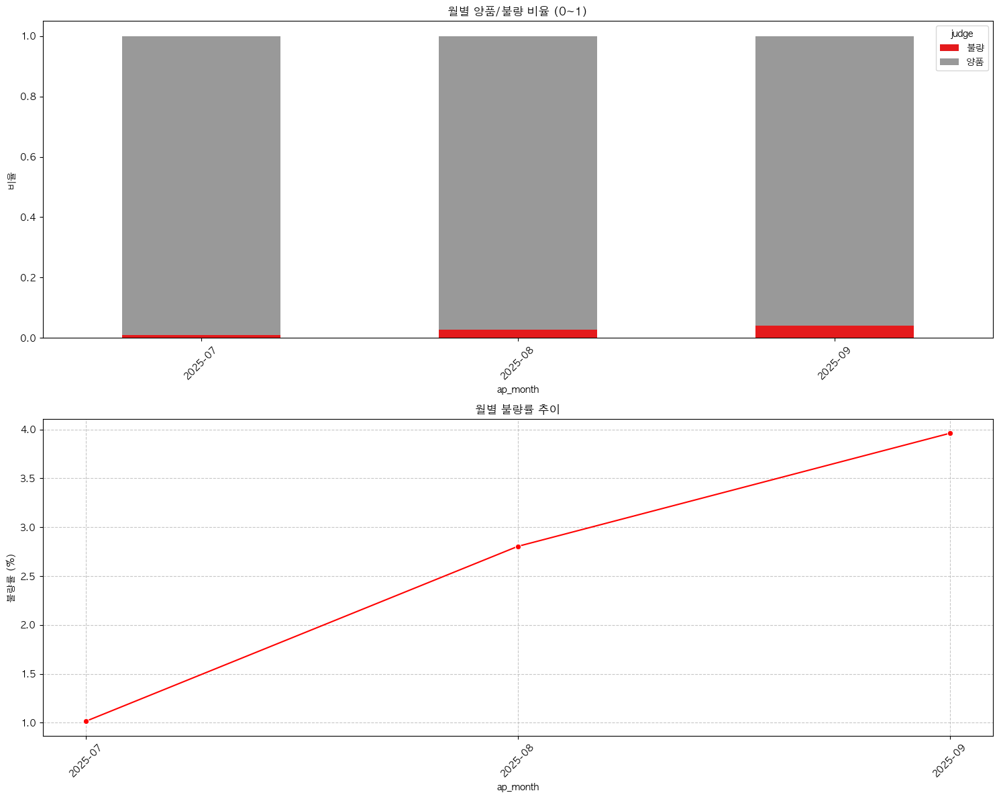

In [59]:
final_df['ap_date'] = pd.to_datetime(final_df['ap_date'])

# 월 컬럼 생성 (YYYY-MM 형태)
final_df['ap_month'] = final_df['ap_date'].dt.to_period('M')

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))

# --- 그래프 1: 월별 비율 ---
monthly_ratio = (
    final_df.groupby('ap_month')['judge']
    .value_counts(normalize=True)
    .unstack()
    .fillna(0)
)

monthly_ratio.plot(kind='bar', stacked=True, ax=ax1, colormap='Set1')

ax1.set_title('월별 양품/불량 비율 (0~1)')
ax1.set_ylabel('비율')
ax1.tick_params(axis='x', rotation=45)

# --- 그래프 2: 월별 불량률 ---
if '불량' in monthly_ratio.columns:
    sns.lineplot(
        x=monthly_ratio.index.astype(str),  # 문자열로 바꿔야 예쁘게 나옴
        y=monthly_ratio['불량'] * 100,
        marker='o',
        color='red',
        ax=ax2
    )

    ax2.set_title('월별 불량률 추이')
    ax2.set_ylabel('불량률 (%)')
    ax2.grid(True, linestyle='--', alpha=0.7)
    ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

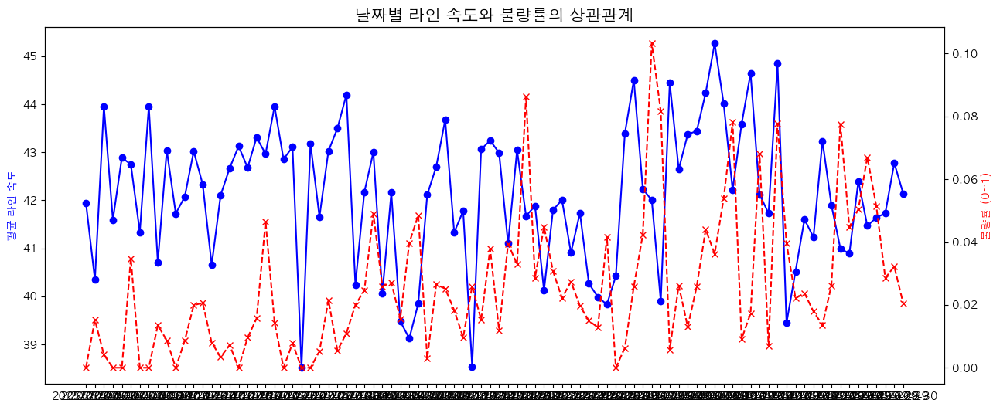

In [60]:
# 날짜별 평균 속도와 불량률 계산
daily_stats = df_3.groupby('ap_date').agg(
    avg_speed=('ap_line_speed', 'mean'),
    defect_rate=('judge', lambda x: (x == '불량').mean())
).reset_index()

fig, ax1 = plt.subplots(figsize=(15, 6))

# 속도 그래프 (왼쪽)
ax1.plot(daily_stats['ap_date'], daily_stats['avg_speed'], color='blue', label='평균 속도', marker='o')
ax1.set_ylabel('평균 라인 속도', color='blue')

# 불량률 그래프 (오른쪽)
ax2 = ax1.twinx()
ax2.plot(daily_stats['ap_date'], daily_stats['defect_rate'], color='red', label='불량률', linestyle='--', marker='x')
ax2.set_ylabel('불량률 (0~1)', color='red')

plt.title('날짜별 라인 속도와 불량률의 상관관계', fontsize=15)
plt.xticks(rotation=45)
plt.show()
# 히스토그램으로

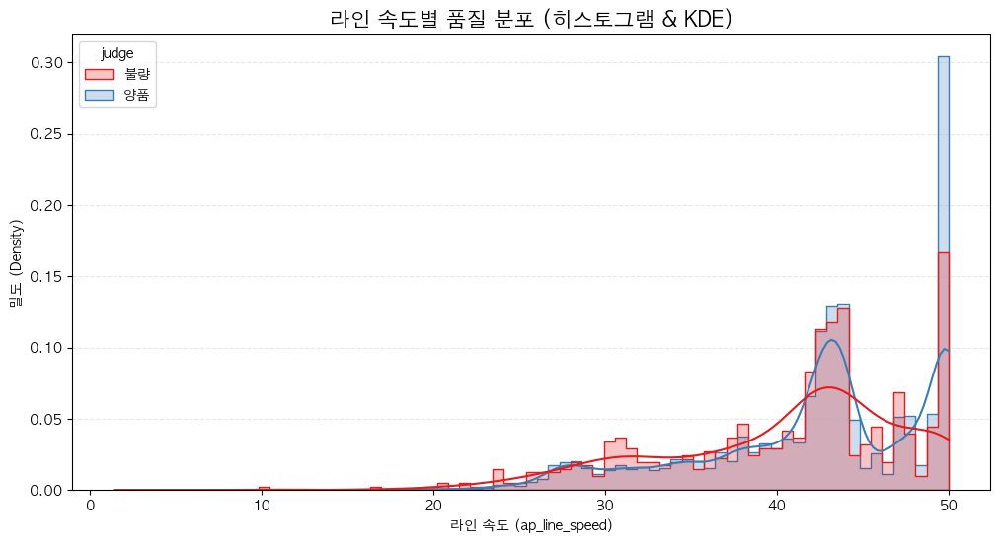

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns


plt.figure(figsize=(12, 6))

# 2. 히스토그램 그리기
# stat='density'를 사용하면 개수가 아닌 비율(면적의 합=1)로 비교할 수 있어 
# 데이터 불균형(양품이 훨씬 많음) 상황에서도 분포 차이를 보기 좋습니다.
sns.histplot(data=df_3, x='ap_line_speed', hue='judge', 
             element='step', kde=True, palette='Set1', stat='density', common_norm=False)

plt.title('라인 속도별 품질 분포 (히스토그램 & KDE)', fontsize=15)
plt.xlabel('라인 속도 (ap_line_speed)')
plt.ylabel('밀도 (Density)')
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.show()

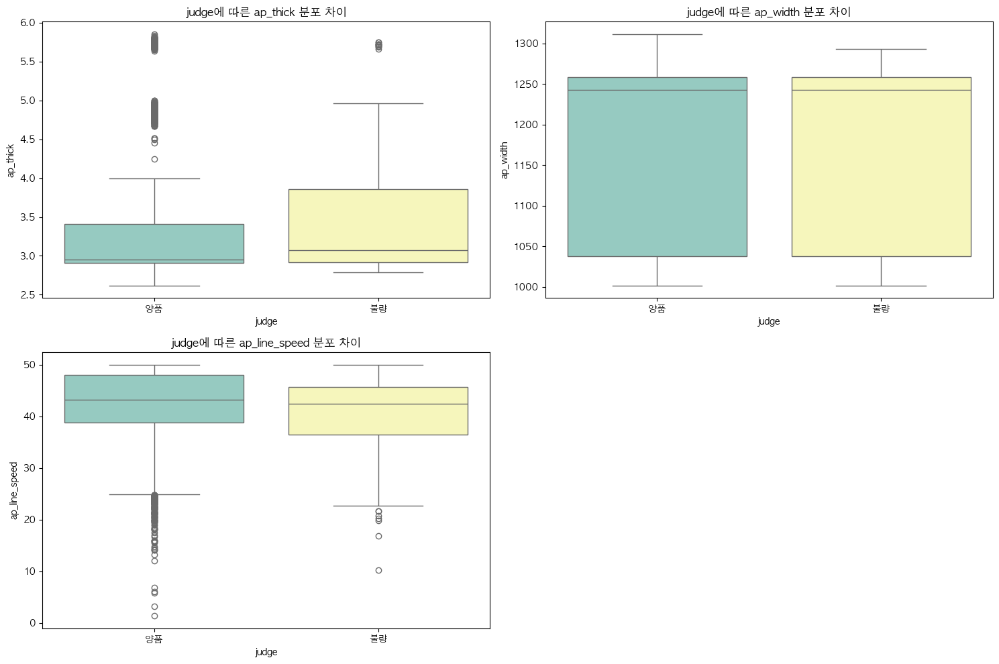

In [62]:
# 4. 수치형 변수와 judge의 관계 (Boxplot)
# 분석할 주요 변수 리스트 (공정별 핵심 변수)
features = ['ap_thick', 'ap_width', 'ap_line_speed']

plt.figure(figsize=(15, 10))
for i, col in enumerate(features):
    plt.subplot(2, 2, i+1)
    sns.boxplot(x='judge', y=col, data=final_df, palette='Set3')
    plt.title(f'judge에 따른 {col} 분포 차이')
plt.tight_layout()
plt.show()

1. ap_thick는 중앙값 비슷하지만 불량이 분포가 더 크다
2. 거의 비슷 -> 중요 변수 아닐 듯
3. 양품이 중앙값 살짝 높음, 속도가 낮아지면 불량 가능성 높음?

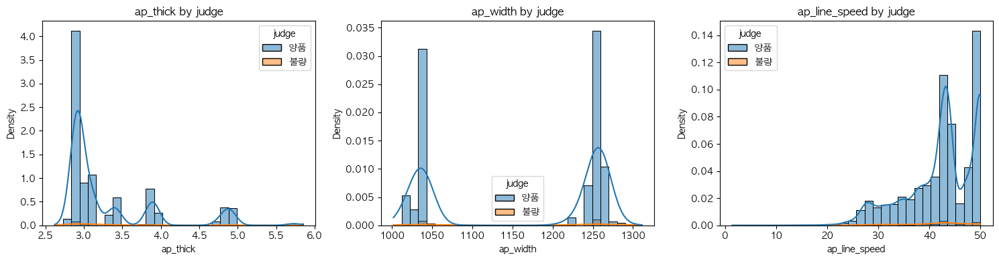

In [63]:
import matplotlib.pyplot as plt
import seaborn as sns

cols = ['ap_thick', 'ap_width', 'ap_line_speed']

plt.figure(figsize=(15, 4))

for i, col in enumerate(cols, 1):
    plt.subplot(1, 3, i)
    
    sns.histplot(data=final_df, x=col, hue='judge', kde=True, bins=30,  stat='density')
    
    plt.title(f'{col} by judge')

plt.tight_layout()
plt.show()

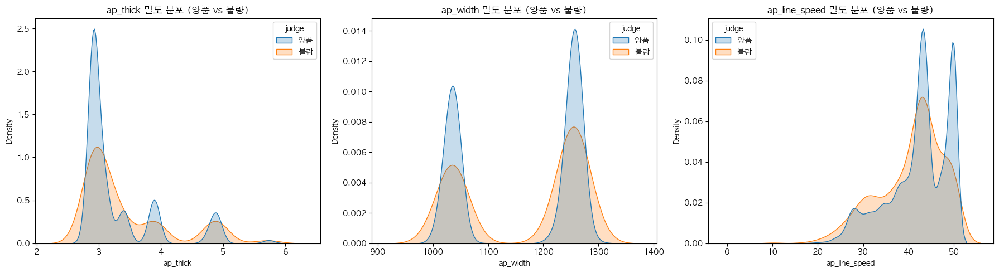

In [64]:
import matplotlib.pyplot as plt
# import sns as sns

# 분석할 변수 리스트
ap_vars = ['ap_thick', 'ap_width', 'ap_line_speed']

# 1. KDE Plot (분포 차이 확인)
# 양품과 불량의 데이터 개수 차이가 커도 분포 모양을 비교할 수 있게 common_norm=False 설정
plt.figure(figsize=(18, 5))
for i, var in enumerate(ap_vars):
    plt.subplot(1, 3, i+1)
    sns.kdeplot(data=final_df, x=var, hue='judge', fill=True, common_norm=False)
    plt.title(f'{var} 밀도 분포 (양품 vs 불량)')

plt.tight_layout()
plt.show()

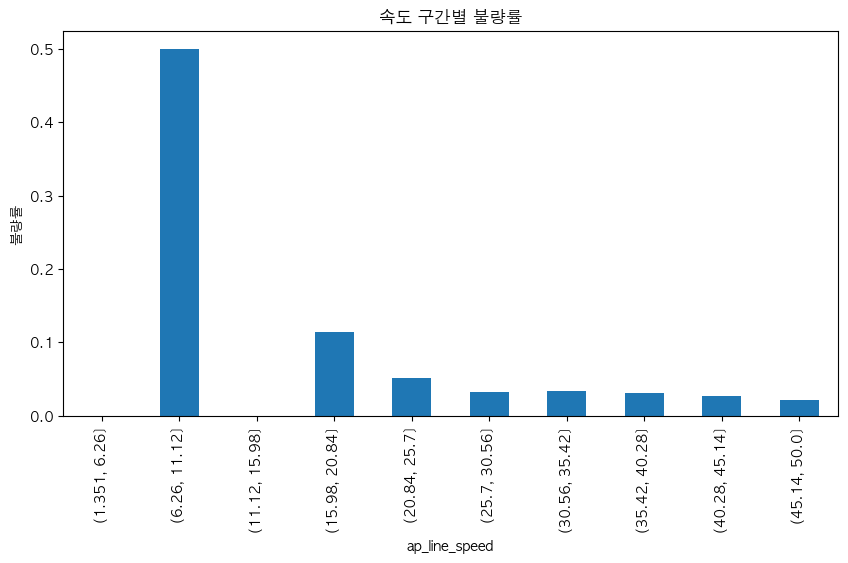

In [65]:
speed_defect = (
    final_df.groupby(pd.cut(final_df['ap_line_speed'], bins=10))['judge']
    .value_counts(normalize=True)
    .unstack()
)

speed_defect['불량'].plot(kind='bar', figsize=(10,5))
plt.ylabel('불량률')
plt.title('속도 구간별 불량률')
plt.show()

불량개수/해당 범위 스피드에서 발생된 생산수

6.26~11.12 해당 구간 중 불량률 50%

→ 저 스피드 이상이어야 된다?
→ 한개여서 불량률 1인듯

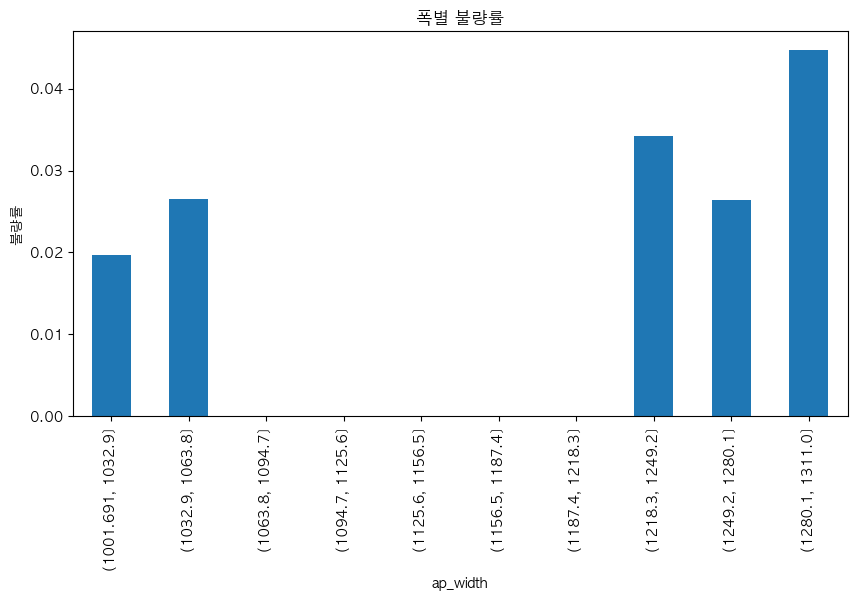

In [66]:
width_defect = (
    final_df.groupby(pd.cut(final_df['ap_width'], bins=10))['judge']
    .value_counts(normalize=True)
    .unstack()
)

width_defect['불량'].plot(kind='bar', figsize=(10,5))
plt.ylabel('불량률')
plt.title('폭별 불량률')
plt.show()

불량개수/해당 범위 폭에서 발생된 생산수

1063.8~1218.3 불량 x -> 생산도 없었음


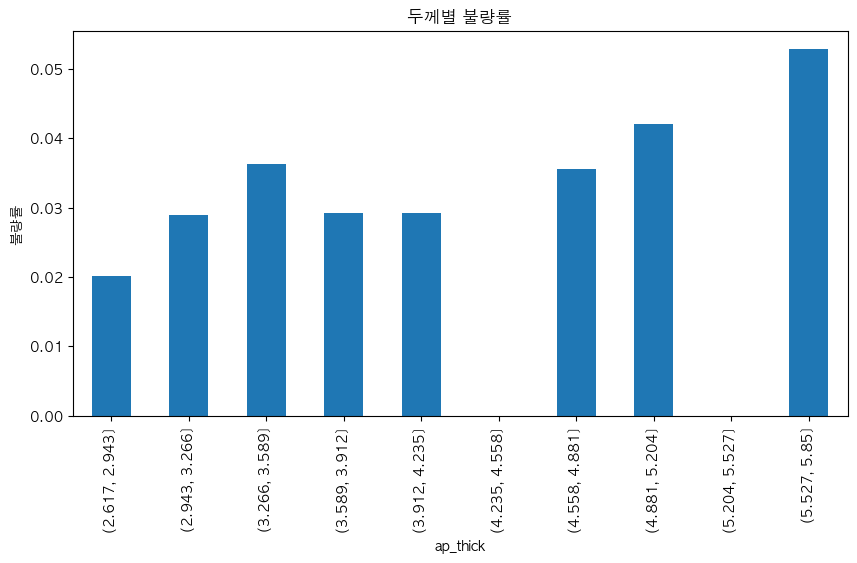

In [67]:
thick_defect = (
    final_df.groupby(pd.cut(final_df['ap_thick'], bins=10))['judge']
    .value_counts(normalize=True)
    .unstack()
)

thick_defect['불량'].plot(kind='bar', figsize=(10,5))
plt.ylabel('불량률')
plt.title('두께별 불량률')
plt.show()

불량개수/해당 범위 두께에서 발생된 생산수

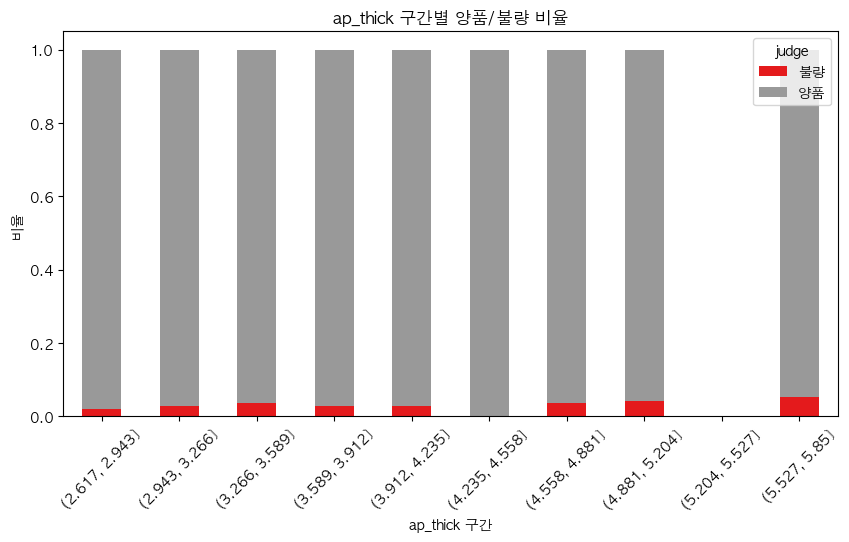

In [68]:
import pandas as pd
import matplotlib.pyplot as plt

# 구간 나누기
bins = pd.cut(final_df['ap_thick'], bins=10)

# 비율 계산
thick_ratio = (
    final_df.groupby(bins)['judge']
    .value_counts(normalize=True)
    .unstack()
    .fillna(0)
)

# 그래프
thick_ratio.plot(kind='bar', stacked=True, figsize=(10,5), colormap='Set1')

plt.title('ap_thick 구간별 양품/불량 비율')
plt.ylabel('비율')
plt.xlabel('ap_thick 구간')
plt.xticks(rotation=45)
plt.show()

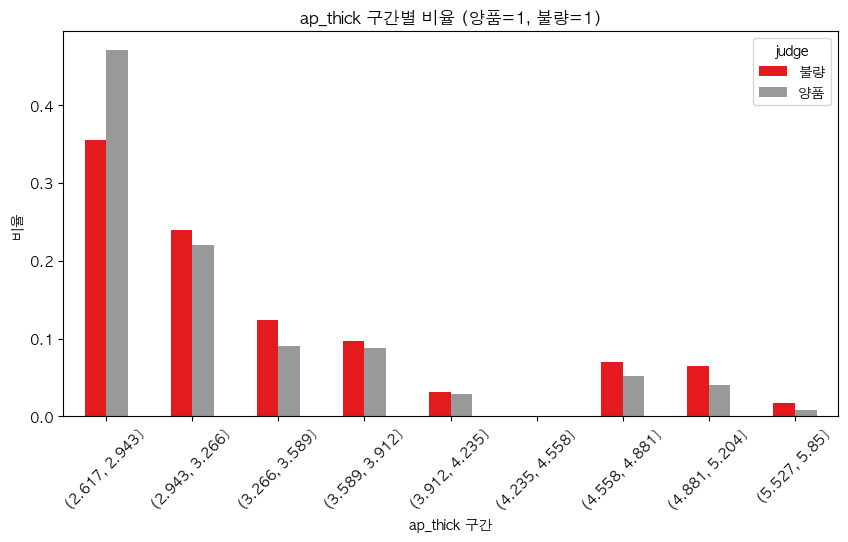

In [69]:
import pandas as pd
import matplotlib.pyplot as plt

# 구간 나누기
bins = pd.cut(final_df['ap_thick'], bins=10)

# 개수 기준 피벗
ct = pd.crosstab(bins, final_df['judge'])

# 🔥 열 기준 정규화 (핵심)
ct_norm = ct.div(ct.sum(axis=0), axis=1)

# 그래프
ct_norm.plot(kind='bar', figsize=(10,5), colormap='Set1')

plt.title('ap_thick 구간별 비율 (양품=1, 불량=1)')
plt.ylabel('비율')
plt.xlabel('ap_thick 구간')
plt.xticks(rotation=45)
plt.show()

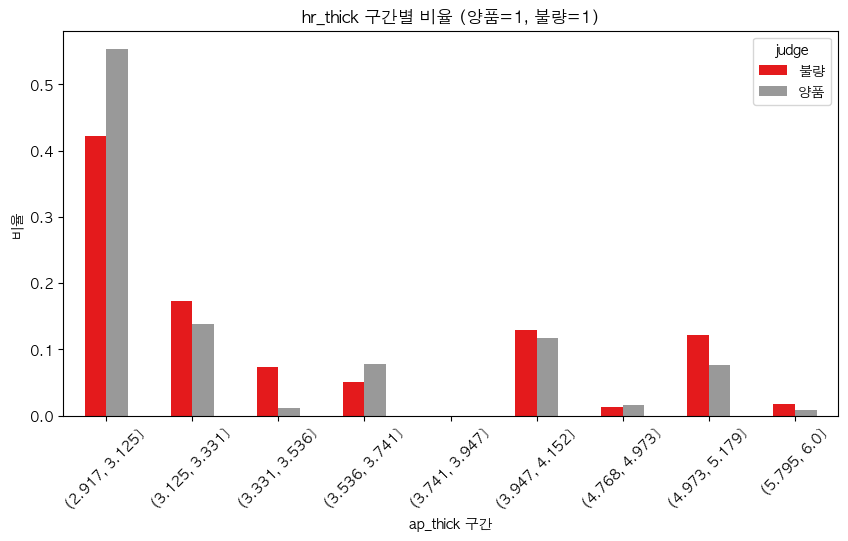

In [70]:
import pandas as pd
import matplotlib.pyplot as plt

# 구간 나누기
bins = pd.cut(final_df['hr_thick'], bins=15)

# 개수 기준 피벗
ct = pd.crosstab(bins, final_df['judge'])

# 🔥 열 기준 정규화 (핵심)
ct_norm = ct.div(ct.sum(axis=0), axis=1)

# 그래프
ct_norm.plot(kind='bar', figsize=(10,5), colormap='Set1')

plt.title('hr_thick 구간별 비율 (양품=1, 불량=1)')
plt.ylabel('비율')
plt.xlabel('ap_thick 구간')
plt.xticks(rotation=45)
plt.show()

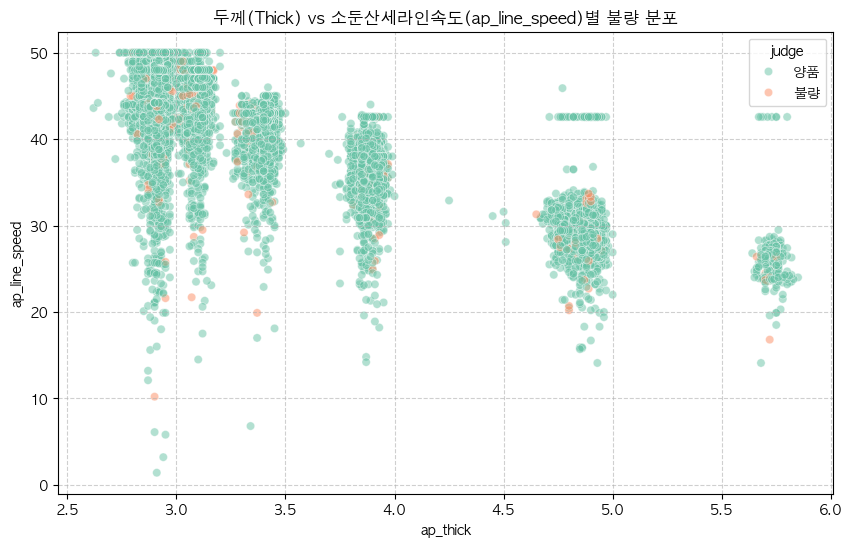

In [71]:
# 2. 2D 산점도 (두께와 폭의 조합에 따른 불량 지점)
# 특정 규격(예: 얇고 넓은 판)에서 불량이 몰리는지 확인
plt.figure(figsize=(10, 6))
sns.scatterplot(data=final_df, x='ap_thick', y='ap_line_speed', hue='judge', alpha=0.5, palette='Set2')
plt.title('두께(Thick) vs 소둔산세라인속도(ap_line_speed)별 불량 분포')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

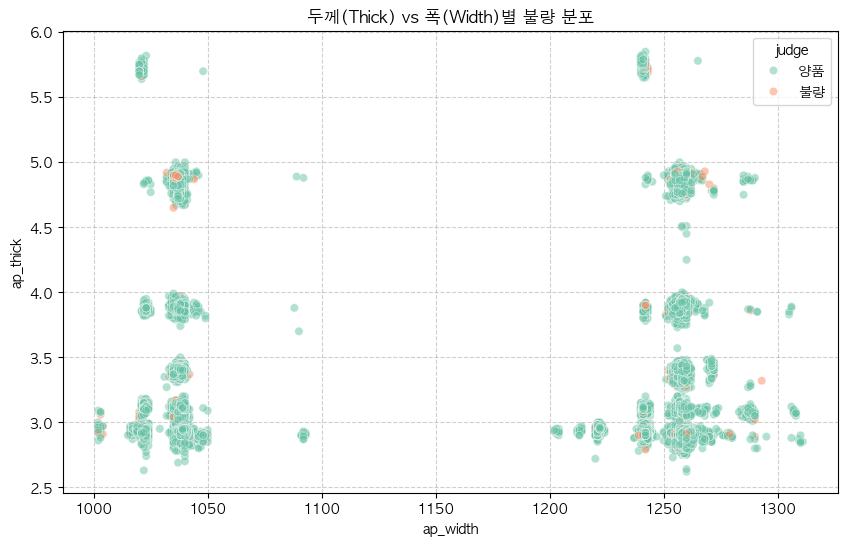

In [72]:
# 2. 2D 산점도 (두께와 폭의 조합에 따른 불량 지점)
# 특정 규격(예: 얇고 넓은 판)에서 불량이 몰리는지 확인
plt.figure(figsize=(10, 6))
sns.scatterplot(data=final_df, x='ap_width', y='ap_thick', hue='judge', alpha=0.5, palette='Set2')
plt.title('두께(Thick) vs 폭(Width)별 불량 분포')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

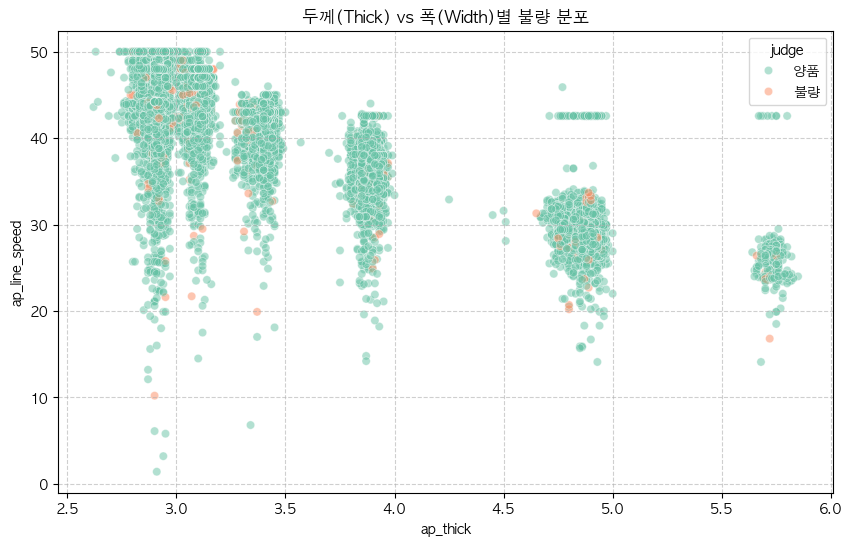

In [73]:
# 2. 2D 산점도 (두께와 폭의 조합에 따른 불량 지점)
# 특정 규격(예: 얇고 넓은 판)에서 불량이 몰리는지 확인
plt.figure(figsize=(10, 6))
sns.scatterplot(data=final_df, x='ap_thick', y='ap_line_speed', hue='judge', alpha=0.5, palette='Set2')
plt.title('두께(Thick) vs 폭(Width)별 불량 분포')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

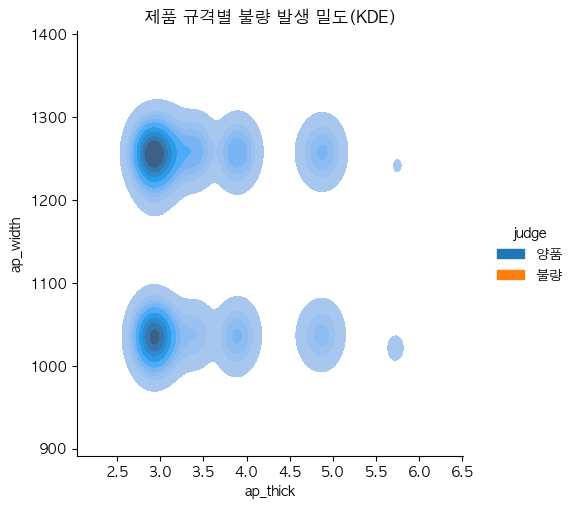

In [74]:
sns.displot(data=final_df, x='ap_thick', y='ap_width', hue='judge', kind='kde', fill=True)
plt.title('제품 규격별 불량 발생 밀도(KDE)')
plt.show()

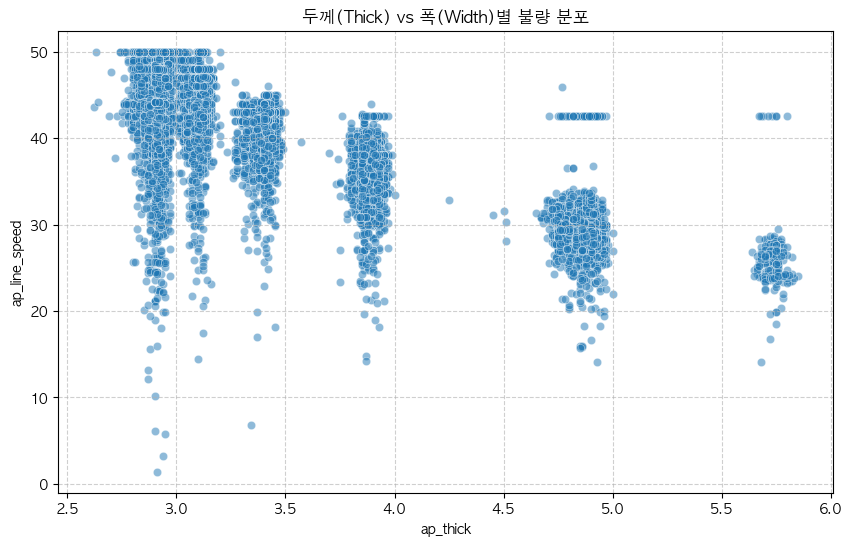

In [75]:
# 2. 2D 산점도 (두께와 폭의 조합에 따른 불량 지점)
# 특정 규격(예: 얇고 넓은 판)에서 불량이 몰리는지 확인
plt.figure(figsize=(10, 6))
sns.scatterplot(data=final_df, x='ap_thick', y='ap_line_speed', alpha=0.5, palette='Set2')
plt.title('두께(Thick) vs 폭(Width)별 불량 분포')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

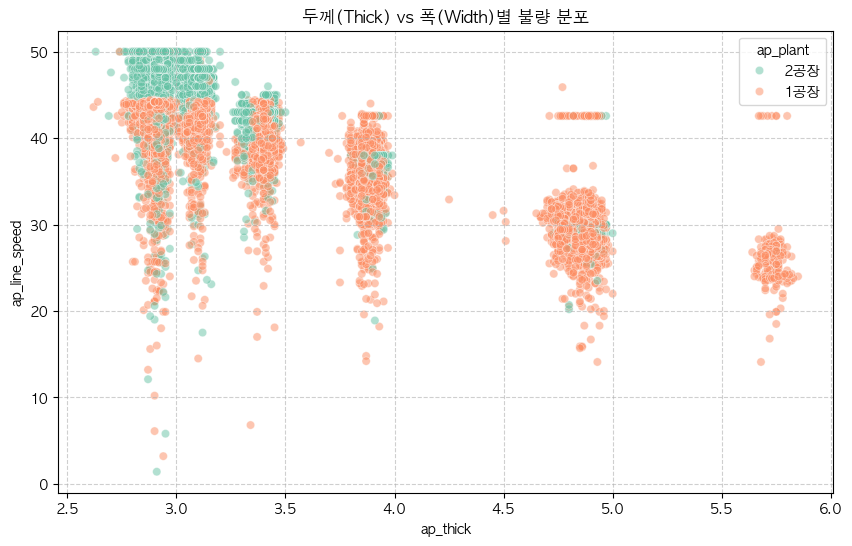

In [76]:
# 2. 2D 산점도 (두께와 폭의 조합에 따른 불량 지점)
# 특정 규격(예: 얇고 넓은 판)에서 불량이 몰리는지 확인
plt.figure(figsize=(10, 6))
sns.scatterplot(data=final_df, x='ap_thick', y='ap_line_speed', hue='ap_plant', alpha=0.5, palette='Set2')
plt.title('두께(Thick) vs 폭(Width)별 불량 분포')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

ap_line_speed중 1공장은 거의 43?이 최대
-> 1공장이 불량이 더 많은데 연관지을 수 있나......?

In [77]:
final_df['hr_date']=pd.to_datetime(final_df['hr_date'])
final_df['f_ext_date']=pd.to_datetime(final_df['f_ext_date'])

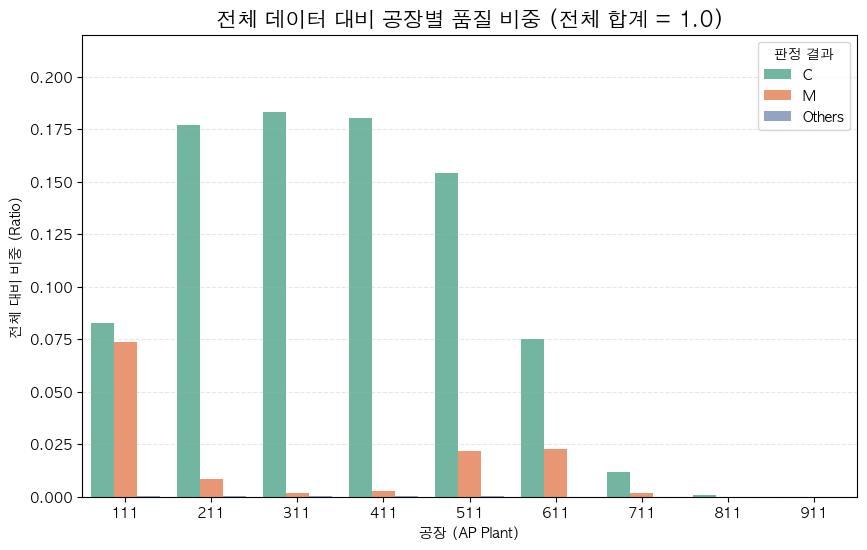

전체 비율 합계: 1.0


In [78]:
df_total_ratio = (
    final_df[['slab_no', 'slab_gubun']]
    .value_counts(normalize=True) # 전체 행 수 대비 각 조합의 비율 계산
    .rename('ratio')
    .reset_index()
)

# 3. 그래프 그리기
plt.figure(figsize=(10, 6))
# x축을 공장으로, hue를 판정으로 설정하여 전체에서의 비중 시각화
ax = sns.barplot(x='slab_no', y='ratio', hue='slab_gubun', data=df_total_ratio, palette='Set2')

plt.title('전체 데이터 대비 공장별 품질 비중 (전체 합계 = 1.0)', fontsize=15)
plt.ylabel('전체 대비 비중 (Ratio)')
plt.xlabel('공장 (AP Plant)')
plt.ylim(0, df_total_ratio['ratio'].max() * 1.2) # 라벨 표시 여유 공간
plt.legend(title='판정 결과')
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.show()

# 검증: 모든 ratio의 합이 1인지 확인
print(f"전체 비율 합계: {df_total_ratio['ratio'].sum():.1f}")

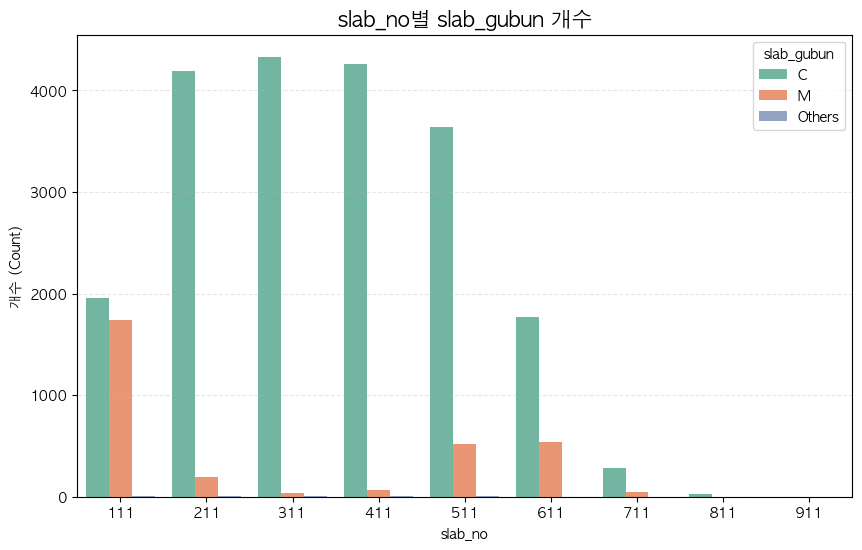

In [79]:
# 1. slab_no + slab_gubun 조합별 개수
df_total_count = (
    final_df[['slab_no', 'slab_gubun']]
    .value_counts()   # 🔥 normalize 제거
    .rename('count')
    .reset_index()
)

plt.figure(figsize=(10, 6))

ax = sns.barplot(
    x='slab_no',
    y='count',
    hue='slab_gubun',
    data=df_total_count,
    palette='Set2'
)

plt.title('slab_no별 slab_gubun 개수', fontsize=15)
plt.ylabel('개수 (Count)')
plt.xlabel('slab_no')
plt.legend(title='slab_gubun')
plt.grid(axis='y', linestyle='--', alpha=0.3)

plt.show()

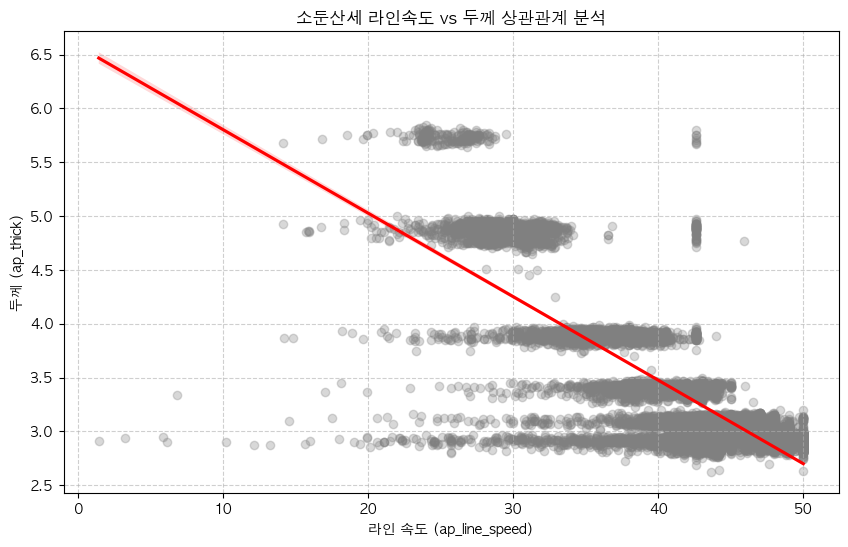

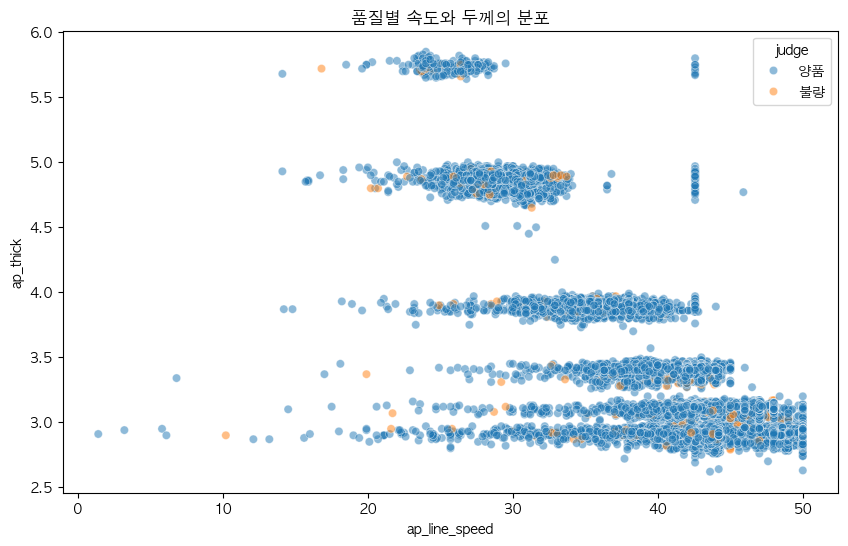

In [80]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# 2. 데이터 불러오기 (df는 이미 로드된 데이터프레임이라고 가정)
# 예시: sns.regplot을 이용한 상관관계 시각화
plt.figure(figsize=(10, 6))

# 산점도와 회귀선을 동시에 그림 (두 변수 간 경향성 확인)
sns.regplot(data=final_df, x='ap_line_speed', y='ap_thick', 
            scatter_kws={'alpha':0.3, 'color':'gray'}, 
            line_kws={'color':'red'})

plt.title('소둔산세 라인속도 vs 두께 상관관계 분석')
plt.xlabel('라인 속도 (ap_line_speed)')
plt.ylabel('두께 (ap_thick)')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# 3. 추가: 품질(judge)별로 색상을 나눠서 보고 싶을 때
plt.figure(figsize=(10, 6))
sns.scatterplot(data=final_df, x='ap_line_speed', y='ap_thick', hue='judge', alpha=0.5)
plt.title('품질별 속도와 두께의 분포')
plt.show()

In [81]:
final_df['ap_thick']

0        2.93
1        2.89
2        3.41
3        4.97
4        4.88
         ... 
23627    3.93
23628    2.87
23629    3.92
23630    3.93
23631    3.92
Name: ap_thick, Length: 23632, dtype: float64

In [82]:
import pandas as pd
import numpy as np

# 1. 데이터 로드

# 2. 머신러닝이 찾아낸 최적의 경계값 (Thresholds)
# 2.95와 3.06 부근에서 불량 패턴이 크게 바뀝니다.
custom_bins = [0, 2.95, 3.06, 4.82, 10]
custom_labels = ['Stable_Thin', 'High_Risk_Mid', 'Normal_Mid', 'Thick_End']

# 3. 구간화 적용
final_df['thick_segment'] = pd.cut(final_df['ap_thick'], bins=custom_bins, labels=custom_labels)

# 4. 결과 확인 (구간별 실제 불량수와 비율)
final_df['is_bad'] = (final_df['judge'] == '불량').astype(int)
summary = final_df.groupby('thick_segment')['is_bad'].agg(['count', 'mean']).reset_index()
summary.columns = ['Segment', 'Total_Count', 'Defect_Rate']

print(summary)

         Segment  Total_Count  Defect_Rate
0    Stable_Thin        12196     0.019761
1  High_Risk_Mid         1354     0.051699
2     Normal_Mid         8094     0.028540
3      Thick_End         1988     0.043763


In [83]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier

final_df['is_bad'] = (final_df['judge'] == '불량').astype(int)

# 1. 제약 조건 강화 (딱 4개 구간을 목표로)
# max_depth=2는 2의 2제곱, 즉 최대 4개의 잎(Leaf)을 만듭니다.
X = final_df[['hr_thick']]
y = final_df['is_bad']
tree = DecisionTreeClassifier(max_depth=2, min_samples_leaf=0.1) 
tree.fit(X, y)

# 2. 경계값 추출
thresholds = sorted(tree.tree_.threshold[tree.tree_.threshold != -2])
bins = [final_df['hr_thick'].min()] + thresholds + [final_df['hr_thick'].max()]
bins = sorted(list(set(bins)))

# 3. 구간화 및 라벨링 (수정된 부분)
# bins의 개수에 맞춰서 자동으로 라벨 개수를 조절합니다.
num_bins = len(bins) - 1
labels = [f'Group_{i+1}' for i in range(num_bins)]

# 만약 꼭 이름을 정해주고 싶다면 아래처럼 슬라이싱을 씁니다.
# fixed_labels = ['Stable_Thin', 'Best_Optimized', 'Caution_Mid', 'General_Thick']
# labels = fixed_labels[:num_bins]

final_df['thick_4_segment'] = pd.cut(final_df['hr_thick'], bins=bins, labels=labels, include_lowest=True)

# 결과 확인
print("확정된 경계값 개수:", len(thresholds))
print(thresholds)
print("생성된 구간 개수:", num_bins)
print(final_df['thick_4_segment'].value_counts().sort_index())

확정된 경계값 개수: 2
[3.1050000190734863, 3.5049999952316284]
생성된 구간 개수: 3
thick_4_segment
Group_1    12992
Group_2     3603
Group_3     7037
Name: count, dtype: int64


In [84]:
final_df['hr_thick'].min(),final_df['hr_thick'].max()

(2.92, 6.0)

# EDA 다시 - 제강/연주

### sm_plant

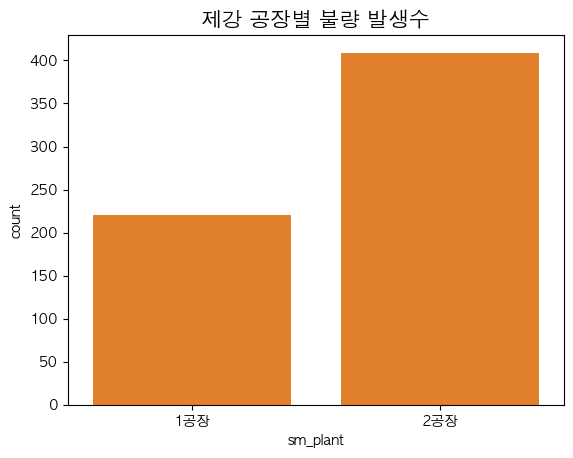

In [85]:
sns.countplot(
    x='sm_plant',
    data=final_df[final_df['judge'] == '불량'],
    color='#ff7f0e'
)
plt.title('제강 공장별 불량 발생수', fontsize=15)
plt.xticks(rotation=0) # 글자가 겹치면 회전
plt.show()

### steel_usage

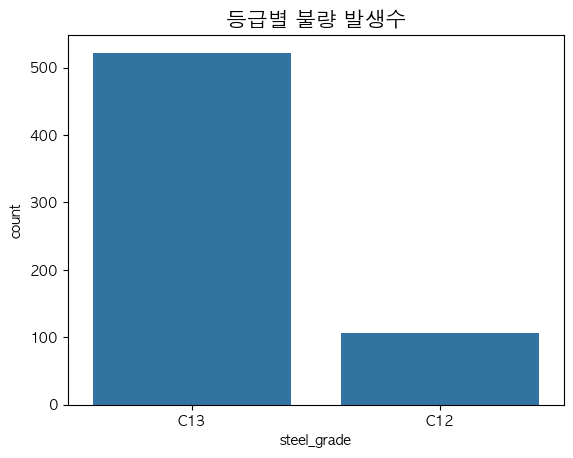

In [86]:
sns.countplot(
    x='steel_grade',
    data=final_df[final_df['judge'] == '불량']
)
plt.title('등급별 불량 발생수', fontsize=15)
plt.xticks(rotation=0) # 글자가 겹치면 회전
plt.show()

### ap_date

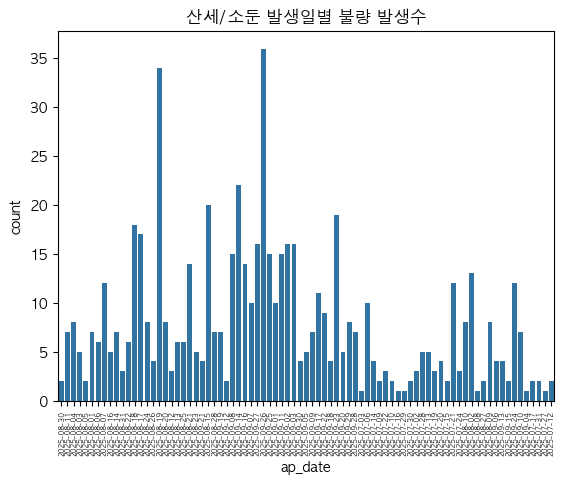

In [87]:
sns.countplot(
    x='ap_date',
    data=final_df[final_df['judge'] == '불량']
)
plt.title('산세/소둔 발생일별 불량 발생수')
plt.xticks(rotation=90, fontsize=5) # 글자가 겹치면 회전
plt.show()

### slab_grind

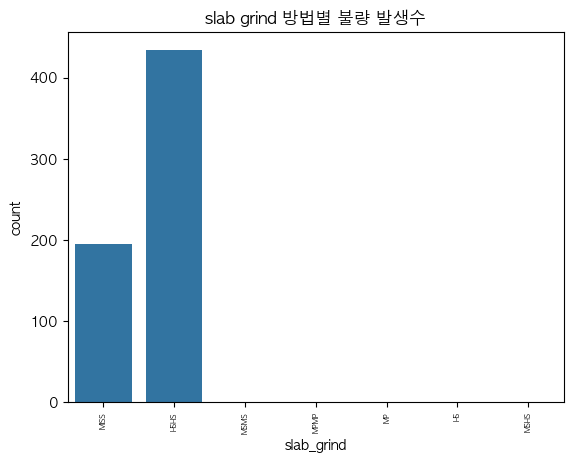

In [88]:
order = final_df['slab_grind'].dropna().unique()

sns.countplot(
    x='slab_grind',
    data=final_df[final_df['judge'] == '불량'],
    order=order
)

plt.title('slab grind 방법별 불량 발생수')
plt.xticks(rotation=90, fontsize=5)
plt.show()

### steel_usage

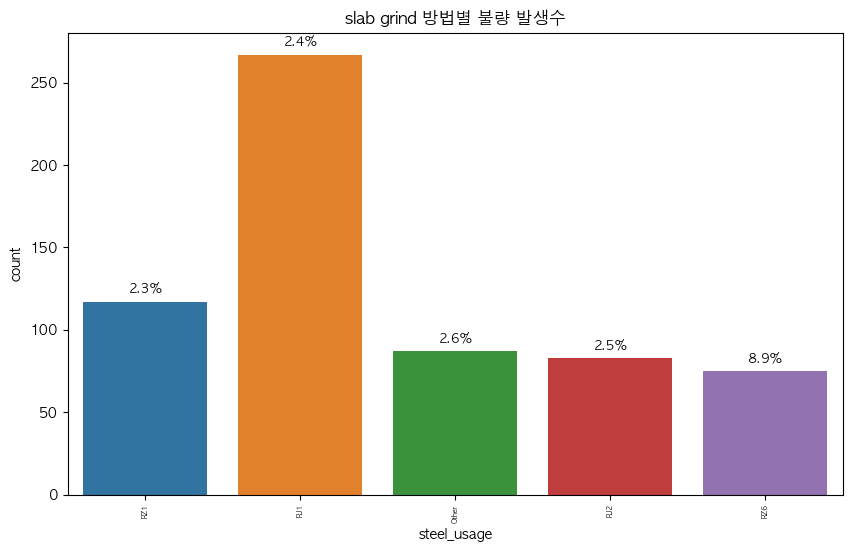

In [89]:
order = final_df['steel_usage'].dropna().unique()

plt.figure(figsize=(10, 6))

ax = sns.countplot(
    x='steel_usage',
    data=final_df[final_df['judge'] == '불량'],
    order=order,
    palette='tab10'
)

# 1️⃣ 전체 개수
total_counts = final_df['steel_usage'].value_counts()

# 2️⃣ 불량 개수
defect_counts = final_df[final_df['judge'] == '불량']['steel_usage'].value_counts()

# 3️⃣ 불량률 계산 (네 방식🔥)
defect_rate = (
    (defect_counts / total_counts)
    .reindex(order)
    .fillna(0)
    .reset_index()
)
defect_rate.columns = ['steel_usage', 'defect_rate']

# 4️⃣ 퍼센트 표시
for i, p in enumerate(ax.patches):
    height = p.get_height()
    rate = defect_rate['defect_rate'].iloc[i] * 100

    ax.annotate(
        f'{rate:.1f}%',
        (p.get_x() + p.get_width()/2., height),
        ha='center',
        va='bottom',
        fontsize=9,
        xytext=(0, 5),
        textcoords='offset points'
    )

plt.title('slab grind 방법별 불량 발생수')
plt.xticks(rotation=90, fontsize=5)
plt.show()

# EDA 다다시 - 제강/연주

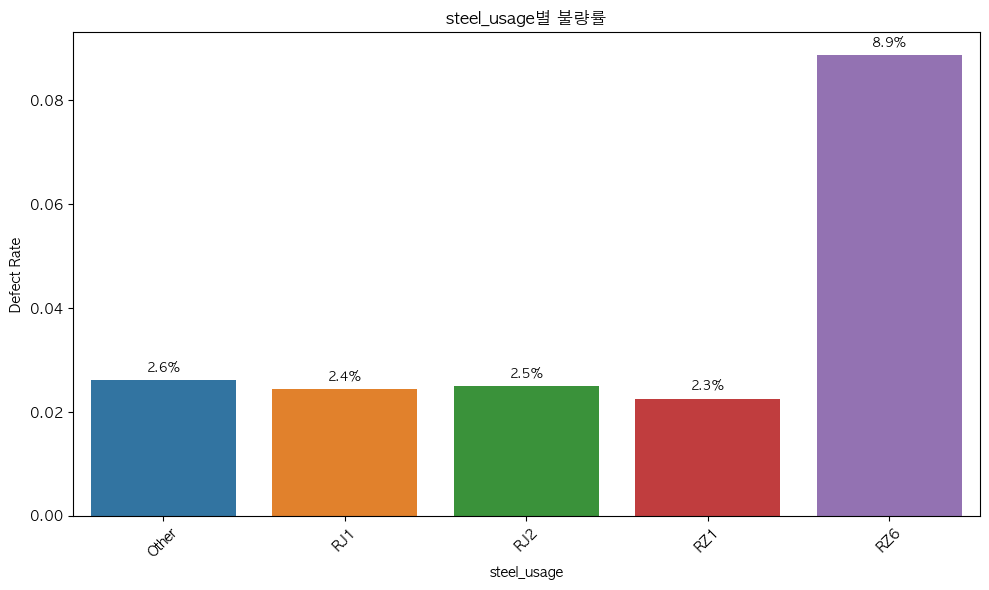

In [90]:
# 진짜
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

target_cols = [
    'steel_usage'
]

for col in target_cols:

    order = sorted(final_df[col].dropna().unique())

    # 1️⃣ 전체 개수
    total_counts = final_df[col].value_counts()

    # 2️⃣ 불량 개수
    defect_counts = final_df[final_df['judge'] == '불량'][col].value_counts()

    # 3️⃣ 불량률 계산
    defect_rate = (
        (defect_counts / total_counts)
        .reindex(order)
        .fillna(0)
        .reset_index()
    )
    defect_rate.columns = [col, 'defect_rate']

    plt.figure(figsize=(10, 6))

    # 4️⃣ barplot
    ax = sns.barplot(
        x=col,
        y='defect_rate',
        data=defect_rate,
    palette='tab10'
    )

    # 5️⃣ 값 표시 (%)
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(
                f'{height*100:.1f}%',
                (p.get_x() + p.get_width()/2., height),
                ha='center',
                va='bottom',
                fontsize=9,
                xytext=(0, 5),
                textcoords='offset points'
            )

    plt.title(f'{col}별 불량률', fontsize=12)
    plt.xticks(rotation=45, fontsize=10)
    plt.ylabel('Defect Rate')

    plt.tight_layout()
    plt.show()

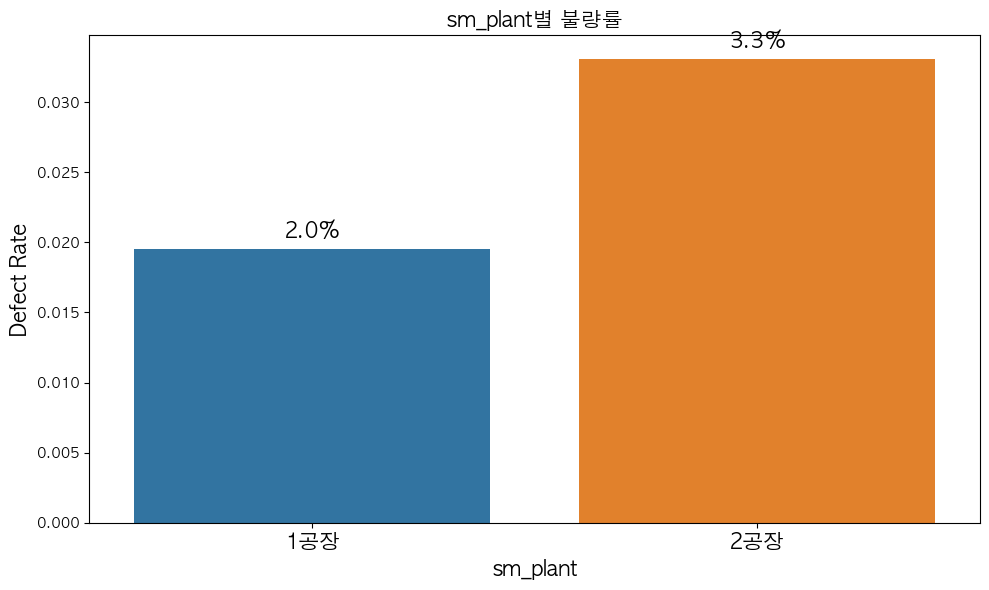

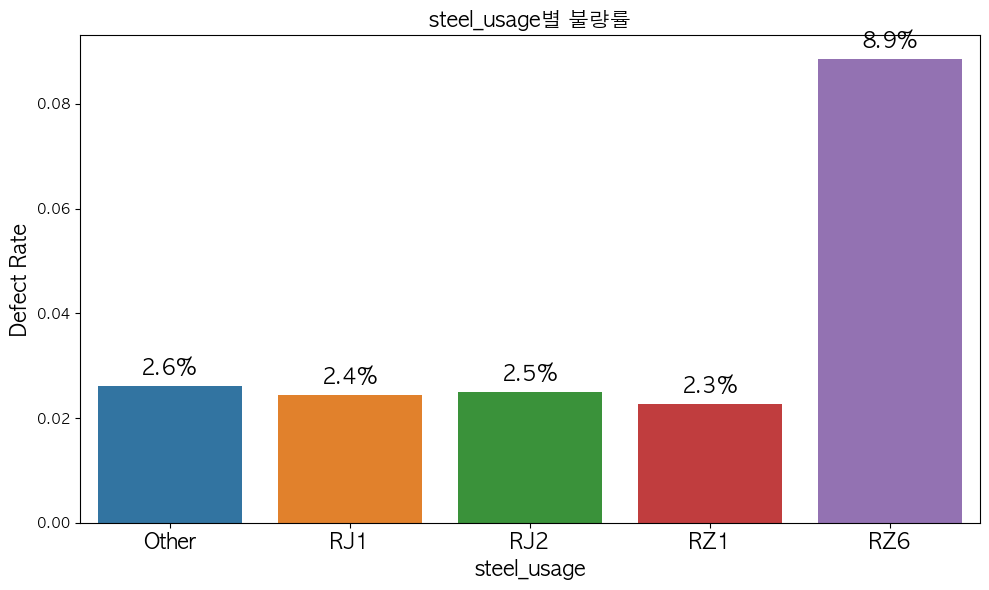

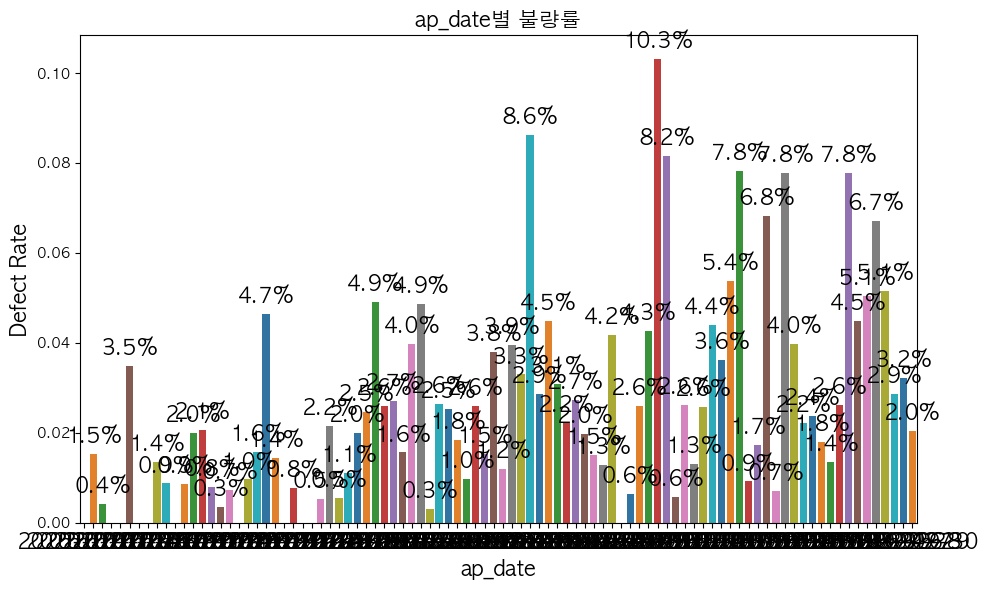

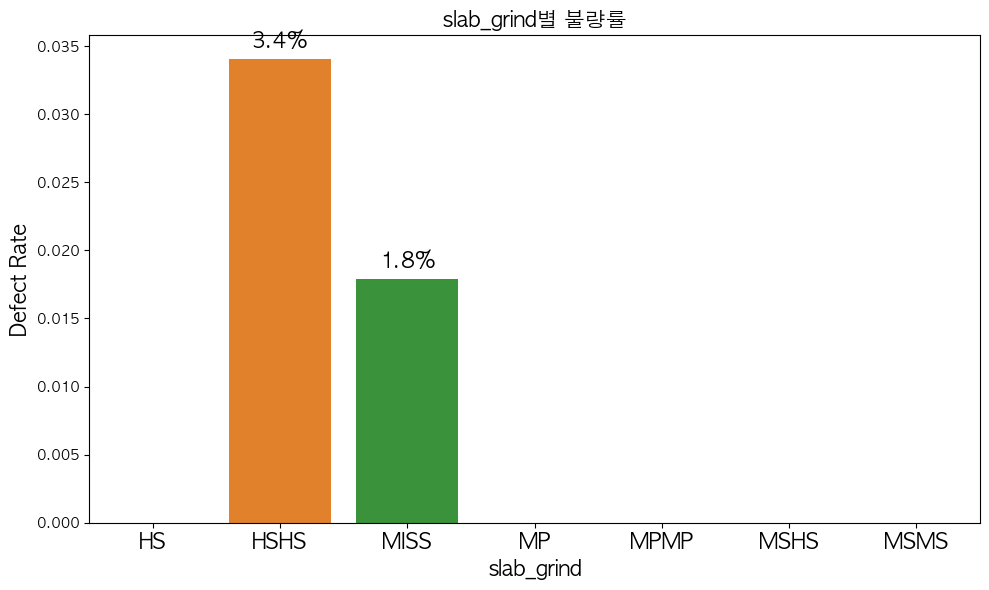

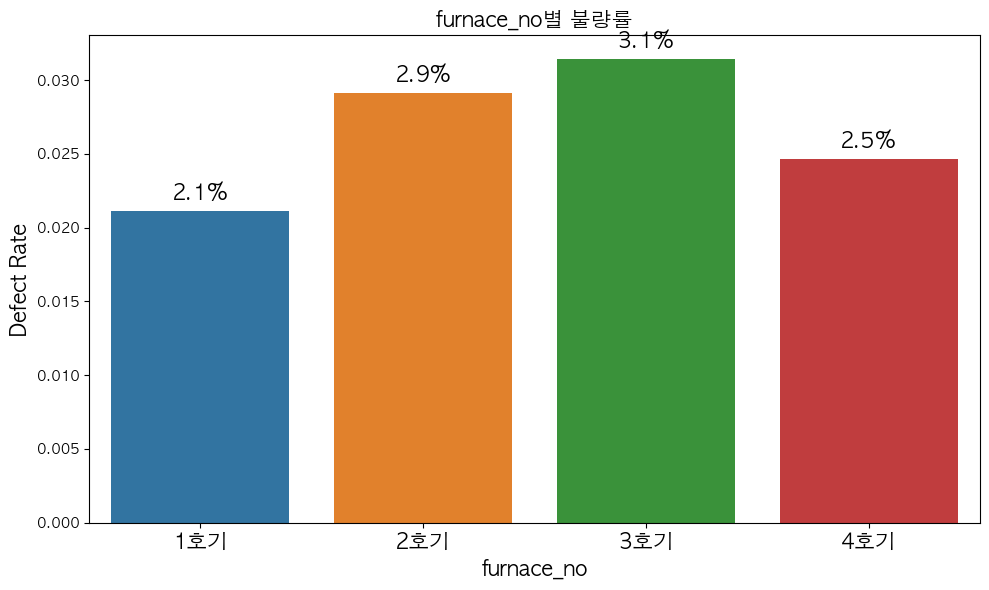

...

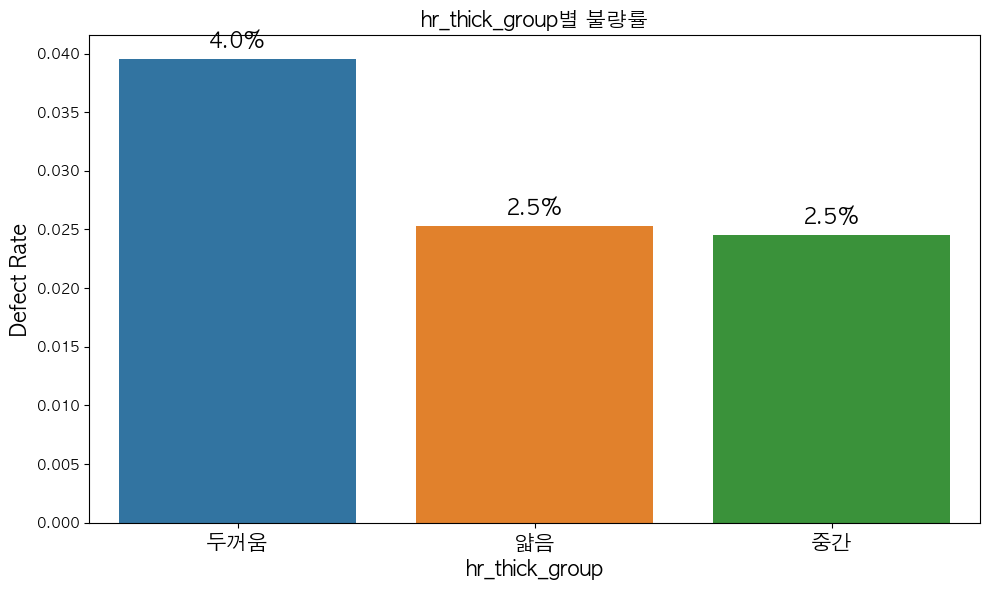

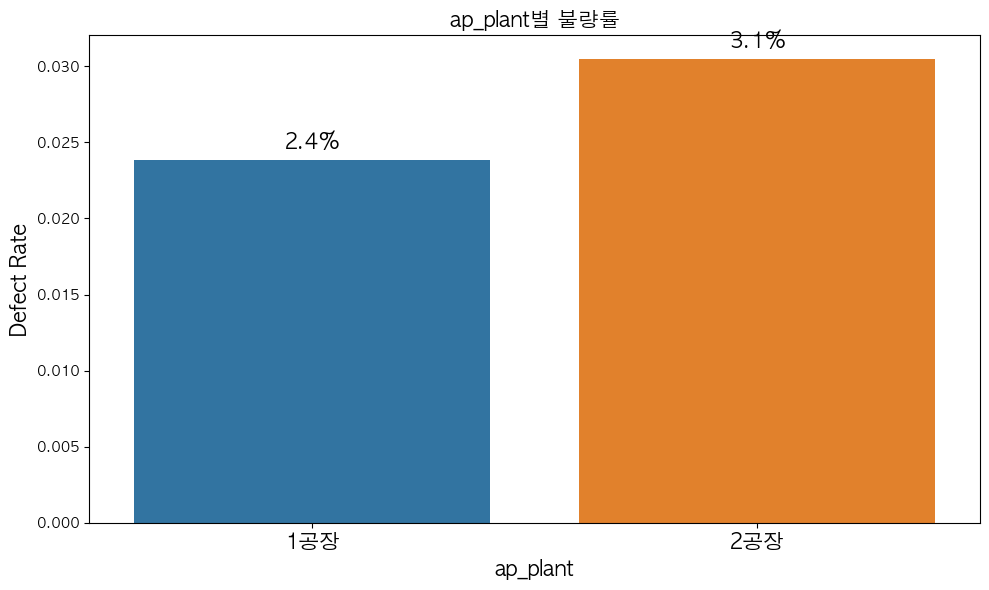

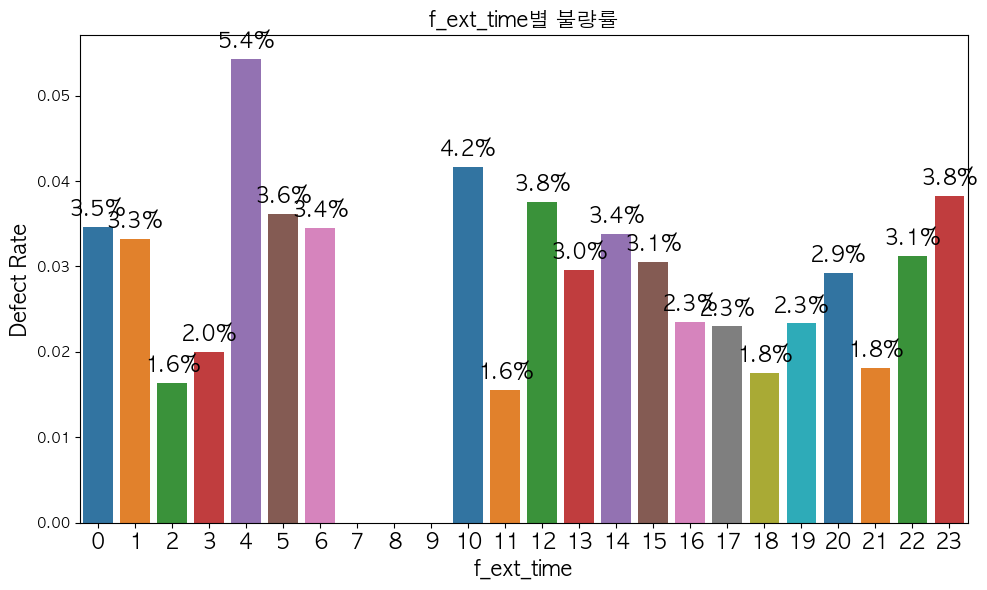

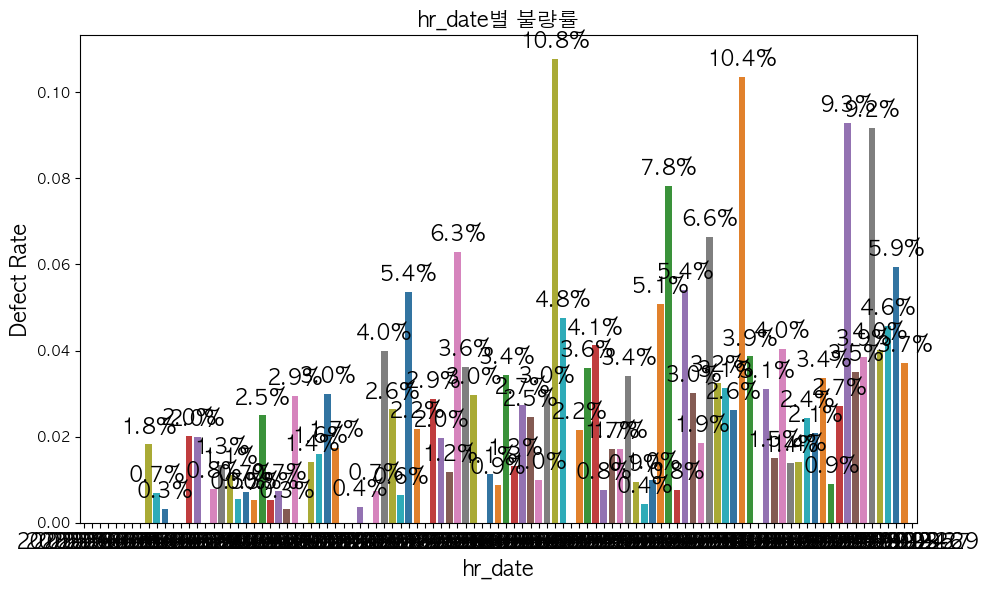

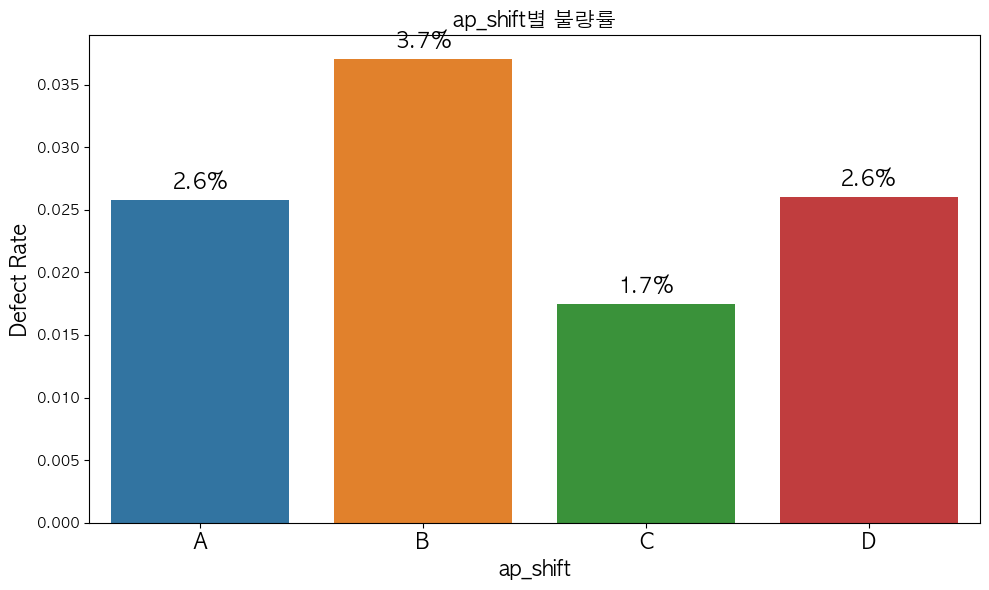

In [91]:
# 진짜
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

target_cols = [
    'sm_plant', 'steel_usage', 'ap_date', 'slab_grind', 'furnace_no', 
    'f_jangip_gubun', 'cast_date', 'f_ext_date', 'hr_thick_group', 
    'ap_plant', 'f_ext_time', 'hr_date', 'ap_shift'
]

for col in target_cols:

    order = sorted(final_df[col].dropna().unique())

    # 1️⃣ 전체 개수
    total_counts = final_df[col].value_counts()

    # 2️⃣ 불량 개수
    defect_counts = final_df[final_df['judge'] == '불량'][col].value_counts()

    # 3️⃣ 불량률 계산
    defect_rate = (
        (defect_counts / total_counts)
        .reindex(order)
        .fillna(0)
        .reset_index()
    )
    defect_rate.columns = [col, 'defect_rate']

    plt.figure(figsize=(10, 6))

    # 4️⃣ barplot
    ax = sns.barplot(
        x=col,
        y='defect_rate',
        data=defect_rate,
        # color='#ff7f0e'
        palette='tab10'
    )

    # 5️⃣ 값 표시 (%)
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(
                f'{height*100:.1f}%',
                (p.get_x() + p.get_width()/2., height),
                ha='center',
                va='bottom',
                fontsize=15,
                xytext=(0, 5),
                textcoords='offset points'
            )

    plt.title(f'{col}별 불량률', fontsize=15)
    plt.xticks(rotation=0, fontsize=15)
    ax.set_xlabel(col, fontsize=15)
    plt.ylabel('Defect Rate', fontsize=15)
    
    plt.tight_layout()
    plt.show()

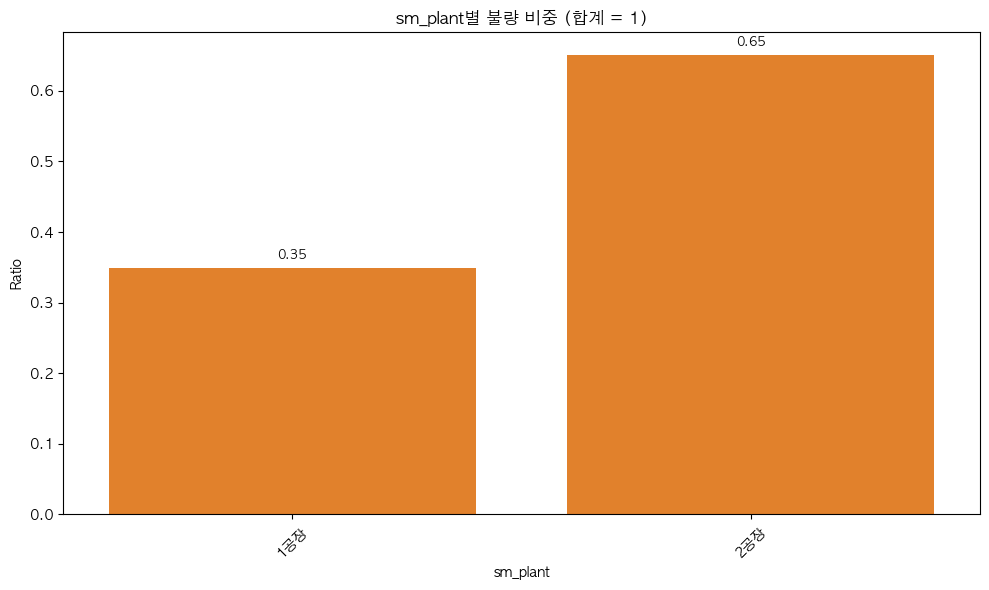

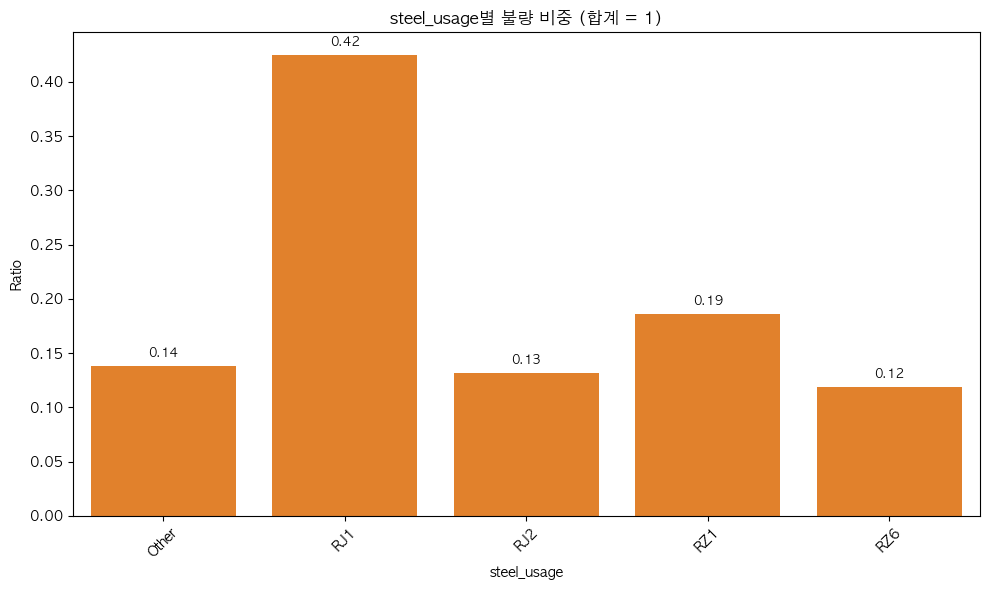

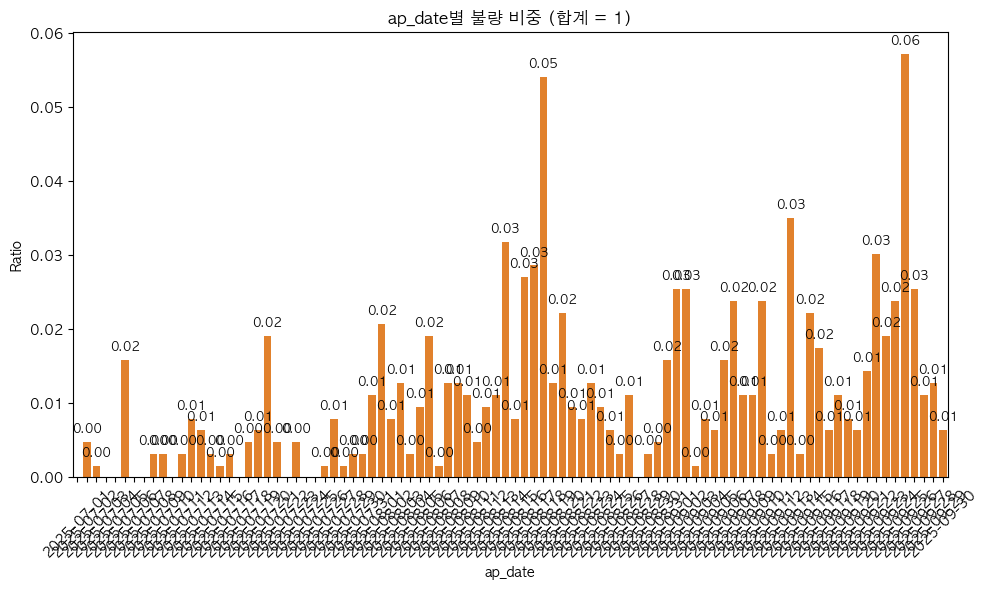

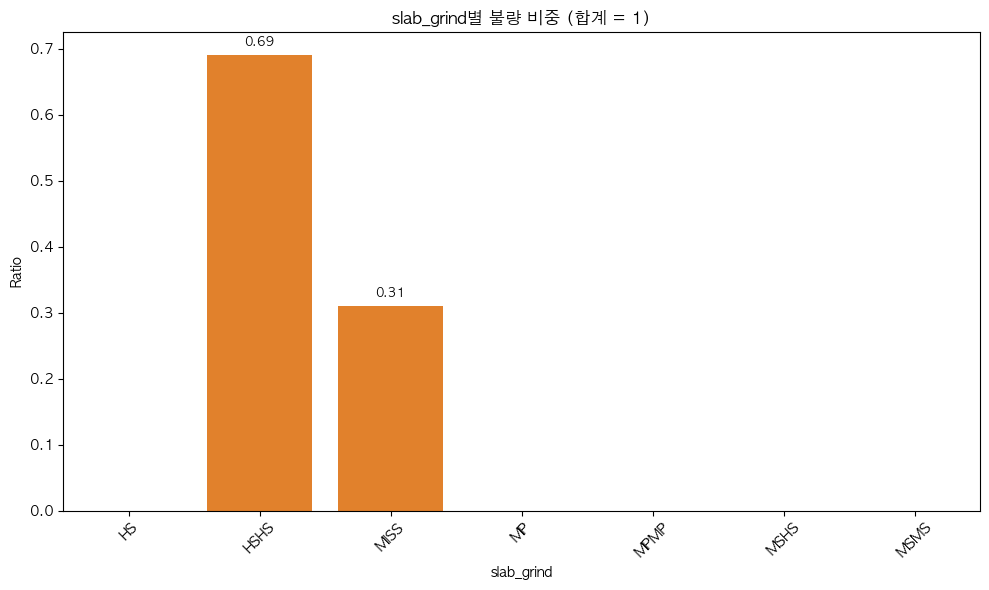

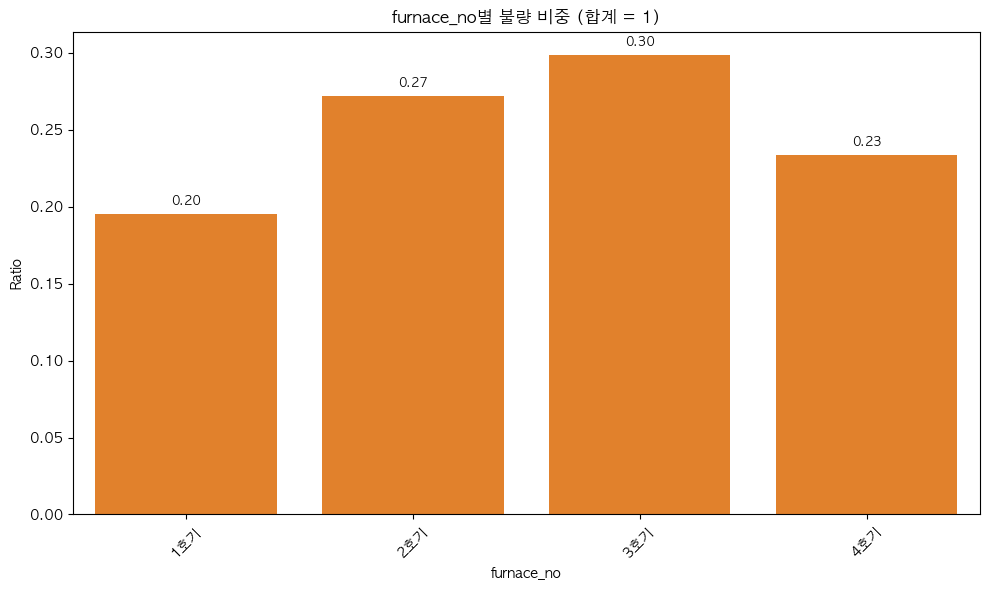

...

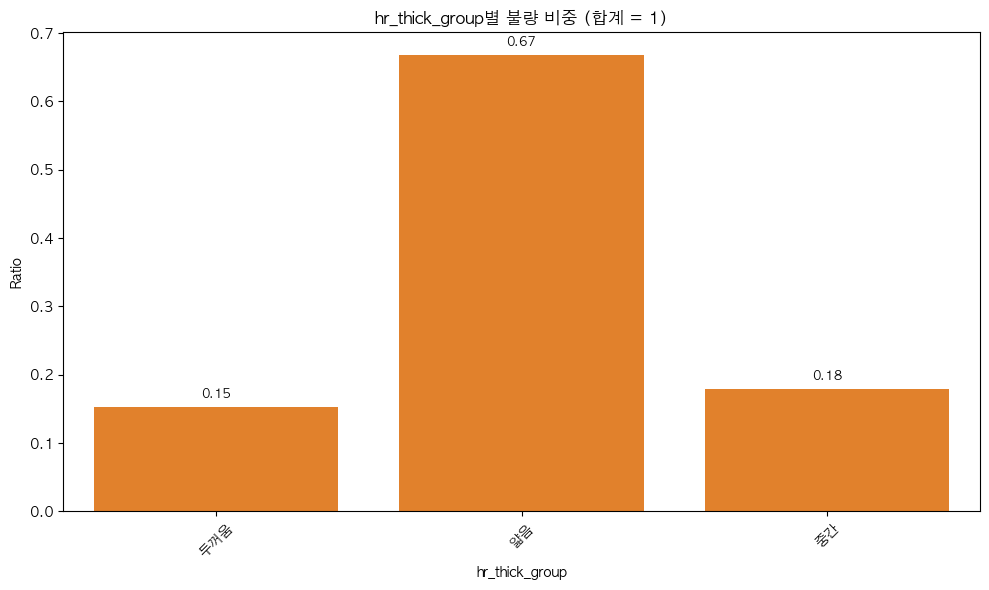

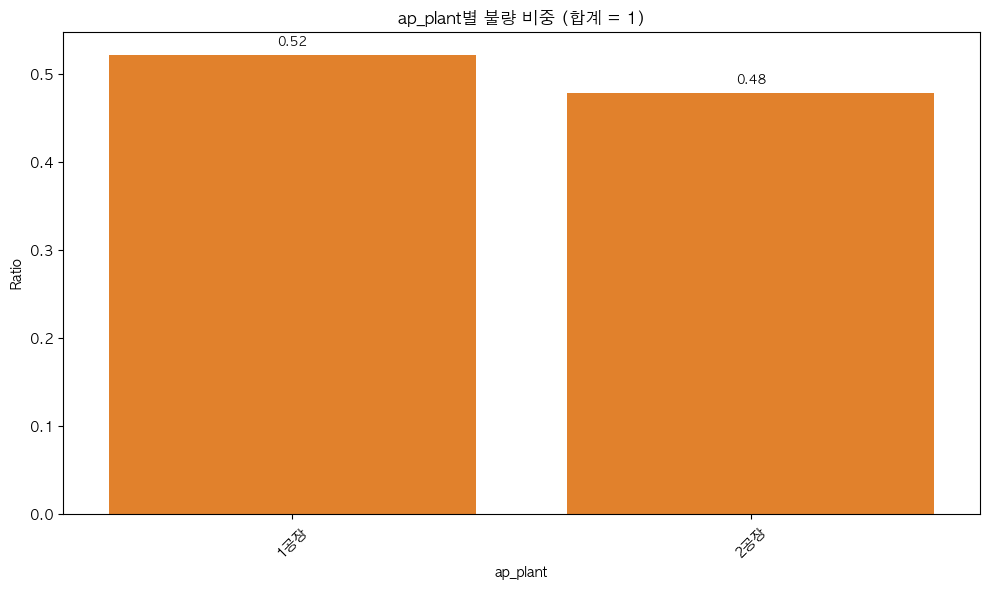

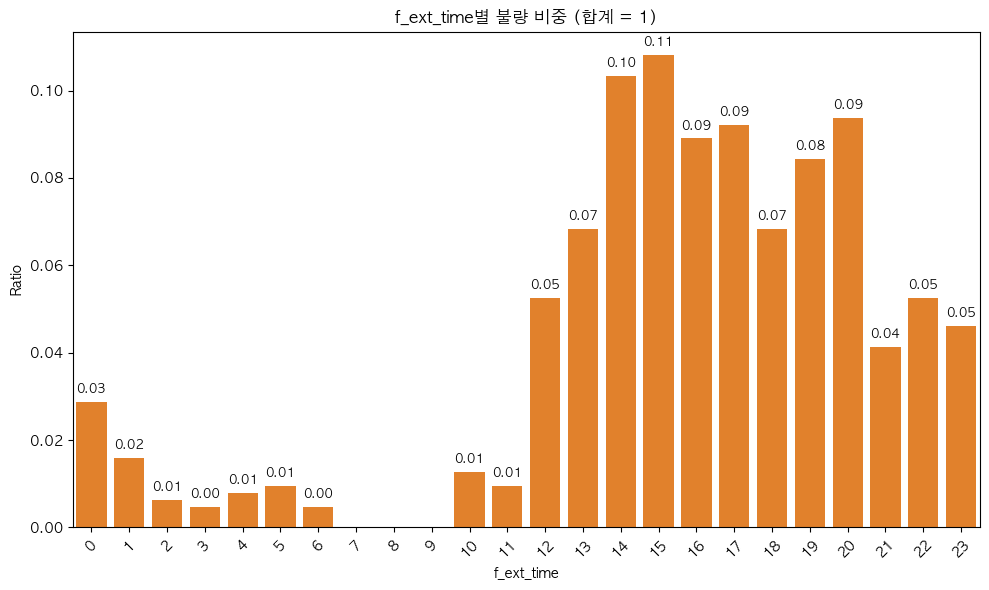

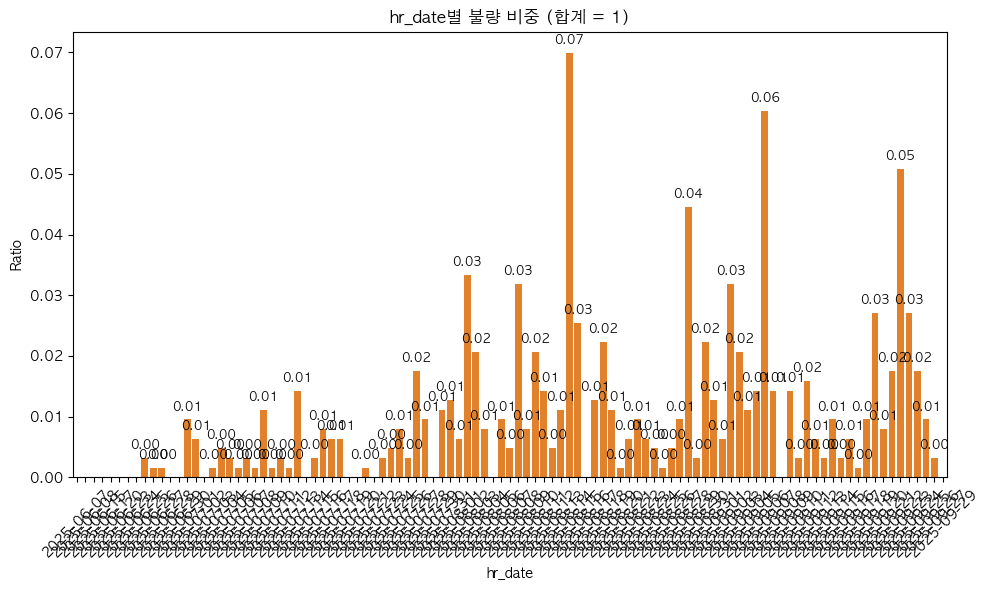

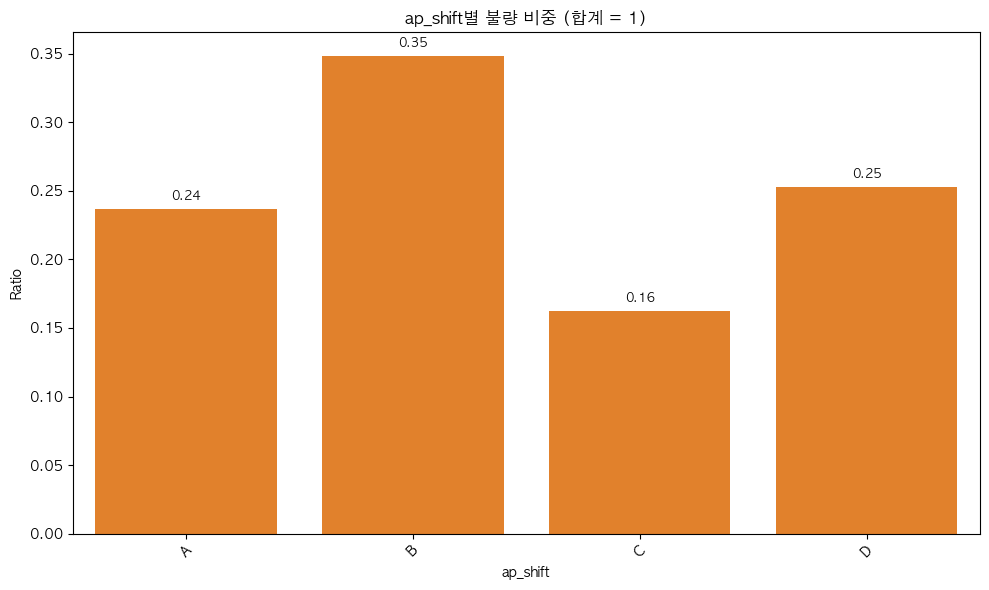

In [92]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

target_cols = [
    'sm_plant', 'steel_usage', 'ap_date', 'slab_grind', 'furnace_no', 
    'f_jangip_gubun', 'cast_date', 'f_ext_date', 'hr_thick_group', 
    'ap_plant', 'f_ext_time', 'hr_date', 'ap_shift'
]

for col in target_cols:

    order = sorted(final_df[col].dropna().unique())

    # 1️⃣ 불량 데이터만 필터
    df_defect = final_df[final_df['judge'] == '불량']

    # 2️⃣ 비율 계산 (합 = 1)
    ratio = (
        df_defect[col]
        .value_counts(normalize=True)
        .reindex(order)
        .fillna(0)
        .reset_index()
    )
    ratio.columns = [col, 'ratio']

    plt.figure(figsize=(10, 6))

    # 3️⃣ barplot
    ax = sns.barplot(
        x=col,
        y='ratio',
        data=ratio,
        color='#ff7f0e'
    )

    # 4️⃣ 비율 값 표시
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(
                f'{height:.2f}',
                (p.get_x() + p.get_width()/2., height),
                ha='center',
                va='bottom',
                fontsize=9,
                xytext=(0, 5),
                textcoords='offset points'
            )

    plt.title(f'{col}별 불량 비중 (합계 = 1)', fontsize=12)
    plt.xticks(rotation=45, fontsize=10)
    plt.ylabel('Ratio')

    plt.tight_layout()
    plt.show()

## 제강/연주 + 꺾은선 추가

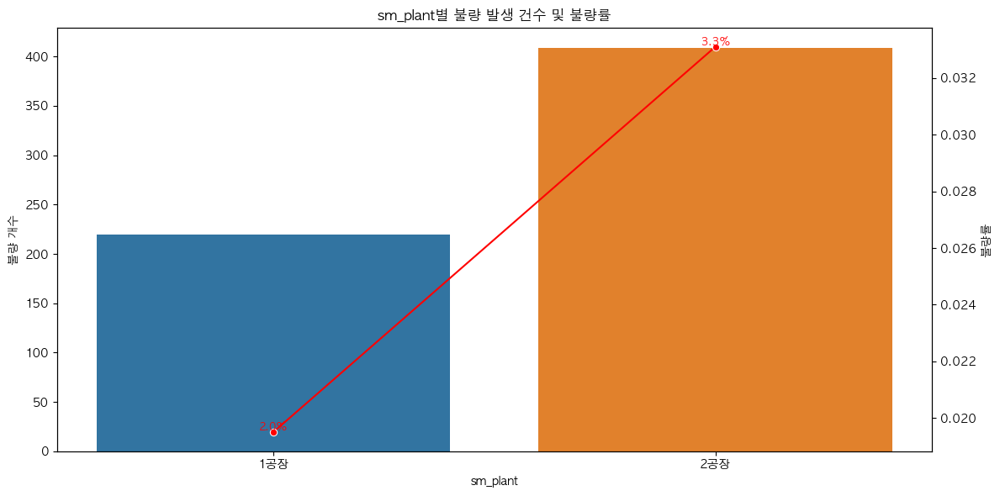

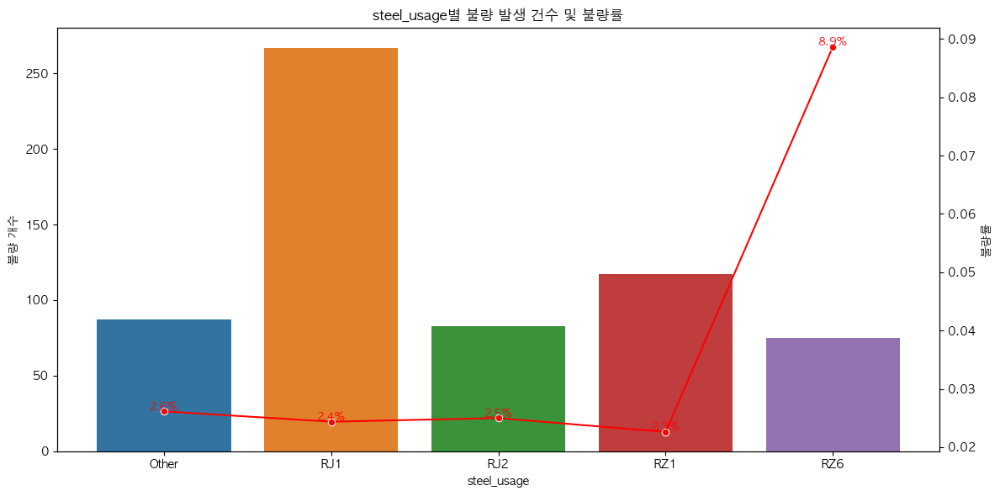

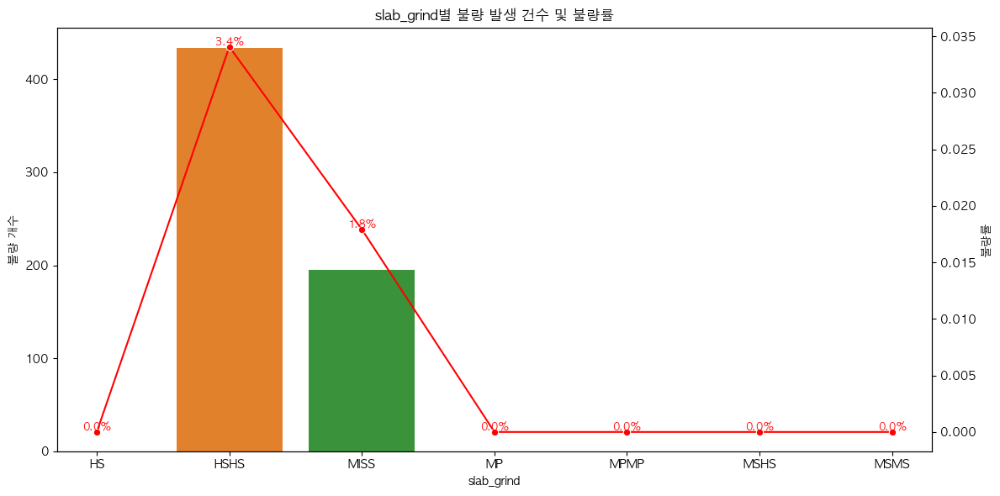

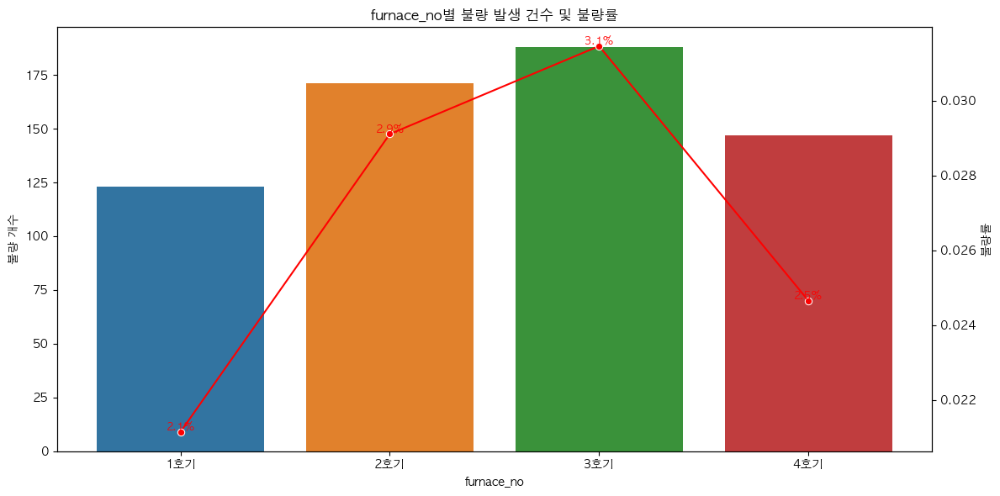

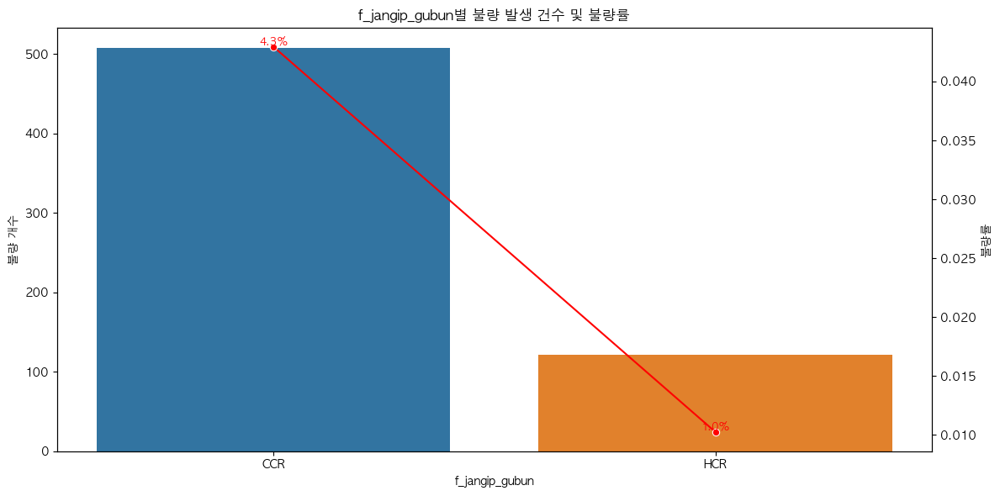

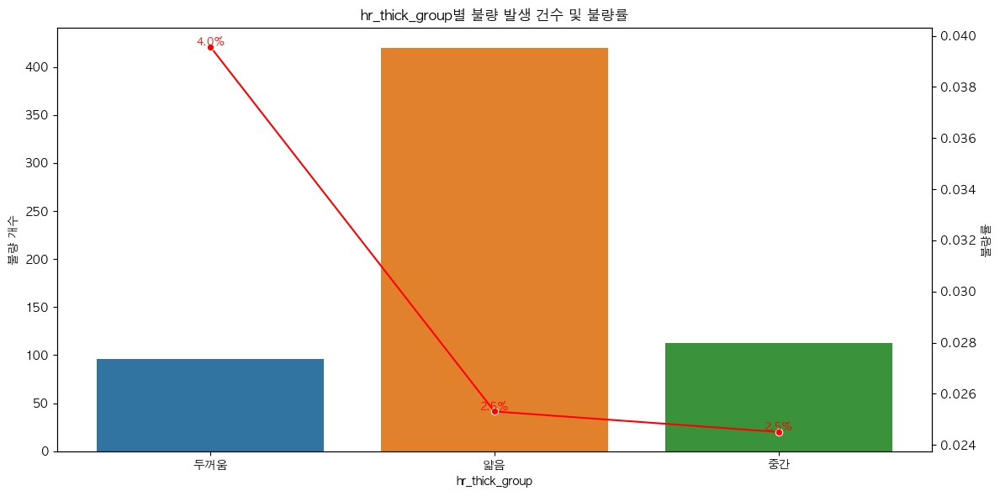

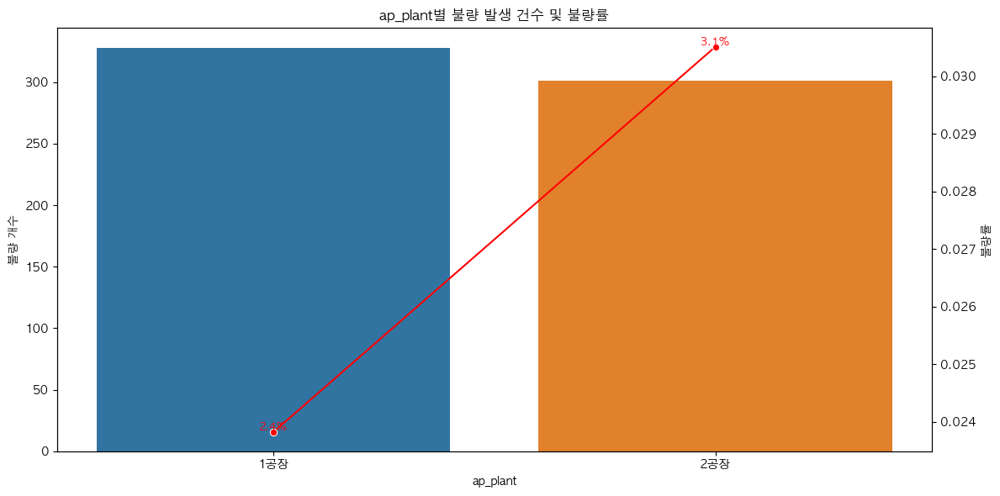

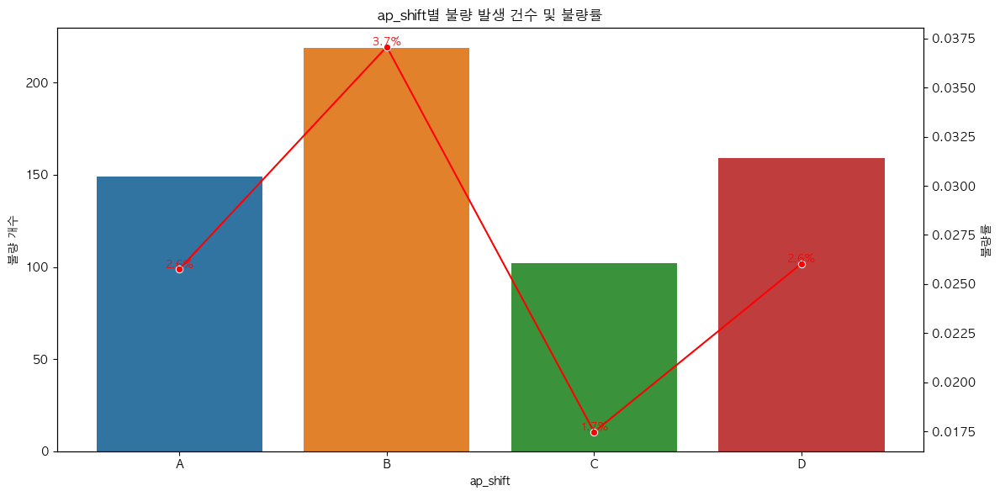

In [93]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

target_cols = [
    'sm_plant', 'steel_usage', 'slab_grind', 'furnace_no', 
    'f_jangip_gubun', 'hr_thick_group', 
    'ap_plant', 'ap_shift'
]

for col in target_cols:

    order = sorted(final_df[col].dropna().unique())

    plt.figure(figsize=(12, 6))

    # 1️⃣ 불량 데이터
    df_defect = final_df[final_df['judge'] == '불량']

    # 2️⃣ countplot (막대)
    ax1 = sns.countplot(
        x=col,
        data=df_defect,
        order=order,
        palette='tab10'
    )

    # 3️⃣ 전체 / 불량 개수
    total_counts = final_df[col].value_counts()
    defect_counts = df_defect[col].value_counts()

    # 4️⃣ 불량률 계산 (네 방식)
    defect_rate = (
        (defect_counts / total_counts)
        .reindex(order)
        .fillna(0)
        .reset_index()
    )
    defect_rate.columns = [col, 'defect_rate']

    # 5️⃣ 두 번째 y축 생성
    ax2 = ax1.twinx()

    # 6️⃣ 꺾은선 그래프
    sns.lineplot(
        x=col,
        y='defect_rate',
        data=defect_rate,
        sort=False,
        marker='o',
        color='red',
        ax=ax2
    )

    # 7️⃣ 퍼센트 표시
    for i, row in defect_rate.iterrows():
        ax2.text(
            i,
            row['defect_rate'],
            f"{row['defect_rate']*100:.1f}%",
            ha='center',
            va='bottom',
            fontsize=9,
            color='red'
        )

    # 8️⃣ 라벨
    ax1.set_title(f'{col}별 불량 발생 건수 및 불량률')
    ax1.set_ylabel('불량 개수')
    ax2.set_ylabel('불량률')

    plt.xticks(rotation=45, fontsize=10)

    plt.tight_layout()
    plt.show()

## 히트맵

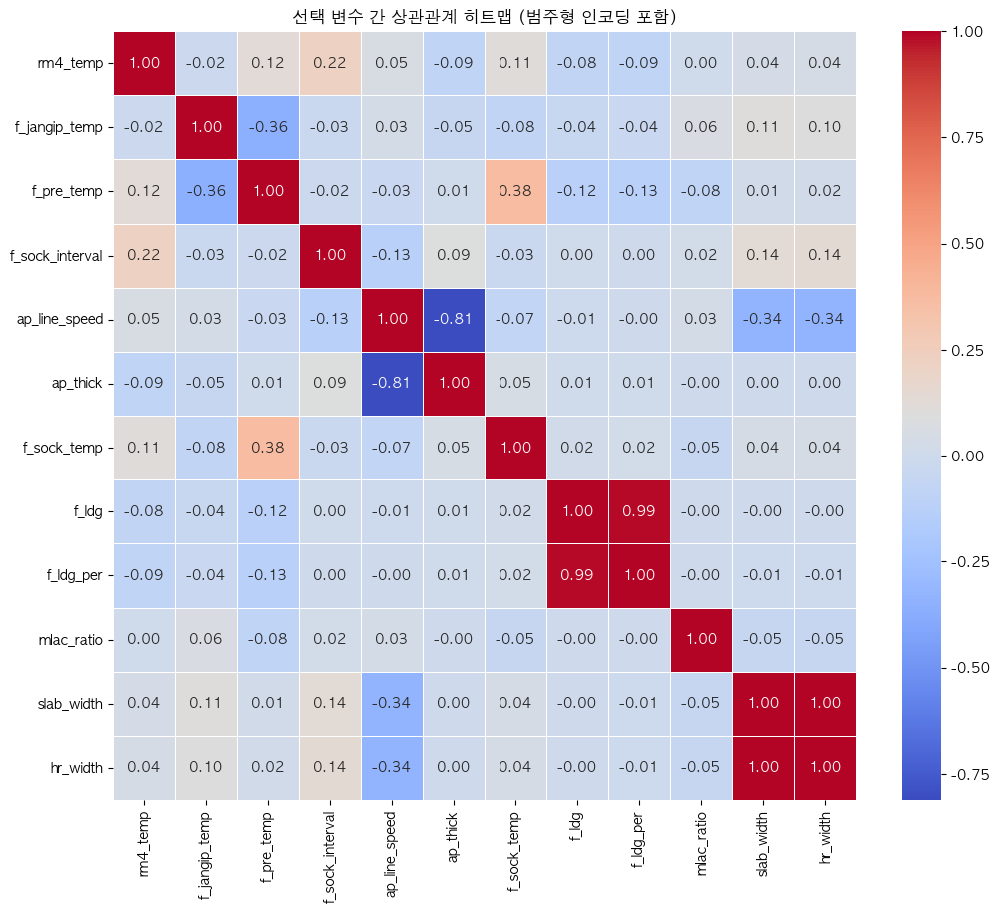

In [94]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. 대상 변수 리스트 (수치형 + 범주형 섞어서)
# 'is_bad'나 'judge' 수치화 버전도 포함하는 것이 좋습니다.
cols_to_view = ['rm4_temp',  'f_jangip_temp',
    'f_pre_temp',
    'f_sock_interval',
    'ap_line_speed',
    'ap_thick',
    'f_sock_temp',
    'f_ldg',
    'f_ldg_per',
    'mlac_ratio',
    'slab_width',
    'hr_width']

# 2. 범주형 변수를 숫자로 변환 (Label Encoding)
# 원본 데이터 보호를 위해 복사본 사용
plot_df = final_df[cols_to_view].copy()

for col in cols_to_view:
    if plot_df[col].dtype == 'object' or plot_df[col].dtype.name == 'category':
        # 범주형(문자열)을 숫자로 매핑 (예: A->0, B->1)
        plot_df[col] = plot_df[col].astype('category').cat.codes

# 3. 상관계수 계산 및 히트맵 시각화
plt.figure(figsize=(12, 10))
corr_matrix = plot_df.corr()

sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('선택 변수 간 상관관계 히트맵 (범주형 인코딩 포함)')
plt.show()

In [95]:
final_df['f_jangip_gubun']

0        CCR
1        CCR
2        CCR
3        CCR
4        CCR
        ... 
23627    HCR
23628    HCR
23629    HCR
23630    HCR
23631    HCR
Name: f_jangip_gubun, Length: 23632, dtype: object

## CCR 중심

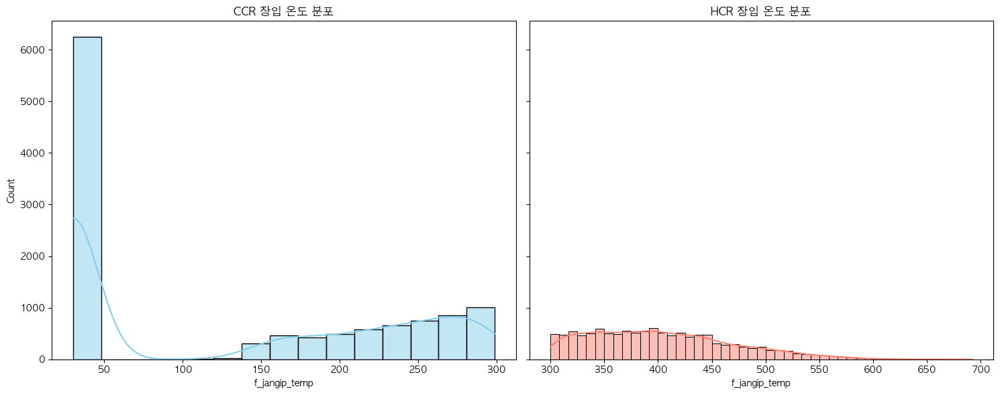

In [96]:
# 1. 시각화할 수치형 변수 설정 (예: 장입 온도)
target_num_col = 'f_jangip_temp'

# 2. 1행 2열의 서브플롯 생성
fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharey=True)

# CCR 그래프
sns.histplot(final_df[final_df['f_jangip_gubun'] == 'CCR'][target_num_col], 
             kde=True, ax=axes[0], color='skyblue')
axes[0].set_title('CCR 장입 온도 분포')

# HCR 그래프
sns.histplot(final_df[final_df['f_jangip_gubun'] == 'HCR'][target_num_col], 
             kde=True, ax=axes[1], color='salmon')
axes[1].set_title('HCR 장입 온도 분포')

plt.tight_layout()
plt.show()

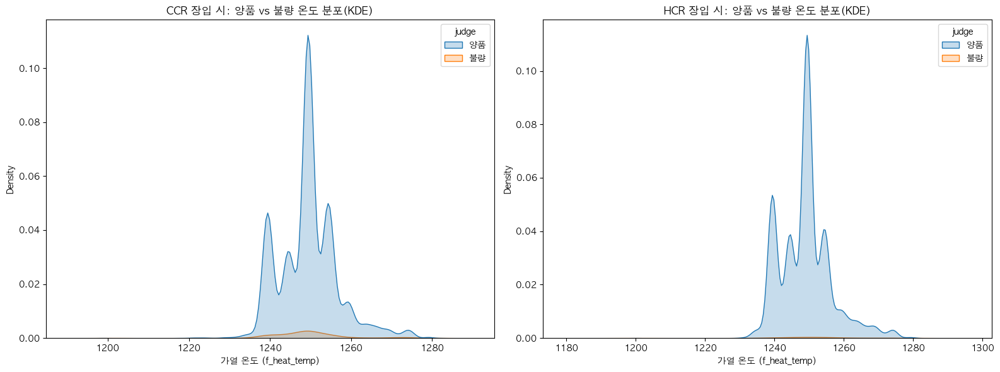

In [97]:
# 1. 1행 2열로 그래프 영역 나누기
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# --- [그래프 1] CCR일 때 양품 vs 불량 ---
sns.kdeplot(data=final_df[final_df['f_jangip_gubun'] == 'CCR'], 
            x='f_heat_temp', hue='judge', fill=True, ax=axes[0])
axes[0].set_title('CCR 장입 시: 양품 vs 불량 온도 분포(KDE)')
axes[0].set_xlabel('가열 온도 (f_heat_temp)')

# --- [그래프 2] HCR일 때 양품 vs 불량 ---
sns.kdeplot(data=final_df[final_df['f_jangip_gubun'] == 'HCR'], 
            x='f_heat_temp', hue='judge', fill=True, ax=axes[1])
axes[1].set_title('HCR 장입 시: 양품 vs 불량 온도 분포(KDE)')
axes[1].set_xlabel('가열 온도 (f_heat_temp)')

plt.tight_layout()
plt.show()

In [99]:
len(final_df.select_dtypes(include=['number']).columns)

34

In [100]:
final_df.select_dtypes(include=['number']).columns

Index(['delta_ferrite', 'ingre_cr', 'ingre_ni', 'ingre_s', 'tundish_temp',
       'mlac_ratio', 'slab_no', 'f_jangip_temp', 'f_bfg', 'f_cog', 'f_ldg',
       'f_bfg_per', 'f_cog_per', 'f_ldg_per', 'f_pre_temp', 'f_heat_temp',
       'f_sock_temp', 'f_pre_interval', 'f_heat_interval', 'f_sock_interval',
       'f_ext_time', 'hr_thick', 'hr_width', 'rm4_temp', 'rm_pitch',
       'slab_width', 'ap_thick', 'ap_width', 'ap_line_speed', 'f_total_time',
       'process_delay_time1', 'heat_pre_diff', 'sock_rm4_diff', 'is_bad'],
      dtype='object')

In [101]:
final_df.select_dtypes(include=['object']).columns

Index(['sm_plant', 'charge_id', 'steel_grade', 'steel_usage', 'cc_gubun',
       'slab_gubun', 'slab_grind', 'furnace_no', 'f_jangip_gubun',
       'hr_coil_id', 'hr_thick_group', 'judge', 'ap_plant', 'ap_prod_id',
       'ap_shift'],
      dtype='object')

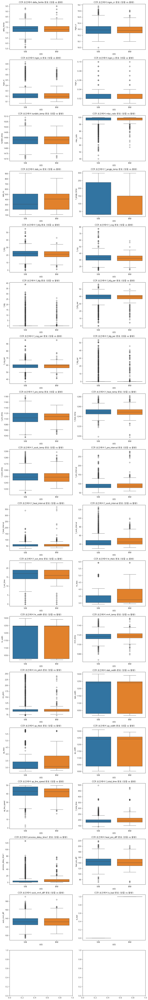

In [102]:
# 1️⃣ CCR 데이터만 필터
df_ccr = final_df[final_df['f_jangip_gubun'] == 'CCR']
num_cols = final_df.select_dtypes(include=['number']).columns

# 2️⃣ 서브플롯
fig, axes = plt.subplots(18, 2, figsize=(12, 80))

for i, col in enumerate(num_cols):
    row = i // 2
    col_idx = i % 2
    
    sns.boxplot(
        x='judge',   # 👉 양품 vs 불량 비교
        y=col,
        data=df_ccr,
        ax=axes[row, col_idx],
        palette={'양품': '#1f77b4', '불량': '#ff7f0e'}
    )
    
    axes[row, col_idx].set_title(f'CCR 조건에서 {col} 분포 (양품 vs 불량)')
    axes[row, col_idx].set_xlabel('판정')
    axes[row, col_idx].set_ylabel(col)

plt.tight_layout()
plt.show()

### kdeplot

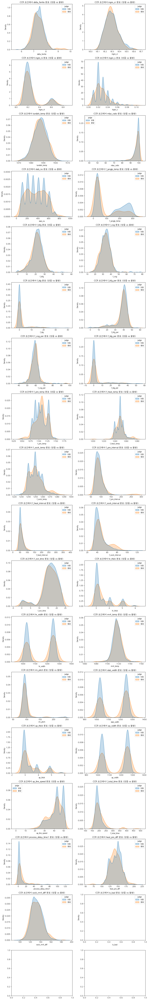

In [103]:
# 1️⃣ CCR 데이터만 필터
df_ccr = final_df[final_df['f_jangip_gubun'] == 'CCR']
num_cols = final_df.select_dtypes(include=['number']).columns

# 2️⃣ 서브플롯
fig, axes = plt.subplots(18, 2, figsize=(12, 80))

for i, col in enumerate(num_cols):
    row = i // 2
    col_idx = i % 2
    
    sns.kdeplot(
        data=df_ccr,
        x=col,
        hue='judge',   # 👉 양품 vs 불량 비교
        fill=True,
        common_norm=False,   # 👉 각각 따로 정규화 (중요🔥)
        palette={'양품': '#1f77b4', '불량': '#ff7f0e'},
        ax=axes[row, col_idx]
    )
    
    axes[row, col_idx].set_title(f'CCR 조건에서 {col} 분포 (양품 vs 불량)')
    axes[row, col_idx].set_xlabel(col)
    axes[row, col_idx].set_ylabel('Density')

plt.tight_layout()
plt.show()

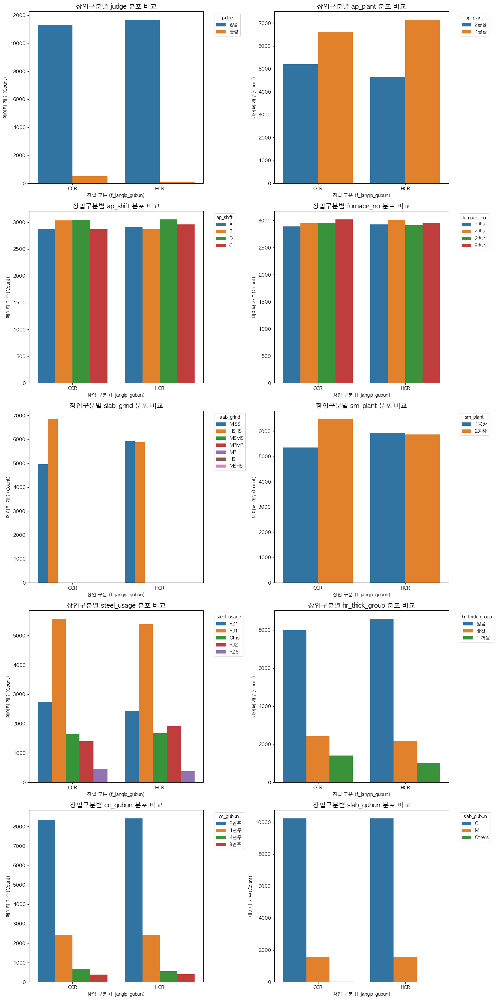

In [105]:
# 1. 분석할 범주형 변수 10개 설정
cat_features = [
    'judge', 'ap_plant', 'ap_shift', 'furnace_no', 
    'slab_grind', 'sm_plant', 'steel_usage', 'hr_thick_group',
    'cc_gubun', 'slab_gubun' # 10개를 채우기 위해 임의로 추가했습니다.
]

# 2. 5행 2열 서브플롯 설정
fig, axes = plt.subplots(5, 2, figsize=(15, 30))

# 3. 그래프 반복 그리기
for i, col in enumerate(cat_features):
    row = i // 2
    col_idx = i % 2
    
    # x축을 CCR/HCR로 고정하고, 해당 변수의 범주들을 색상(hue)으로 구분
    sns.countplot(x='f_jangip_gubun', hue=col, data=final_df, ax=axes[row, col_idx])
    
    axes[row, col_idx].set_title(f'장입구분별 {col} 분포 비교', fontsize=14)
    axes[row, col_idx].set_xlabel('장입 구분 (f_jangip_gubun)')
    axes[row, col_idx].set_ylabel('데이터 개수(Count)')
    axes[row, col_idx].legend(title=col, bbox_to_anchor=(1.05, 1), loc='upper left') # 범례가 그래프를 가리지 않게 밖으로 뺌

# 4. 레이아웃 조정
plt.tight_layout()
plt.show()

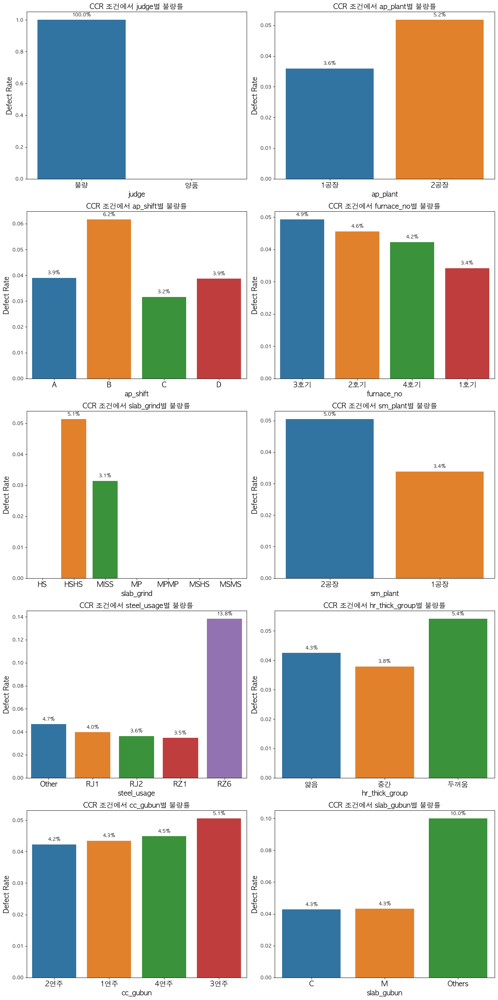

In [106]:
# 1️⃣ CCR 데이터만 필터
df_ccr = final_df[final_df['f_jangip_gubun'] == 'CCR']

cat_features = [
    'judge', 'ap_plant', 'ap_shift', 'furnace_no', 
    'slab_grind', 'sm_plant', 'steel_usage', 'hr_thick_group',
    'cc_gubun', 'slab_gubun'
]

fig, axes = plt.subplots(5, 2, figsize=(15, 30))

for i, col in enumerate(cat_features):
    row = i // 2
    col_idx = i % 2

    # 1️⃣ 전체 / 불량 개수
    total_counts = df_ccr[col].value_counts()
    defect_counts = df_ccr[df_ccr['judge'] == '불량'][col].value_counts()

    # 2️⃣ 불량률 계산
    defect_rate = (
        (defect_counts / total_counts)
        .reset_index()
    )
    defect_rate.columns = [col, 'defect_rate']

    # 3️⃣ barplot
    ax = sns.barplot(
        x=col,
        y='defect_rate',
        data=defect_rate,
        ax=axes[row, col_idx],
        palette='tab10'
    )

    # 4️⃣ 퍼센트 표시
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(
                f'{height*100:.1f}%',
                (p.get_x() + p.get_width()/2., height),
                ha='center',
                va='bottom',
                fontsize=10,
                xytext=(0, 5),
                textcoords='offset points'
            )

    axes[row, col_idx].set_title(f'CCR 조건에서 {col}별 불량률', fontsize=15)
    axes[row, col_idx].set_xlabel(col, fontsize=15)
    axes[row, col_idx].set_ylabel('Defect Rate', fontsize=15)
    axes[row, col_idx].tick_params(axis='x', rotation=0, labelsize=15)

plt.tight_layout()
plt.show()

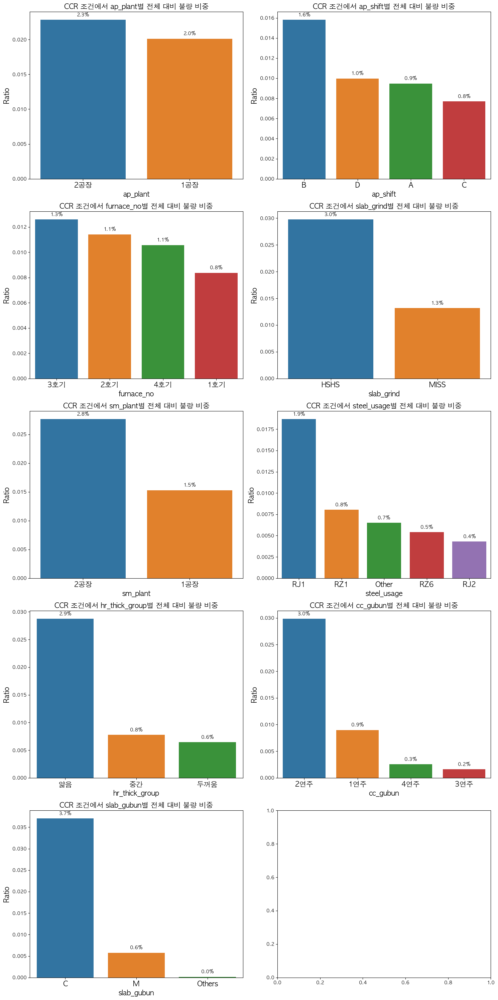

In [107]:
# 1️⃣ CCR 데이터만 필터
df_ccr = final_df[final_df['f_jangip_gubun'] == 'CCR']

cat_features = [
    'ap_plant', 'ap_shift', 'furnace_no', 
    'slab_grind', 'sm_plant', 'steel_usage', 'hr_thick_group',
    'cc_gubun', 'slab_gubun'
]

fig, axes = plt.subplots(5, 2, figsize=(15, 30))

# 👉 전체 생산 수 (고정)
total_all = len(df_ccr)

for i, col in enumerate(cat_features):
    row = i // 2
    col_idx = i % 2

    # 1️⃣ 불량 개수 (범주별)
    defect_counts = df_ccr[df_ccr['judge'] == '불량'][col].value_counts()

    # 2️⃣ 전체 대비 비율 계산
    ratio = (
        (defect_counts / total_all)
        .reset_index()
    )
    ratio.columns = [col, 'ratio']

    # 3️⃣ 그래프
    ax = sns.barplot(
        x=col,
        y='ratio',
        data=ratio,
        ax=axes[row, col_idx],
        palette='tab10'
    )

    # 4️⃣ 퍼센트 표시
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(
                f'{height*100:.1f}%',
                (p.get_x() + p.get_width()/2., height),
                ha='center',
                va='bottom',
                fontsize=10,
                xytext=(0, 5),
                textcoords='offset points'
            )

    axes[row, col_idx].set_title(f'CCR 조건에서 {col}별 전체 대비 불량 비중', fontsize=15)
    axes[row, col_idx].set_xlabel(col, fontsize=15)
    axes[row, col_idx].set_ylabel('Ratio', fontsize=15)
    axes[row, col_idx].tick_params(axis='x', rotation=0, labelsize=15)

plt.tight_layout()
plt.show()

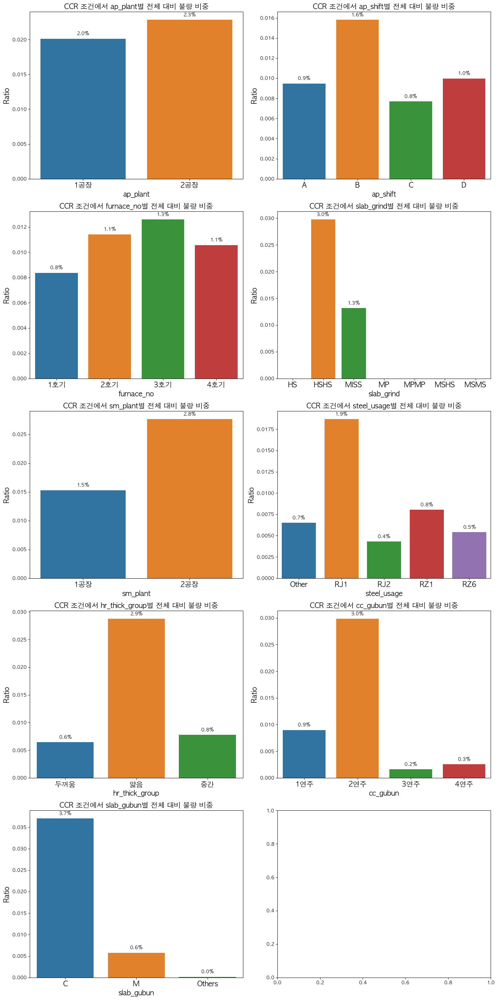

In [108]:
# 1️⃣ CCR 데이터만 필터
df_ccr = final_df[final_df['f_jangip_gubun'] == 'CCR']

cat_features = [
    'ap_plant', 'ap_shift', 'furnace_no', 
    'slab_grind', 'sm_plant', 'steel_usage', 'hr_thick_group',
    'cc_gubun', 'slab_gubun'
]

fig, axes = plt.subplots(5, 2, figsize=(15, 30))

# 전체 생산 수
total_all = len(df_ccr)

for i, col in enumerate(cat_features):
    row = i // 2
    col_idx = i % 2

    # 🔥 전체 범주 순서 확보
    order = sorted(df_ccr[col].dropna().unique())

    # 1️⃣ 불량 개수
    defect_counts = df_ccr[df_ccr['judge'] == '불량'][col].value_counts()

    # 2️⃣ 전체 대비 비율 + reindex (핵심🔥)
    ratio = (
        (defect_counts / total_all)
        .reindex(order)        # 👉 빠진 범주 채움
        .fillna(0)             # 👉 NaN → 0
        .reset_index()
    )
    ratio.columns = [col, 'ratio']

    # 3️⃣ 그래프 (order 반드시 같이!)
    ax = sns.barplot(
        x=col,
        y='ratio',
        data=ratio,
        order=order,           # 👉 순서 고정
        ax=axes[row, col_idx],
        palette='tab10'
    )

    # 4️⃣ 퍼센트 표시
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(
                f'{height*100:.1f}%',
                (p.get_x() + p.get_width()/2., height),
                ha='center',
                va='bottom',
                fontsize=10,
                xytext=(0, 5),
                textcoords='offset points'
            )

    axes[row, col_idx].set_title(f'CCR 조건에서 {col}별 전체 대비 불량 비중', fontsize=15)
    axes[row, col_idx].set_xlabel(col, fontsize=15)
    axes[row, col_idx].set_ylabel('Ratio', fontsize=15)
    axes[row, col_idx].tick_params(axis='x', rotation=0, labelsize=15)

plt.tight_layout()
plt.show()

## CCR 파이차트

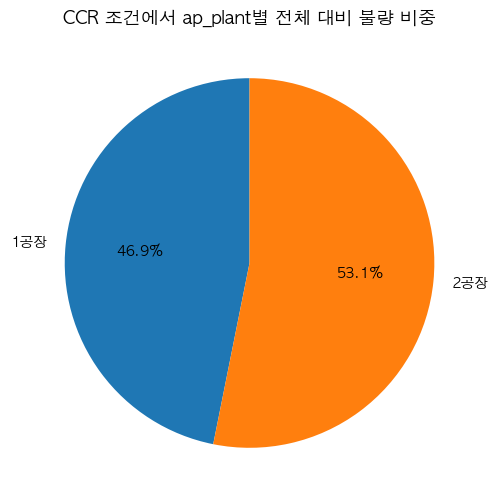

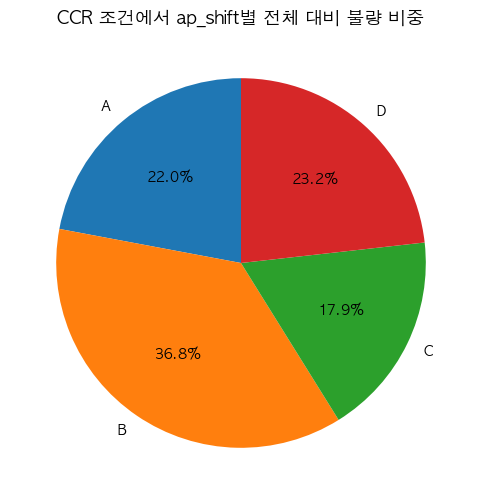

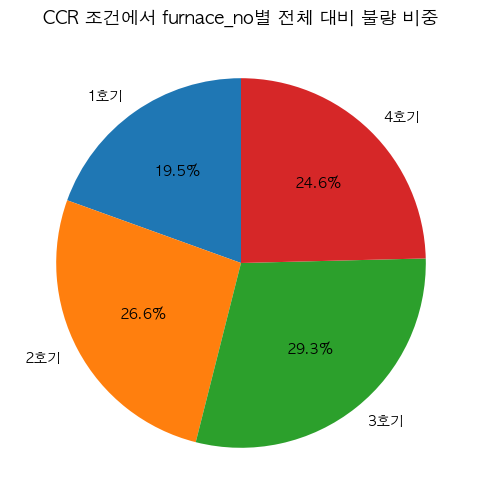

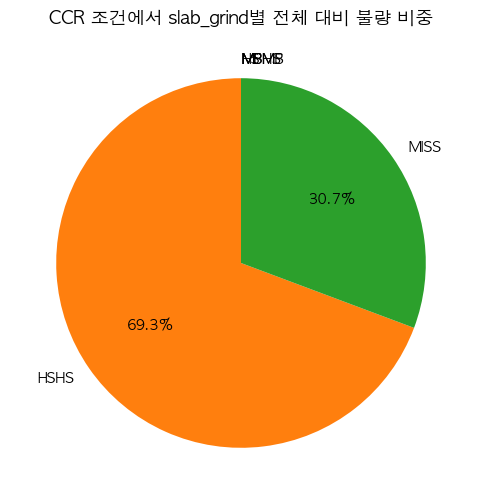

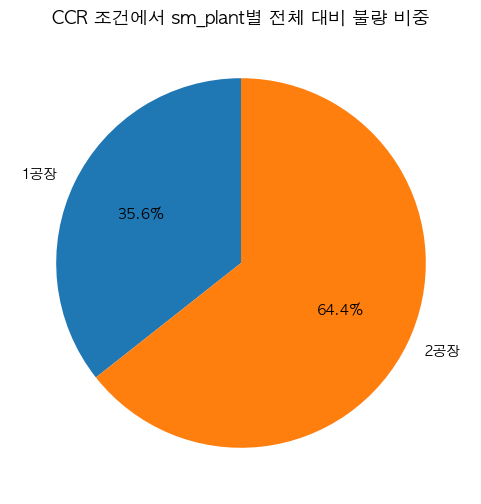

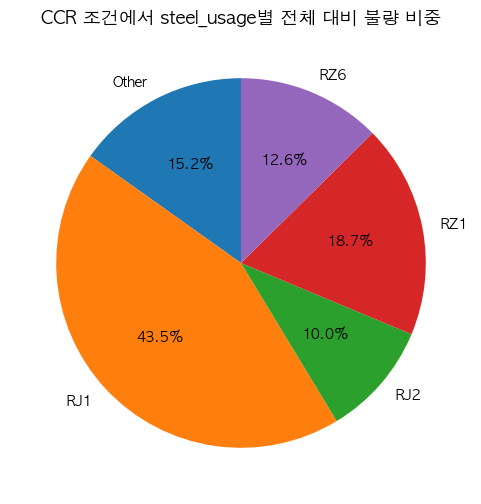

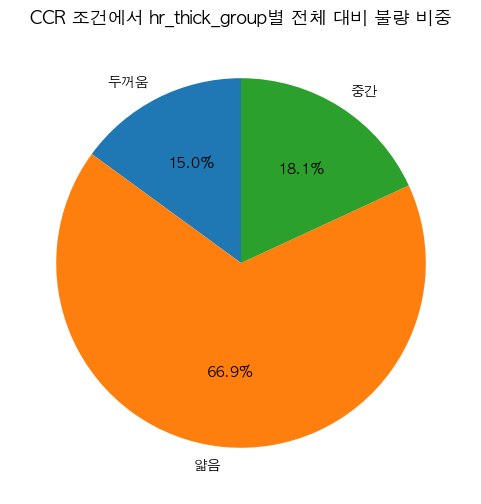

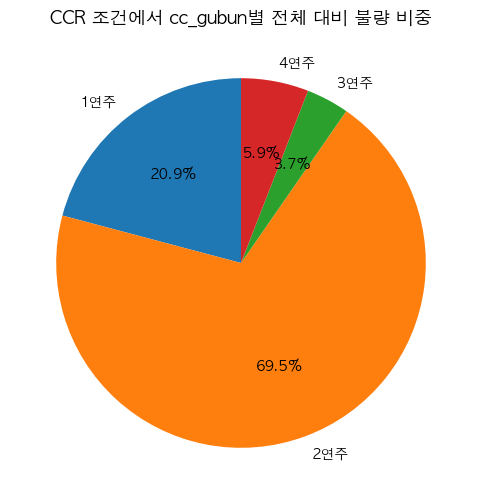

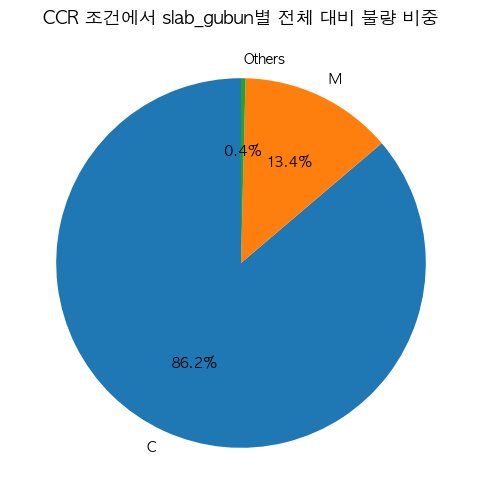

In [109]:
# 1️⃣ CCR 데이터
df_ccr = final_df[final_df['f_jangip_gubun'] == 'CCR']

cat_features = [
    'ap_plant', 'ap_shift', 'furnace_no', 
    'slab_grind', 'sm_plant', 'steel_usage', 'hr_thick_group',
    'cc_gubun', 'slab_gubun'
]

# 전체 생산 수
total_all = len(df_ccr)

for col in cat_features:

    # 전체 범주
    order = sorted(df_ccr[col].dropna().unique())

    # 불량 개수
    defect_counts = df_ccr[df_ccr['judge'] == '불량'][col].value_counts()

    # 전체 대비 비율
    ratio = (
        (defect_counts / total_all)
        .reindex(order)
        .fillna(0)
    )

    plt.figure(figsize=(6, 6))

    plt.pie(
        ratio,
        labels=ratio.index,
        autopct=lambda x: f'{x:.1f}%' if x > 0 else '',
        startangle=90
    )

    plt.title(f'CCR 조건에서 {col}별 전체 대비 불량 비중', fontsize=13)
    plt.show()

### 변수 별 불량 양품 개수

In [110]:
target_cols = [
    'sm_plant', 'steel_usage', 'ap_date', 'slab_grind', 'furnace_no', 
    'f_jangip_gubun', 'cast_date', 'f_ext_date', 'hr_thick_group', 
    'ap_plant', 'f_ext_time', 'hr_date', 'ap_shift'
]

for col in target_cols:
    print(f'\n📊 {col} count table')
    print(pd.crosstab(final_df[col], final_df['judge']))


📊 sm_plant count table
judge      불량     양품
sm_plant            
1공장       220  11058
2공장       409  11945

📊 steel_usage count table
judge         불량     양품
steel_usage            
Other         87   3242
RJ1          267  10692
RJ2           83   3239
RZ1          117   5059
RZ6           75    771

📊 ap_date count table
judge       불량   양품
ap_date            
2025-07-01   0  160
2025-07-02   3  194
2025-07-03   1  240
2025-07-04   0  162
2025-07-05   0  221
...         ..  ...
2025-09-26  36  501
2025-09-27  16  295
2025-09-28   7  238
2025-09-29   8  240
2025-09-30   4  192

[92 rows x 2 columns]

📊 slab_grind count table
judge        불량     양품
slab_grind            
HS            0      1
HSHS        434  12301
MISS        195  10690
MP            0      1
MPMP          0      6
MSHS          0      1
MSMS          0      3

📊 furnace_no count table
judge        불량    양품
furnace_no           
1호기         123  5695
2호기         171  5704
3호기         188  5788
4호기         147  5816


### 변수별 불량 개수

In [111]:
for col in target_cols:
    print(f'\n📊 {col} 불량 count table')
    print(pd.crosstab(final_df[col], final_df['judge'])[['불량']])


📊 sm_plant 불량 count table
judge      불량
sm_plant     
1공장       220
2공장       409

📊 steel_usage 불량 count table
judge         불량
steel_usage     
Other         87
RJ1          267
RJ2           83
RZ1          117
RZ6           75

📊 ap_date 불량 count table
judge       불량
ap_date       
2025-07-01   0
2025-07-02   3
2025-07-03   1
2025-07-04   0
2025-07-05   0
...         ..
2025-09-26  36
2025-09-27  16
2025-09-28   7
2025-09-29   8
2025-09-30   4

[92 rows x 1 columns]

📊 slab_grind 불량 count table
judge        불량
slab_grind     
HS            0
HSHS        434
MISS        195
MP            0
MPMP          0
MSHS          0
MSMS          0

📊 furnace_no 불량 count table
judge        불량
furnace_no     
1호기         123
2호기         171
3호기         188
4호기         147

📊 f_jangip_gubun 불량 count table
judge            불량
f_jangip_gubun     
CCR             508
HCR             121

📊 cast_date 불량 count table
judge       불량
cast_date     
2025-04-04   0
2025-04-22   1
2025-04-23   0
2025-05-03

In [112]:
# 1. 장입구분 & 연마방식별 불량률
grind_risk = final_df.groupby(['f_jangip_gubun', 'slab_grind'])['is_bad'].mean().unstack()

# 2. 장입구분 & 공장별 불량률
plant_risk = final_df.groupby(['f_jangip_gubun', 'ap_plant'])['is_bad'].mean().unstack()

# 3. 장입구분 & steel_usage 불량률
steel_risk = final_df.groupby(['f_jangip_gubun', 'steel_usage'])['is_bad'].mean().unstack()


print("--- 연마방식별 불량률 ---")
print(grind_risk)
print("\n--- 공장별 불량률 ---")
print(plant_risk)
print("\n--- 강종별 불량률 ---")
print(steel_risk)



--- 연마방식별 불량률 ---
slab_grind       HS      HSHS      MISS   MP  MPMP  MSHS  MSMS
f_jangip_gubun                                                
CCR             0.0  0.051357  0.031445  0.0   0.0   0.0   0.0
HCR             NaN  0.013943  0.006583  NaN   NaN   NaN   NaN

--- 공장별 불량률 ---
ap_plant             1공장       2공장
f_jangip_gubun                    
CCR             0.035968  0.051823
HCR             0.012587  0.006660

--- 강종별 불량률 ---
steel_usage        Other       RJ1       RJ2       RZ1       RZ6
f_jangip_gubun                                                  
CCR             0.046723  0.039648  0.036377  0.034672  0.138229
HCR             0.005949  0.008542  0.016667  0.009031  0.028721


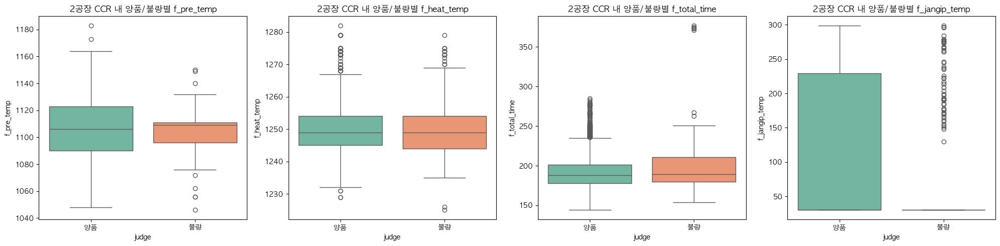

In [113]:
# 2공장 + CCR 데이터만 필터링
p2_ccr = final_df[(final_df['ap_plant'] == '2공장') & (final_df['f_jangip_gubun'] == 'CCR')]

# 주요 수치형 변수들 비교
compare_cols = ['f_pre_temp', 'f_heat_temp', 'f_total_time', 'f_jangip_temp']

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, col in enumerate(compare_cols):
    sns.boxplot(x='judge', y=col, data=p2_ccr, ax=axes[i], palette='Set2')
    axes[i].set_title(f'2공장 CCR 내 양품/불량별 {col}')

plt.tight_layout()
plt.show()

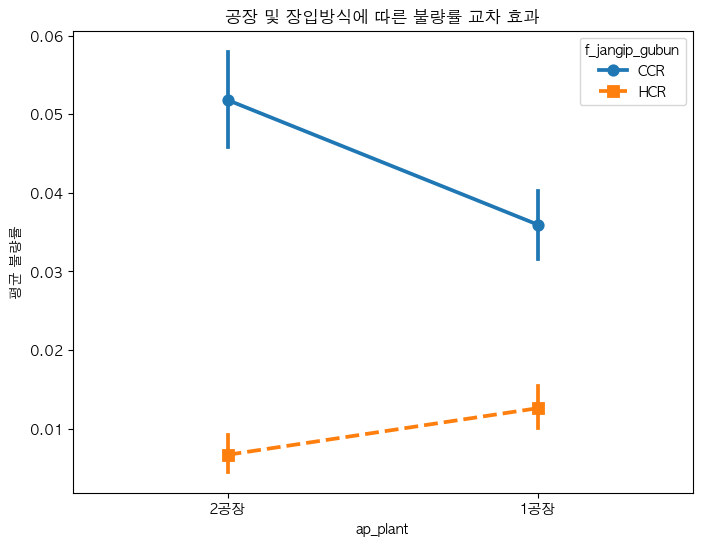

In [114]:
plt.figure(figsize=(8, 6))

# x축은 공장, y축은 불량률(mean), hue는 장입구분
sns.pointplot(x='ap_plant', y='is_bad', hue='f_jangip_gubun', data=final_df, markers=['o', 's'], linestyles=['-', '--'])

plt.title('공장 및 장입방식에 따른 불량률 교차 효과')
plt.ylabel('평균 불량률')
plt.show()

In [115]:
final_df[final_df['judge'] == '불량']['ap_plant'].value_counts()

ap_plant
1공장    328
2공장    301
Name: count, dtype: int64

In [116]:
import pandas as pd

# 1. 공장별(ap_plant) 판정(judge) 개수 집계
# judge가 '불량', '양품' 문자열인 경우와 0, 1 숫자인 경우 모두 대응 가능합니다.
plant_summary = pd.crosstab(final_df['ap_plant'], final_df['judge'], margins=True, margins_name='합계')

# 2. 불량률(%) 계산 (불량 개수 / 전체 개수 * 100)
# '불량' 컬럼 명칭은 데이터셋의 실제 값에 맞춰 확인이 필요합니다 (예: 1 또는 '불량')
# 여기서는 일반적인 기준인 1을 불량으로 가정합니다.
if 1 in plant_summary.columns:
    plant_summary['불량률(%)'] = (plant_summary[1] / plant_summary['합계'] * 100).round(2)
elif '불량' in plant_summary.columns:
    plant_summary['불량률(%)'] = (plant_summary['불량'] / plant_summary['합계'] * 100).round(2)

print("--- 공장별 불량 현황 요약 ---")
print(plant_summary)

--- 공장별 불량 현황 요약 ---
judge      불량     양품     합계  불량률(%)
ap_plant                           
1공장       328  13439  13767    2.38
2공장       301   9564   9865    3.05
합계        629  23003  23632    2.66


In [117]:
# CCR + 불량 필터
df_ccr_defect = final_df[
    (final_df['f_jangip_gubun'] == 'CCR') &
    (final_df['judge'] == '불량')
]

# 공장 순서 지정
order = ['1공장', '2공장']

# count + 순서 고정
counts = df_ccr_defect['ap_plant'].value_counts().reindex(order).fillna(0)

# 출력
for plant, cnt in counts.items():
    print(f"{plant} CCR 불량 개수: {int(cnt)}")
    print()

1공장 CCR 불량 개수: 238

2공장 CCR 불량 개수: 270



In [118]:
# CCR + 불량 필터
df_ccr_defect = final_df[
    (final_df['f_jangip_gubun'] == 'CCR') &
    (final_df['judge'] == '불량')
]

# 공장 순서 지정
order = ['A','B','C','D']

# count + 순서 고정
counts = df_ccr_defect['ap_shift'].value_counts().reindex(order).fillna(0)

# 출력
for plant, cnt in counts.items():
    print(f"{plant}조 CCR 불량 개수: {int(cnt)}")
    print()

A조 CCR 불량 개수: 112

B조 CCR 불량 개수: 187

C조 CCR 불량 개수: 91

D조 CCR 불량 개수: 118



In [119]:
final_df['hr_width']

0        1028
1        1245
2        1028
3        1028
4        1028
         ... 
23627    1249
23628    1257
23629    1249
23630    1249
23631    1249
Name: hr_width, Length: 23632, dtype: int64

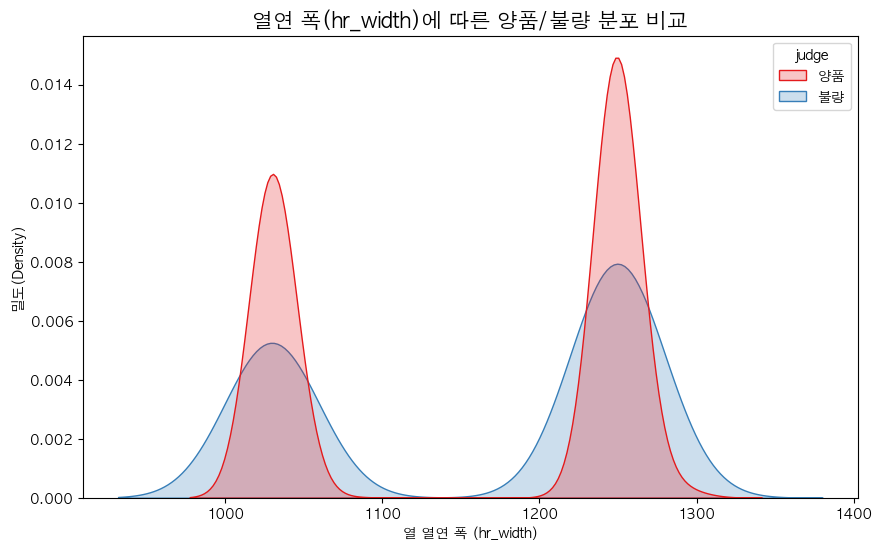

In [120]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

# judge별로 색상을 나누어 밀도 함수 그리기
# common_norm=False를 설정해야 각 그룹의 전체 합을 1로 계산하여 분포 모양 비교가 쉬워집니다.
sns.kdeplot(data=final_df, x='hr_width', hue='judge', fill=True, palette='Set1', common_norm=False)

plt.title('열연 폭(hr_width)에 따른 양품/불량 분포 비교', fontsize=15)
plt.xlabel('열 열연 폭 (hr_width)')
plt.ylabel('밀도(Density)')

plt.show()

In [121]:
# '양품' 혹은 0이 아닌 모든 것을 불량으로 간주하여 계산
# 실제 데이터에 맞게 '양품' 또는 0 중 하나를 선택하세요.

# 1000~1100 구간
w1 = final_df[(final_df['hr_width'] >= 1000) & (final_df['hr_width'] <= 1100)]
# 아래 조건은 '양품'이 아니고 0도 아닌 데이터를 불량으로 계산합니다.
bad_1 = w1[~w1['judge'].isin(['양품', 0, '0'])]
rate_1 = (len(bad_1) / len(w1)) * 100 if len(w1) > 0 else 0

# 1200~1300 구간
w2 = final_df[(final_df['hr_width'] >= 1200) & (final_df['hr_width'] <= 1300)]
bad_2 = w2[~w2['judge'].isin(['양품', 0, '0'])]
rate_2 = (len(bad_2) / len(w2)) * 100 if len(w2) > 0 else 0

print(f"1000~1100 구간 불량 개수: {len(bad_1)}건 / 불량률: {rate_1:.2f}%")
print(f"1200~1300 구간 불량 개수: {len(bad_2)}건 / 불량률: {rate_2:.2f}%")

1000~1100 구간 불량 개수: 249건 / 불량률: 2.51%
1200~1300 구간 불량 개수: 380건 / 불량률: 2.77%


### hr_width 불량률

In [122]:
import pandas as pd
import numpy as np

# 1. 구간 정의 (이미지 분석 내용 반영)
# Risk Zone: 40 미만 또는 44 ~ 48 사이
def categorize_speed(speed):
    if speed < 1000 or (1100 <= speed <= 1200) or (1200 <= speed):
        return 'Risk Zone'
    else:
        return 'Safe Zone'

# 2. 데이터 분류 적용
final_df['zone'] = final_df['hr_width'].apply(categorize_speed)

# 3. 구간별 불량률(Bad Rate) 계산
# '불량'이 1, '양품'이 0인 수치 데이터가 필요합니다. 
# (만약 텍스트라면 변환 과정 필요: df['is_bad'] = np.where(df['judge'] == '불량', 1, 0))
analysis = final_df.groupby('zone')['judge'].value_counts(normalize=True).unstack()

# 불량률만 추출 (불량 컬럼이 '불량' 또는 1이라고 가정)
bad_rate_by_zone = analysis['불량'] * 100

print("### 구간별 불량률 분석 결과 ###")
print(bad_rate_by_zone)
print("-" * 30)

# 4. 개선 효과 시뮬레이션 결과 출력
risk_zone_rate = bad_rate_by_zone.get('Risk Zone', 0)
safe_zone_rate = bad_rate_by_zone.get('Safe Zone', 0)
improvement = risk_zone_rate - safe_zone_rate

print(f"1. 위험 구간(Risk Zone) 불량률: {risk_zone_rate:.2f}%")
print(f"2. 안전 구간(Safe Zone) 불량률: {safe_zone_rate:.2f}%")
print(f"3. 개선 기대 효과: 속도 제어 시 불량률 약 {improvement:.2f}%p 감소 가능")

### 구간별 불량률 분석 결과 ###
zone
Risk Zone    2.774735
Safe Zone    2.505786
Name: 불량, dtype: float64
------------------------------
1. 위험 구간(Risk Zone) 불량률: 2.77%
2. 안전 구간(Safe Zone) 불량률: 2.51%
3. 개선 기대 효과: 속도 제어 시 불량률 약 0.27%p 감소 가능


In [123]:
print(final_df['zone'].value_counts())

zone
Risk Zone    13695
Safe Zone     9937
Name: count, dtype: int64


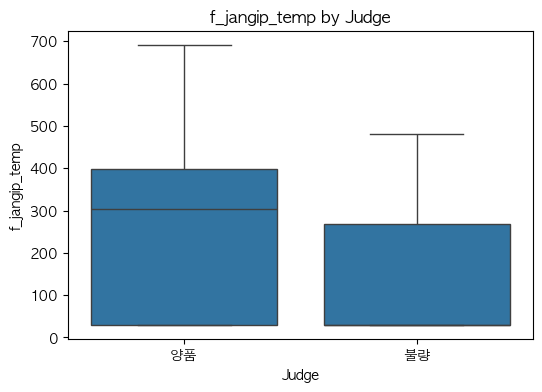

In [124]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 4))

sns.boxplot(
    x='judge',          # 양품 / 불량
    y='f_jangip_temp',  # 비교할 변수
    data=final_df
)

plt.title('f_jangip_temp by Judge')
plt.xlabel('Judge')
plt.ylabel('f_jangip_temp')

plt.show()

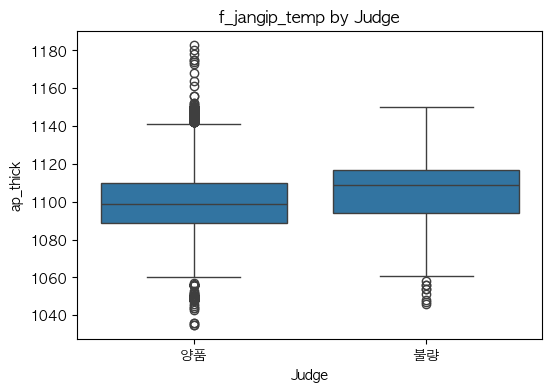

In [125]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6,4))

sns.boxplot(
    data=final_df,
    x='judge',
    y='f_pre_temp'
)

plt.title('f_jangip_temp by Judge')
plt.xlabel('Judge')
plt.ylabel('ap_thick')

plt.show()